## Names: Goh Yu Jie, Kent Chua Yi Jie

### StudentID: 2415901, 2415675

### Class: DAAA/2B/21

---

# DELE CA2

---

Objective of EDA in this GAN project

Goals
- Understand data structure and values clearly before modeling.

- Identify and prepare the 16 classes for generation.

- Understand distributions to plan GAN conditioning and balance.

- Identify image characteristics (range, shape, rotations) for preprocessing.

- Provide evidence of careful data handling in your report 



### `Load and inspect basic data shape`

In [1]:
# === Standard Libraries ===
import os
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

# === TensorFlow / Keras ===
import keras
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import (
    Input, Dense, Reshape, Flatten, Dropout, Embedding, Concatenate, multiply,
    BatchNormalization, Activation, ZeroPadding2D, LeakyReLU, UpSampling2D,
    Conv2D, Conv2DTranspose
)
from tensorflow.keras.optimizers import Adam
from keras import ops  # if using Keras Core ops explicitly

# === Scikit-learn ===
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

# === Load Data ===
df = pd.read_csv('emnist-letters-train.csv')

2025-08-10 14:01:45.349268: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-10 14:01:45.548292: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754805705.634570     470 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754805705.659299     470 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754805705.836251     470 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
# Basic shape
print("Shape of dataset:", df.shape)

Shape of dataset: (64828, 785)


- Data has 64,828 rows and 785 columns

In [3]:
# Show first few rows
print(df.head())

   24    0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.552  0.553  0.554  \
0  -2  142  142  142  142  142  142  142  142  142  ...    142    142    142   
1  15    0    0    0    0    0    0    0    0    0  ...      0      0      0   
2  14    0    0    0    0    0    0    0    0    0  ...      0      0      0   
3  -2  120  120  120  120  120  120  120  120  120  ...    120    120    120   
4  -1  131  131  131  131  131  131  131  131  200  ...    131    131    131   

   0.555  0.556  0.557  0.558  0.559  0.560  0.561  
0    142    142    142    142    142    142    142  
1      0      0      0      0      0      0      0  
2      0      0      0      0      0      0      0  
3    120    120    120    120    120    120    120  
4    131    131    131    131    131    131    131  

[5 rows x 785 columns]


- Does the columns got to do with pixel? 

- Each image in EMNIST is a 28 × 28 grid → 784 pixels. so one of them shows the identity?

### `Check columns and understand their meaning`

***

#### Purpose
- Identify which column is the label.

- Understand pixel data columns.

In [4]:
print("Columns:", df.columns.tolist())

Columns: ['24', '0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '0.10', '0.11', '0.12', '0.13', '0.14', '0.15', '0.16', '0.17', '0.18', '0.19', '0.20', '0.21', '0.22', '0.23', '0.24', '0.25', '0.26', '0.27', '0.28', '0.29', '0.30', '0.31', '0.32', '0.33', '0.34', '0.35', '0.36', '0.37', '0.38', '0.39', '0.40', '0.41', '0.42', '0.43', '0.44', '0.45', '0.46', '0.47', '0.48', '0.49', '0.50', '0.51', '0.52', '0.53', '0.54', '0.55', '0.56', '0.57', '0.58', '0.59', '0.60', '0.61', '0.62', '0.63', '0.64', '0.65', '0.66', '0.67', '0.68', '0.69', '0.70', '0.71', '0.72', '0.73', '0.74', '0.75', '0.76', '0.77', '0.78', '0.79', '0.80', '0.81', '0.82', '0.83', '0.84', '0.85', '0.86', '0.87', '0.88', '0.89', '0.90', '0.91', '0.92', '0.93', '0.94', '0.95', '0.96', '0.97', '0.98', '0.99', '0.100', '0.101', '0.102', '0.103', '0.104', '0.105', '0.106', '0.107', '0.108', '0.109', '0.110', '0.111', '0.112', '0.113', '0.114', '0.115', '0.116', '0.117', '0.118', '0.119', '0.120', '0.121'

- I remembered my teacher saying that the first column, '24', shows the idenitity of the images belonging to the 16 classes

- Does that mean the rest of the column have pixels stored in them, showing the pixel intensity?

#### Analysing the 784 columns to identiify the purpose

- We did not include '24' because it is a potential identifier for the letters

In [5]:
pixel_columns = df.columns.drop('24')  # Drop label column
min_value = df[pixel_columns].min().min()
max_value = df[pixel_columns].max().max()
print("Pixel value range:", min_value, "to", max_value)

Pixel value range: 0 to 345


In [6]:
# confirming the shape
print("Number of pixel columns:", len(pixel_columns))

Number of pixel columns: 784


<mark> Suspicious </mark>
- Pixel intensities in images (especially in EMNIST and most handwritten digit datasets) are usually in range 0 (black) to 255 (white).

    - Values higher than 255 mean:

        - Possible data corruption

        - Incorrect scaling

        - Wrong file parsing (e.g., type error or different encoding)

        - Or maybe values were already processed (e.g., augmented or encoded differently)

In [7]:
# check how many values are above 255
pixel_columns = df.columns.drop('24')

above_255 = (df[pixel_columns] > 255).sum().sum()
print("Total pixel values > 255:", above_255)

Total pixel values > 255: 1


#### We counted how many pixels and rows are affected (1) and we will now look into the rows flagged

In [8]:
# Find columns that have value of more than 255
max_per_column = df[pixel_columns].max()
columns_with_large = max_per_column[max_per_column > 255]
print("Columns with max value > 255:")
print(columns_with_large)

Columns with max value > 255:
0.16    345
dtype: int64


In [9]:
row_with_large = df[(df[pixel_columns] > 255).any(axis=1)]
print("Suspicious rows:")
print(row_with_large.head())

Suspicious rows:
       24   0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.552  0.553  \
48582  -1  89   89   89   89   89   89   89   89  200  ...     89     89   

       0.554  0.555  0.556  0.557  0.558  0.559  0.560  0.561  
48582     89     89     89     89     89     89     89     89  

[1 rows x 785 columns]


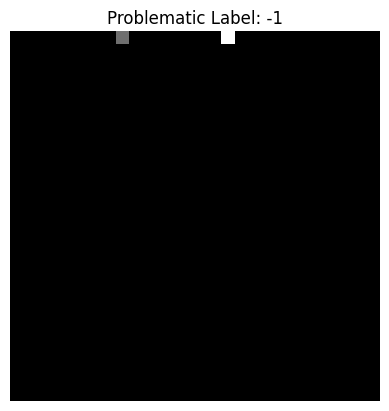

In [10]:
example_row = row_with_large.iloc[0, 1:].values
img = example_row.reshape(28, 28)
plt.imshow(img, cmap='gray')
plt.title(f"Problematic Label: {row_with_large.iloc[0, 0]}")
plt.axis('off')
plt.show()

<mark> Observations </mmark>
-  The image shown is not of useful purpose isnce it is mainly blank without any letters seen
-  It's likely noise, a corrupted sample, or mislabelled. Including such images in model training could:
    - Introduce meaningless data: No discernible feature means the model gets confused and learns nothing useful.
    - Reduce training efficiency: We waste computational resources processing irrelevant samples.
    - Compromise accuracy: It may lead to misclassifications or bias if treated as valid input.


#### Decision to deal with suspicious image
1) Clip
   - Pros
        - You do not lose any samples.
    - Cons
        - You "hide" the fact that there was an issue.
        - If the row has other unexpected issues (e.g., label mismatch), it may still affect training.


2) Drop
   - Pros
        - Completely removes the potentially corrupted data.
        - Guarantees no "weird" pixel values left.
        - Keeps pixel value range standard (0–255).
    - Cons
        - You lose one data point (not serious since you have many).

In [11]:
rows_to_drop = df[(df[pixel_columns] > 255).any(axis=1)].index

# Drop it
df = df.drop(rows_to_drop).reset_index(drop=True)

print(f"Dropped {len(rows_to_drop)} row(s) with pixel values > 255.")

Dropped 1 row(s) with pixel values > 255.


In [12]:
above_255_check = (df[pixel_columns] > 255).sum().sum()
print("Total pixel values > 255:", above_255_check)

Total pixel values > 255: 0


- We found one row containing pixel values exceeding the standard 0–255 grayscale range, suggesting a possible data corruption. As this was rare and to ensure data integrity, we decided to drop the row rather than clip it.

#### Outputting an example of a valid image with pixel values in the range of (0,255)

In [13]:
print("Example pixel values from first row:")
print(df[pixel_columns].iloc[0].values[:20])  # Show first 20 pixel columns only, to avoid clutter

Example pixel values from first row:
[142 142 142 142 142 142 142 142 142 142 142 142 142 142 142 142 142 142
 142 142]


#### Why only first 20 columns? 

- To visually inspect some actual pixel intensity values in detail, without printing hundreds of columns.

- To verify that columns after the label column represent pixel intensities, we printed a preview of 20 pixel values from the first row. These values matched the expected grayscale intensity range (0–255), supporting our understanding that each row corresponds to a flattened 28×28 image

<mark> Conclusion </mark>
- The 784 columns is consistent with a 28 by 28 image flattened into a row

- Each row represents one image of a letter in a specific class

- The values in the 784 columns repsent individula pizel intesity values

***

### Examining the values under the first column (potential identifier)

In [14]:
print("Unique values in '24':", sorted(df['24'].unique()))

Unique values in '24': [np.int64(-2), np.int64(-1), np.int64(1), np.int64(2), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(9), np.int64(10), np.int64(12), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(20), np.int64(24), np.int64(26)]


24
-2     4856
-1     5383
 1     3396
 2     3396
 4     3398
 5     3437
 6     3394
 7     3385
 9     3428
 10    3402
 12    3415
 14    3365
 15    3408
 16    3430
 17    3435
 20    3436
 24    3436
 26    3427
Name: count, dtype: int64


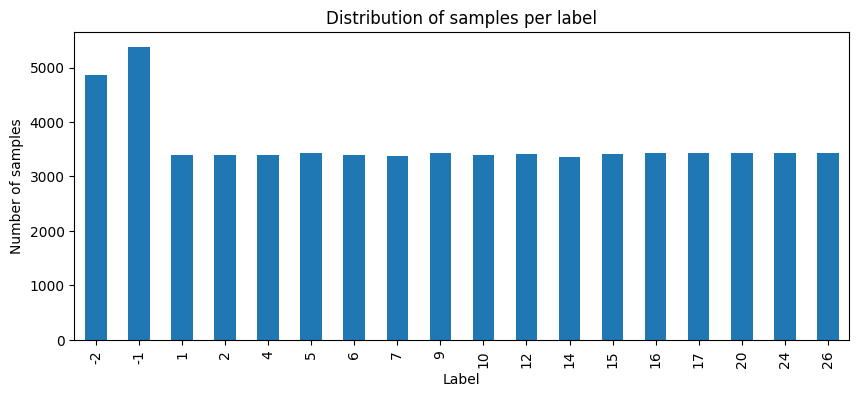

In [15]:
label_counts = df['24'].value_counts().sort_index()
print(label_counts)

plt.figure(figsize=(10, 4))
label_counts.plot(kind='bar')
plt.title("Distribution of samples per label")
plt.xlabel("Label")
plt.ylabel("Number of samples")
plt.show()

### <mark> Objectives </mark>

#### Finding out the label meanings

- Figure out which labels correspond to which letters.

- Confirm that only 16 required classes are used.

We kind of undertsand that for it to be valid labels, it would naturraly mean numbers ranging from 1-26 sincce there are 26 alphabets in total

<mark> We will further analyse the negative labels although it kind of looks wrong for it to be negative

- In EMNIST or other extended MNIST datasets, sometimes negative values indicate "unlabeled" or "special class placeholders."

- They might also be mislabeled rows or "unused" placeholders in a merged dataset.

## Visualing the images related to both positive and negative labels

#### Images in the MNIST dataset that are entirely blank (fully black or contain no discernible digits), they are useless for training a digit classification model and should be dropped.

- No Information: A blank image provides no signal about what digit it represents. It's essentially noise or missing data in the context of digit recognition.

- Skewed Training: Including blank images in your training data could confuse the model. It might learn to associate "blank" with a specific digit (e.g., classifying all blanks as '0' if it's the most frequent blank, which is incorrect) or simply struggle to learn meaningful features.

- Degraded Performance: Training on irrelevant data can lead to a less accurate and less robust model. The model's ability to generalize to actual digits would be hampered.

- Computational Waste: Processing and training on these useless images consumes computational resources (time and memory) without providing any benefit.

In [16]:
def plot_examples(label, n=50, cols=10):
    """
    Show examples for a specific label.
    
    Parameters:
    - label: which label to display
    - n: number of samples to show
    - cols: number of columns per row
    """
    samples = df[df['24'] == label].head(n)
    rows = int(np.ceil(n / cols))

    # Define figure size: each image ~2 inches wide and tall
    plt.figure(figsize=(cols * 2, rows * 2))
    
    for i in range(len(samples)):
        img = samples.iloc[i, 1:].values.reshape(28, 28)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(f"{label}", fontsize=8)

    plt.tight_layout()
    plt.show()

- checked each label visually and matched them to actual letters.

- identified whether they were uppercase or lowercase.

- analyzed what kind of rotations or flips might be needed later.

### <mark> Examining Label '-2'

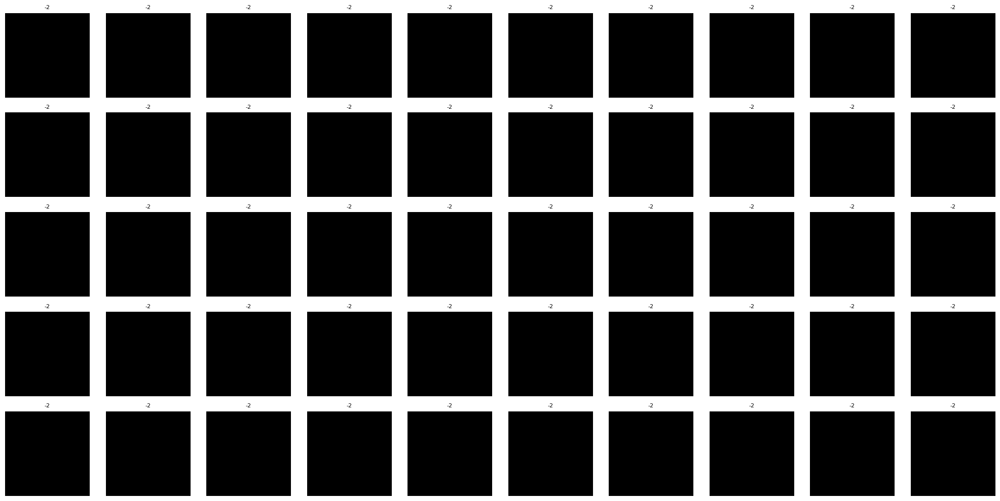

In [17]:
plot_examples(-2)

- We see that most if not all of it are black images 
- They are not related to the letters we are examining 

### <mark> Examining Label '-1'

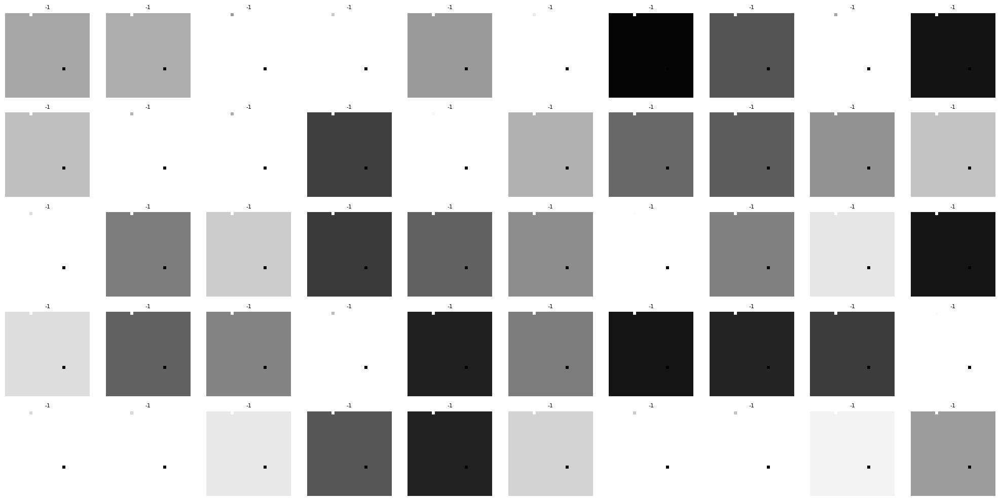

In [18]:
plot_examples(-1)

- All images, similar to label '-1' do not have letters that can be seen 

### Removing the 2 labels , '-2','-1'

In [19]:
label_column = '24'

# Remove rows where label is -2 or -1
df_cleaned = df[~df[label_column].isin([-2, -1])].copy()

# Check the shape after removal
print("Original shape:", df.shape)
print("New shape after removing labels -2 and -1:", df_cleaned.shape)

# Check if labels are still present
print("Remaining unique labels:", sorted(df_cleaned[label_column].unique()))

Original shape: (64827, 785)
New shape after removing labels -2 and -1: (54588, 785)
Remaining unique labels: [np.int64(1), np.int64(2), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(9), np.int64(10), np.int64(12), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(20), np.int64(24), np.int64(26)]


Labels -2 and -1:

    - Visualized images showed that:

    - Label -2: Fully black images (empty).

    - Label -1: Images with a single dot or almost empty.

- Decision: These two labels are not useful and should be removed during data wrangling.


Other labels (1, 2, 4, ..., 26):

    - Each label corresponds to a letter, some of which appear in both uppercase and lowercase.

    - Some letters have samples in various orientations (rotated or flipped).



### <mark> Examining the rest of the images

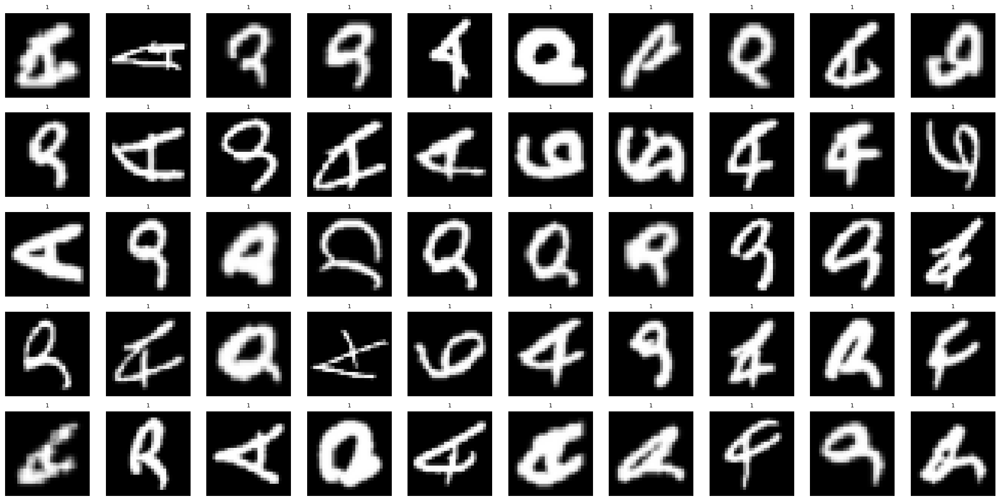

None


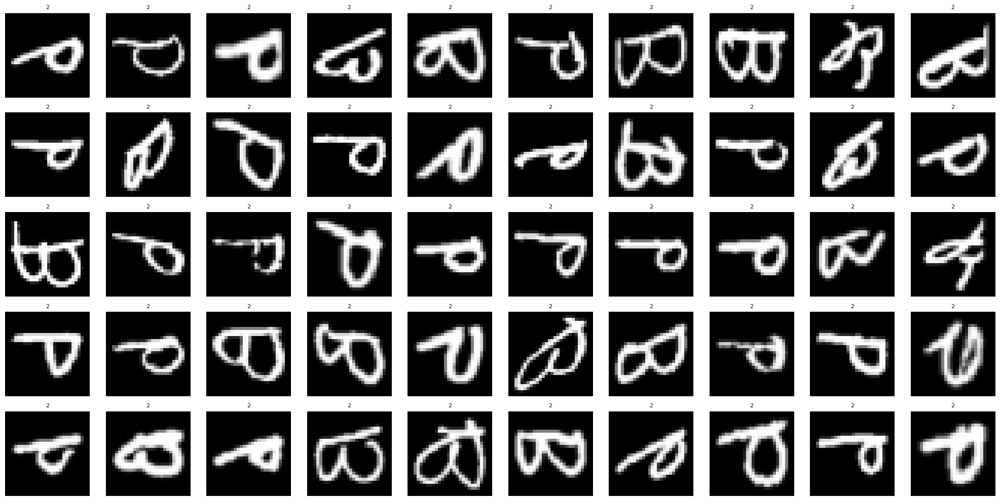

None


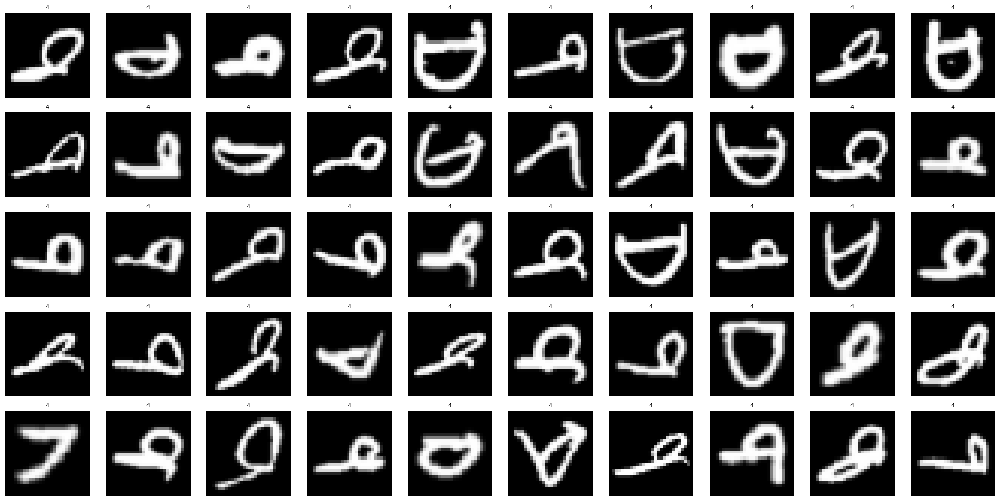

None


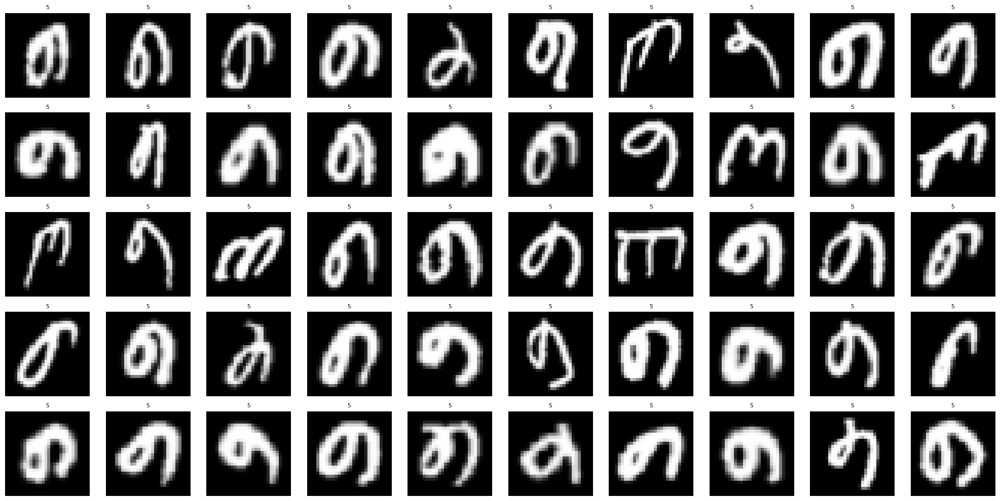

None


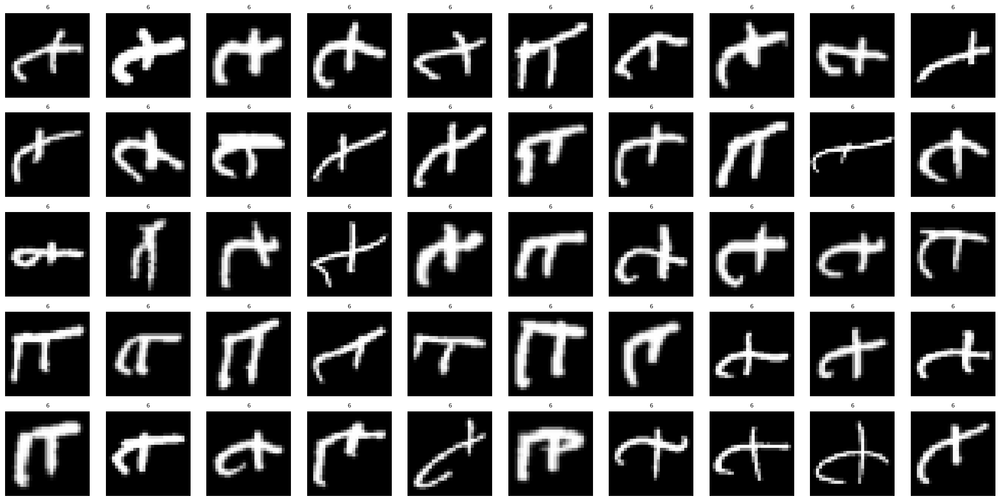

None


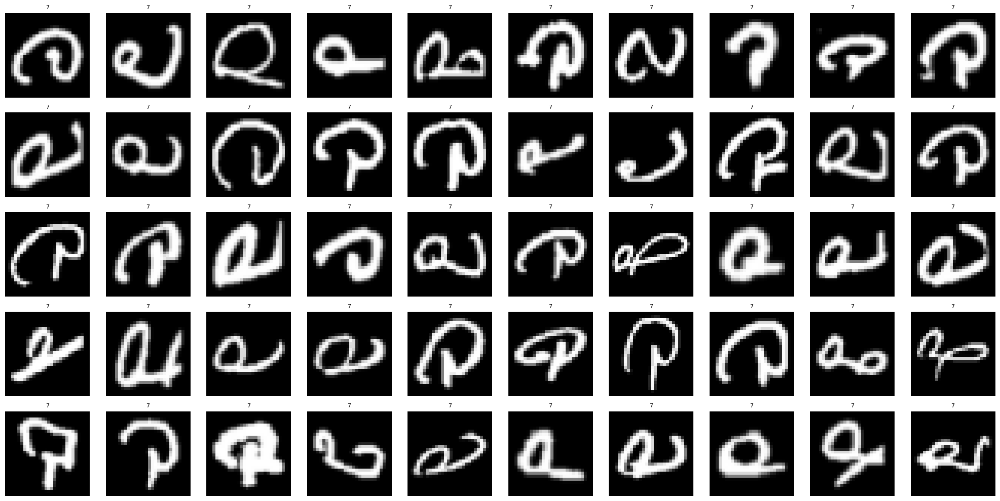

None


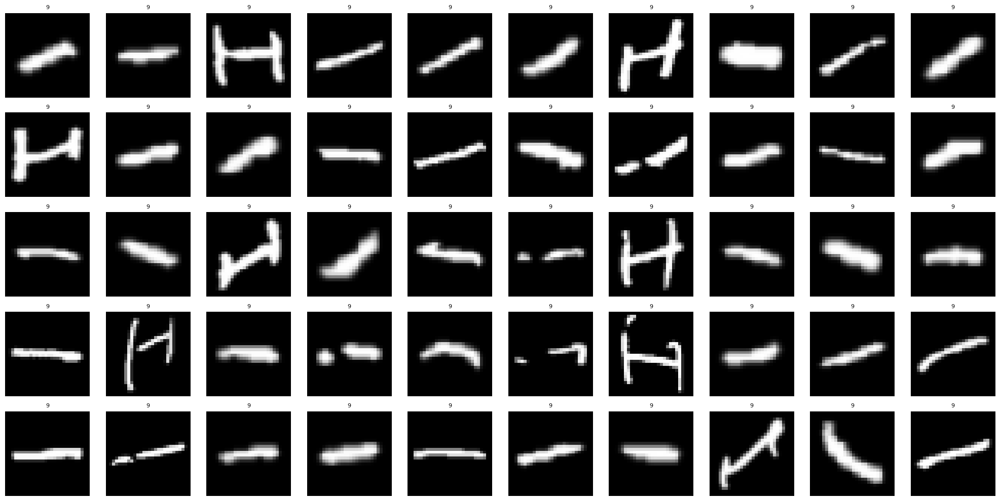

None


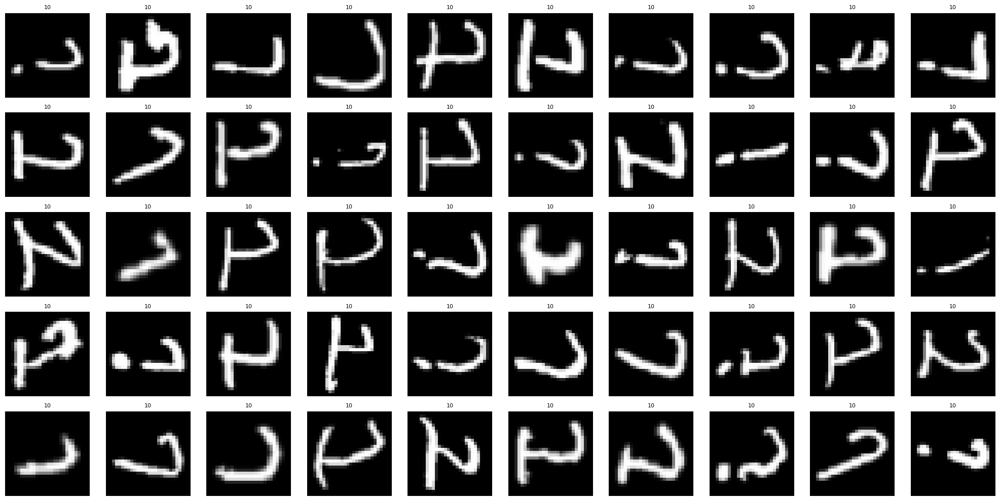

None


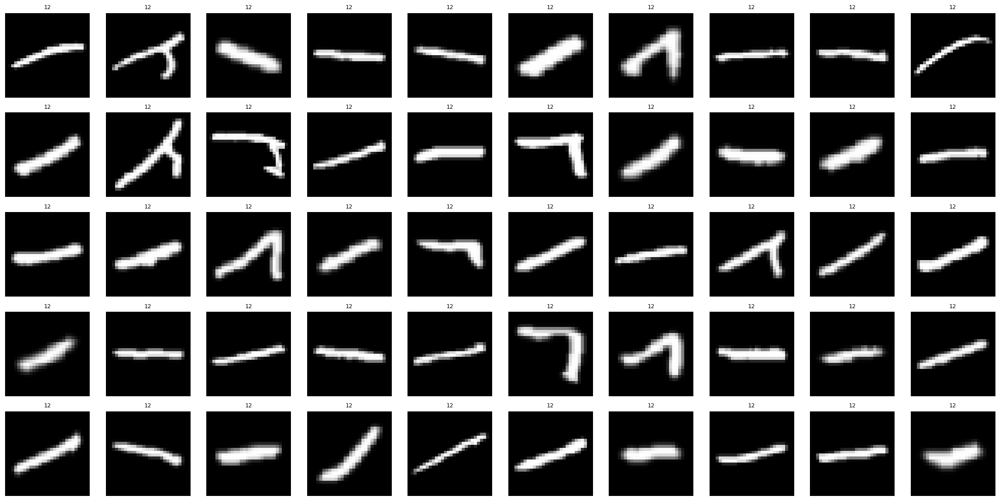

None


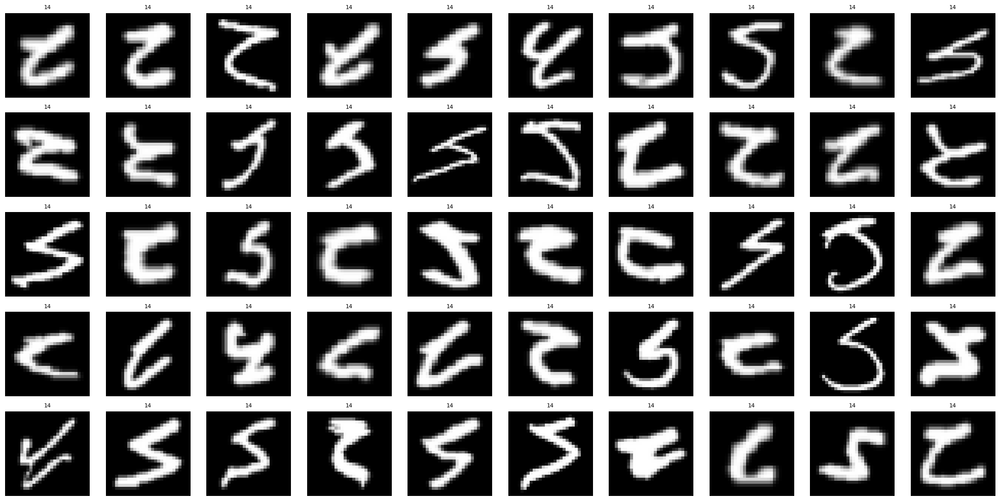

None


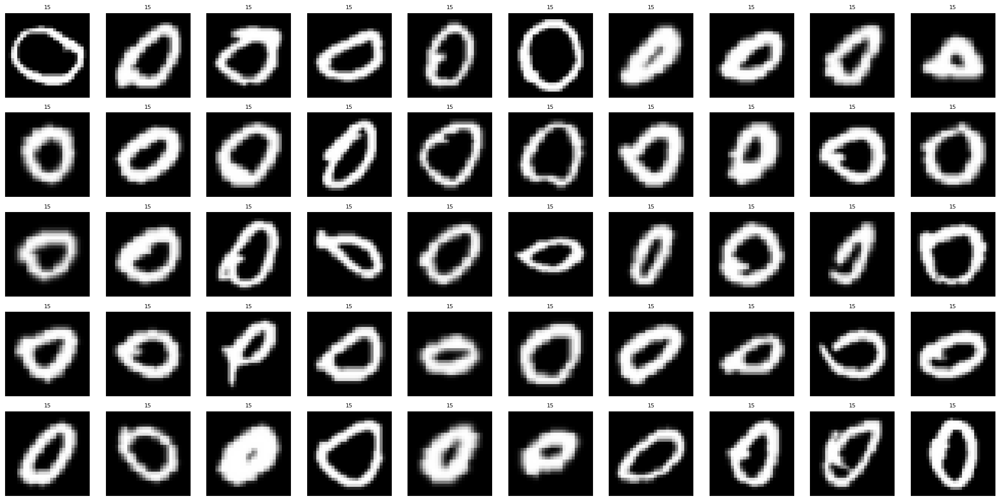

None


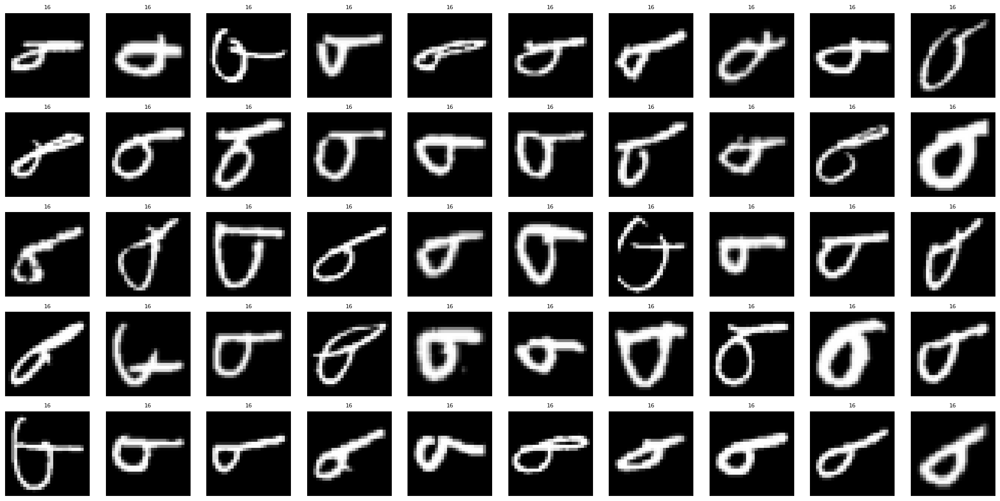

None


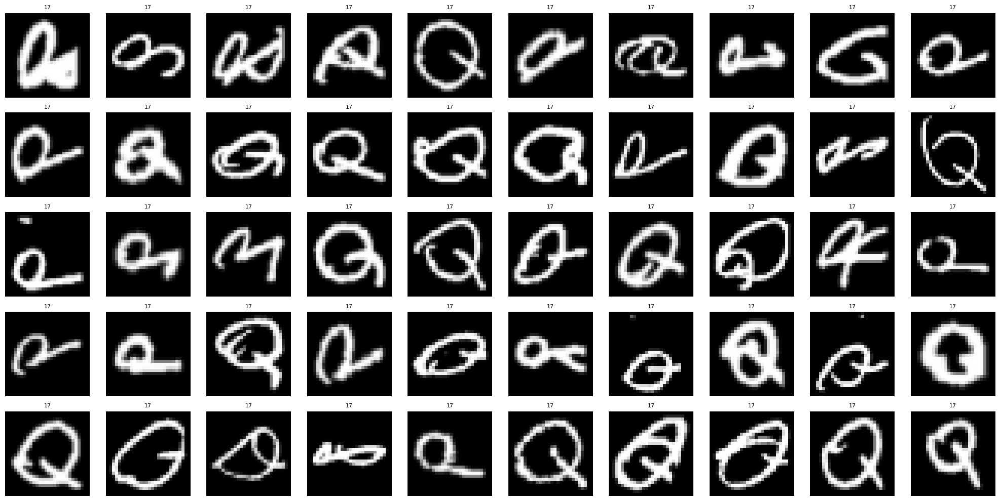

None


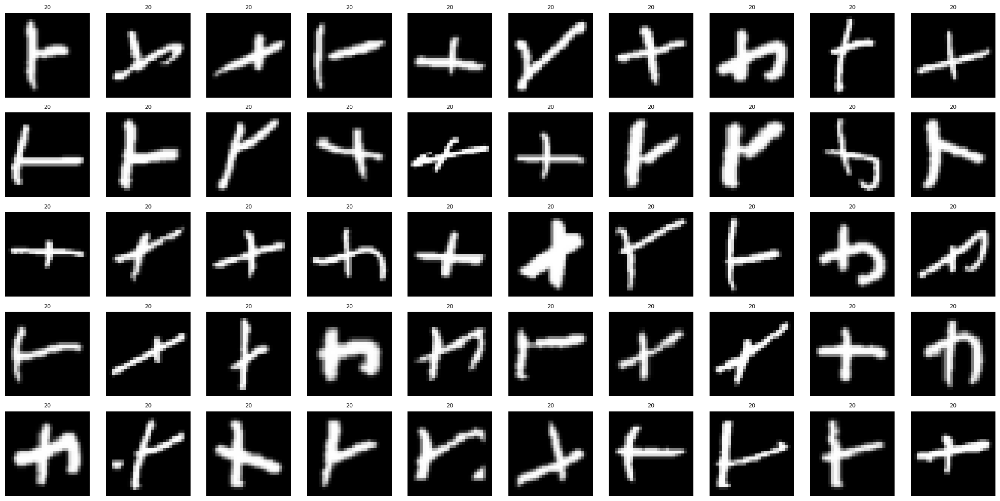

None


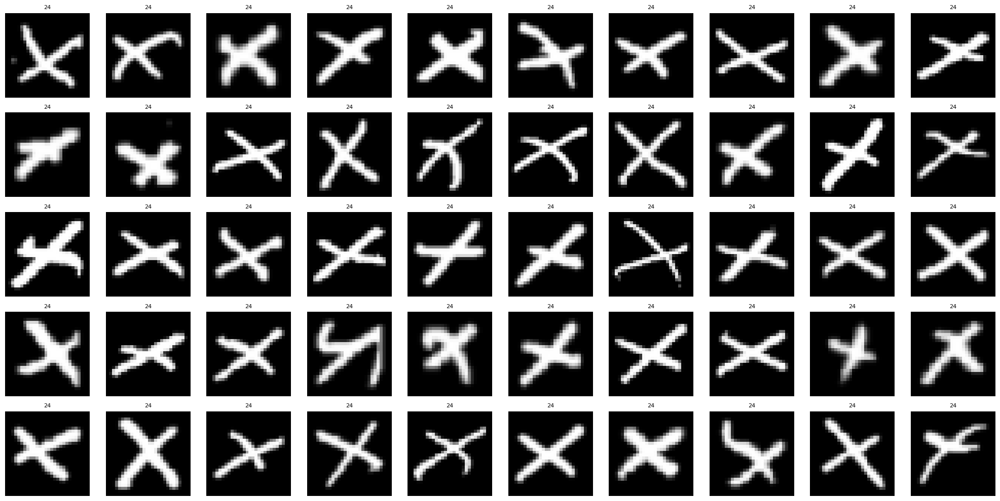

None


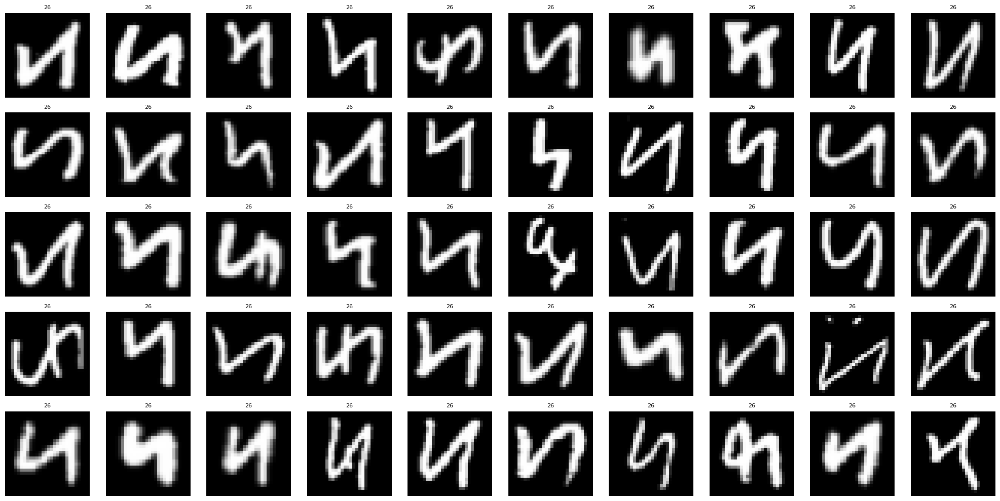

None


In [20]:
for i in sorted(df_cleaned['24'].unique()):
    print(plot_examples(i)) 

- I found that labels -2 and -1 are not useful images → Drop them.
  
- Labels 1, 2, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 20, 24, 26 → represent valid letters (some need rotation/flip).

- Some images inside each label may be messy or ambiguous → further detailed cleaning can be done later if needed.

### Detailed Label Summary (EDA)

| Label | Expected Letter | Uppercase / Lowercase Seen | What I Saw                               | Issues Observed                                       | Planned Correction                          |
|---------|----------------|---------------------------|------------------------------------------|-----------------------------------------------------|---------------------------------------------|
| **-2** | None            | —                         | Fully black images                       | No valid letters                                    | Drop this label                             |
| **-1** | None            | —                         | Dot or nearly empty images               | No valid letters                                    | Drop this label                             |
| **1**  | A              | Both                      | Clear A shapes                           | Uppercase rotated 90° clockwise                     | Rotate uppercase 90° clockwise; lowercase OK(maybe can flip?) |
| **2**  | B              | Both                      | B shapes, some flipped                   | Lowercase rotated 90° clockwise & flip              | Rotate lowercase 90° clockwise & flip; uppercase similar treatment needed |
| **4**  | E              | Both                      | E shapes                                 | Lowercase rotated 90° clockwise                     | Rotate lowercase 90° clockwise; uppercase needs further check |
| **5**  | D              | Both                      | D shapes                                 | Lowercase rotated 90° clockwise & flip; uppercase rotated 90° anti-clockwise | Rotate lowercase 90° clockwise & flip; uppercase 90° anti-clockwise |
| **6**  | F              | Both                      | F shapes                                 | Lowercase rotated 90° clockwise & flip             | Rotate lowercase 90° clockwise & flip; uppercase needs check |
| **7**  | G              | Both                     | Mix of E, b, p, B (not very sure)                       | Possible mislabeling; unclear shapes               | Further investigate                         |
| **9**  | I              | Both                      | I shapes                                 | Both rotated 90° anti-clockwise                    | Rotate both 90° anti-clockwise             |
| **10** | J              | Both                      | J shapes                                 | Both rotated 90° clockwise and flip                         | Rotate both 90° and Flip clockwise                  |
| **12** | L              | Both                      | L shapes, similar to I                   | Lowercase rotated 90° clockwise; uppercase needs possible flip and rotation | Rotate lowercase 90° clockwise; uppercase rotate & flip together |
| **14** | N              | Both            | n shape                                  | Both cases rotated 90° clockwise & flip             | Rotate lowercase 90° clockwise & flip      |
| **15** | O              | Both                      | O shapes, slightly distorted             | Shape seems correct, but O may not be perfectly round | No major correction needed; possibly minor alignment |
| **16** | P              | Both                      | P shapes                                 | Lowercase rotated 90° clockwise & flip             | Rotate lowercase 90° clockwise & flip      |
| **17** | Q              | Both                      | Q shapes and unknown shapes              | Lowercase rotated 90° clockwise & flip; uppercase generally correct | Rotate lowercase 90° clockwise & flip; uppercase OK |
| **20** | T              | Both                      | T shapes                                 | Both rotated 90° anti-clockwise                    | Rotate both 90° anti-clockwise            |
| **24** | X              | Both (looks similar)     | X shapes                                 | Shapes mostly fine                                 | No correction needed                        |
| **26** | Z              | Both                      | Z shapes (normal and dashed)             | Normal: rotate 90° clockwise & flip; dashed: further check needed | Rotate normal 90° clockwise & flip; dashed investigate further |

### <mark> Questions about the rotation and flipping of the letters seen

#### Should you use the same rotation & flip for all classes?

- Looking at the images above, we can see that almost all letters if not all have to be rotated 90 degrees clockwise and flipped to face the right direction

- Some of the letters, especially the ones that have parallel sides like 'O' does not need to be flipped or rotated


#### Consistent transformations
- We want to apply consistent steps (e.g., "rotate 90° clockwise and flip") to all letters so that your pipeline is simple and easy to maintain.

- Advantages of consistent cleaning:

    - Code is simpler and easier to debug

    - Fewer special cases (you don’t need to handle each label separately)

### Check label distribution

- Confirm that I have enough samples per class.

- See if any classes are imbalanced (too few samples).

In [21]:
label_counts = df_cleaned['24'].value_counts().sort_index()
print(label_counts)

24
1     3396
2     3396
4     3398
5     3437
6     3394
7     3385
9     3428
10    3402
12    3415
14    3365
15    3408
16    3430
17    3435
20    3436
24    3436
26    3427
Name: count, dtype: int64


Purpose:
- Check how balanced your class distribution is visually.

What to look out for:
- Classes with much fewer or more samples than others → might require balancing or data augmentation.

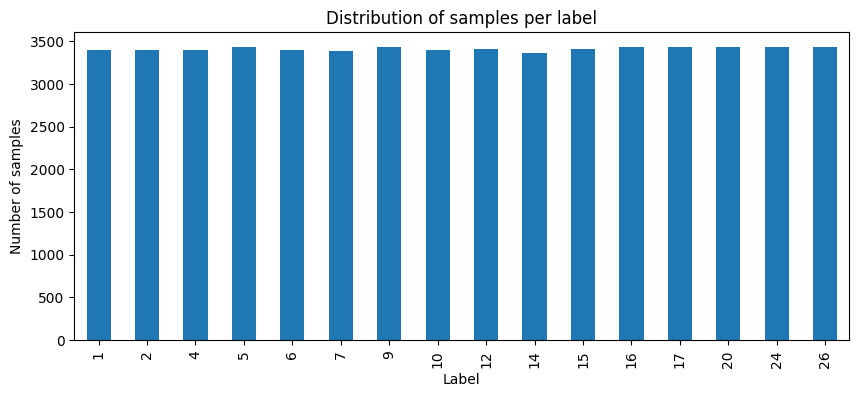

In [22]:
plt.figure(figsize=(10, 4))
label_counts.plot(kind='bar')
plt.title("Distribution of samples per label")
plt.xlabel("Label")
plt.ylabel("Number of samples")
plt.show()

## Check pixel value statistics

- Check overall distribution of pixel intensities.

- See if images are mostly empty (black) or mostly bright.

Pixel value range: 0 to 255
Pixel value mean: 43.94
Pixel value std: 84.49


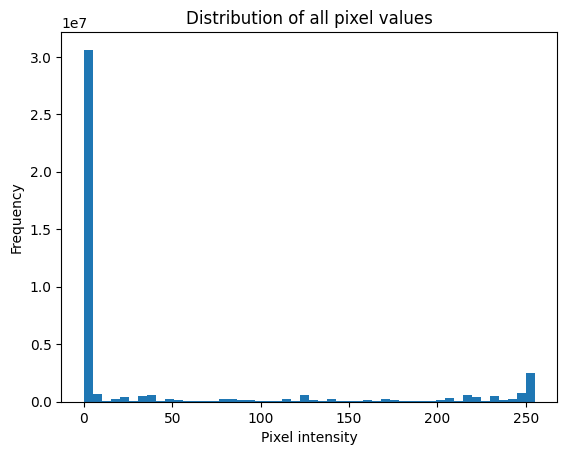

In [23]:
# Flatten all pixel values into one series
all_pixels = df_cleaned[pixel_columns].values.flatten()

print(f"Pixel value range: {all_pixels.min()} to {all_pixels.max()}")
print(f"Pixel value mean: {all_pixels.mean():.2f}")
print(f"Pixel value std: {all_pixels.std():.2f}")

plt.hist(all_pixels, bins=50)
plt.title("Distribution of all pixel values")
plt.xlabel("Pixel intensity")
plt.ylabel("Frequency")
plt.show()

<mark> Is it an issue that most of the pixel values are between 0-10 </mark>

- Mean of 43.94: A mean around 44 is relatively low, especially for black-and-white images, where we'd expect the mean to be closer to 127 (mid-range). A mean close to 44 might indicate that the majority of the image is dark or black, which makes sense for black-and-white images. This could suggest that GAN is generating images that are dark overall (true).

- Standard Deviation of 84.49: A standard deviation this high means that there is a large spread of pixel values. The images are likely to have a fair amount of contrast, with both dark and light areas appearing in the image.

It would not be an issue if I could see the letters and the images look plausible

### Check for duplicates

- Remove accidental duplicate images.

In [24]:
# Identify duplicates across all columns
duplicates = df_cleaned[df_cleaned.duplicated(keep=False)]

print(f"Number of duplicate rows found: {duplicates.shape[0]}")

Number of duplicate rows found: 4


- Some duplicates may be valid (e.g., two identical samples can occur naturally if handwritten letters are similar).

- We need to check if they belong to different classes (which would signal an error).

- We might want to know how many duplicates, which classes they belong to, and whether they impact class balance.

In [25]:
# Check distribution of labels among duplicates
print(duplicates['24'].value_counts().sort_index())

24
6     2
26    2
Name: count, dtype: int64


In [26]:
# Show first few duplicate rows
print(duplicates.head())

       24  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.552  0.553  \
5636   26  0    0    0    0    0    0    0    0    0  ...      0      0   
19971  26  0    0    0    0    0    0    0    0    0  ...      0      0   
41892   6  0    0    0    0    0    0    0    0    0  ...      0      0   
55969   6  0    0    0    0    0    0    0    0    0  ...      0      0   

       0.554  0.555  0.556  0.557  0.558  0.559  0.560  0.561  
5636       0      0      0      0      0      0      0      0  
19971      0      0      0      0      0      0      0      0  
41892      0      0      0      0      0      0      0      0  
55969      0      0      0      0      0      0      0      0  

[4 rows x 785 columns]


#### Visualising them

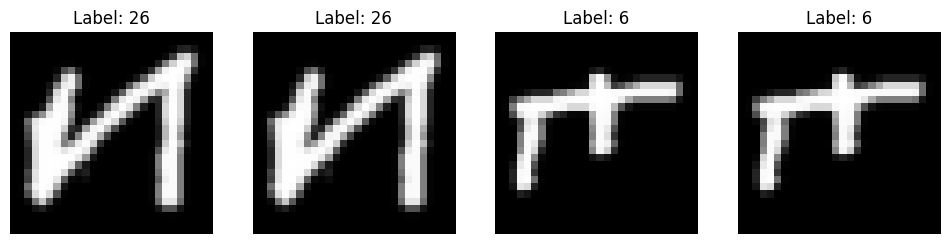

In [27]:
# Columns containing pixel data
pixel_columns = [col for col in df_cleaned.columns if col != '24']

# Example: plot first 4 duplicate samples
sample_duplicates = duplicates.head(4)

fig, axs = plt.subplots(1, 4, figsize=(12, 4))
for i, (_, row) in enumerate(sample_duplicates.iterrows()):
    img = row[pixel_columns].values.reshape(28, 28)
    axs[i].imshow(img, cmap='gray')
    axs[i].set_title(f"Label: {int(row['24'])}")
    axs[i].axis('off')
plt.show()

- We will remove since they do not add any value 

In [28]:
# Remove exact duplicates (keeping first occurrence)
df_cleaned_no_dupes = df_cleaned.drop_duplicates(keep='first').copy()

# Check new shape
print("Shape before removing duplicates:", df_cleaned.shape)
print("Shape after removing duplicates:", df_cleaned_no_dupes.shape)

Shape before removing duplicates: (54588, 785)
Shape after removing duplicates: (54586, 785)


In [29]:
print("Any remaining duplicates?", df_cleaned_no_dupes.duplicated().any())

Any remaining duplicates? False


***

## Summary of EDA

1) `Basic info & structure`
    - df.shape, df.head(), df.columns

    - Realized everything was string, so converted to integers later.

    - Identified that column '24' is the label column, and the rest (columns '0', '0.1', …) are pixel columns.

2) `Understanding columns & pixel value range`
    - Investigated pixel columns → values ranged 0 to 345, but most should be 0–255.

    - Found one single row with value 345 in column 0.16 → removed that row after visual check.

3) `Label distribution & understanding classes`
    - Analyzed unique labels from column '24', found labels: (-2, -1, 1, 2, 4, …, 26).

    - Visualized sample images for each label → understood which letters they represent, whether they were valid, and their orientation needs.

4) `Removed unusable label rows`
    - Decided to remove rows with labels -2 (all black) and -1 (only a dot).

    - After removal, label distribution checked → balanced.

5) `Pixel value distribution analysis`
    - Checked pixel value range after removing the faulty row → now 0–255.

    - Calculated pixel value mean (43.94), std (84.49), and distribution (most in 0–10).

***

# Data Wrangling

---

<mark> Steps to be taken </mark>
1) Reset index
2) Correct rotations & flips
3) Normalize pixel values
4)  Separate features and labels


### 1) Reset Index

- After removals, always reset index to keep things clean.

In [30]:
df_cleaned_no_dupes = df_cleaned_no_dupes.reset_index(drop=True)

In [31]:
print(df_cleaned_no_dupes)

       24  0  0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  ...  0.552  0.553  \
0      15  0    0    0    0    0    0    0    0    0  ...      0      0   
1      14  0    0    0    0    0    0    0    0    0  ...      0      0   
2       1  0    0    0    0    0    0    0    0    0  ...      0      0   
3      10  0    0    0    0    0    0    0    0    0  ...      0      0   
4       5  0    0    0    0    0    0    0    0    0  ...      0      0   
...    .. ..  ...  ...  ...  ...  ...  ...  ...  ...  ...    ...    ...   
54581  26  0    0    0    0    0    0    0    0    0  ...      0      0   
54582  16  0    0    0    0    0    0    0    0    0  ...      0      0   
54583   2  0    0    0    0    0    0    0    0    0  ...      0      0   
54584  20  0    0    0    0    0    0    0    0    0  ...      0      0   
54585   1  0    0    0    0    0    0    0    0    0  ...      0      0   

       0.554  0.555  0.556  0.557  0.558  0.559  0.560  0.561  
0          0      0      0      0  

### 2) Rotating and Flipping

`Option 1`: Per-label specific transformations (recommended for precision)

    - For each label, we decide specifically:

        - Should it be rotated?

        - Should it be flipped?

- This is the most precise and ensures each letter is actually correct in its final appearance.

- It gives us full control and makes sure each letter is really in its correct final orientation.
<br>

`Option 2`: Apply the same transformation to all (simpler, but riskier)

    - If we absolutely want simplicity, we can choose a "universal" transformation (e.g., rotate 90° clockwise and flip).

    - But then we must verify that all letters look correct after this — if some become wrong, you cannot use this.

<mark> Decision chosen: </mark>

We decided to go with the simple and consistent option 2. Eventhough it has more risks to it, we can and will cautiously verifiy that all letters look correct

Plotting 50 images for class 1 (A,a)


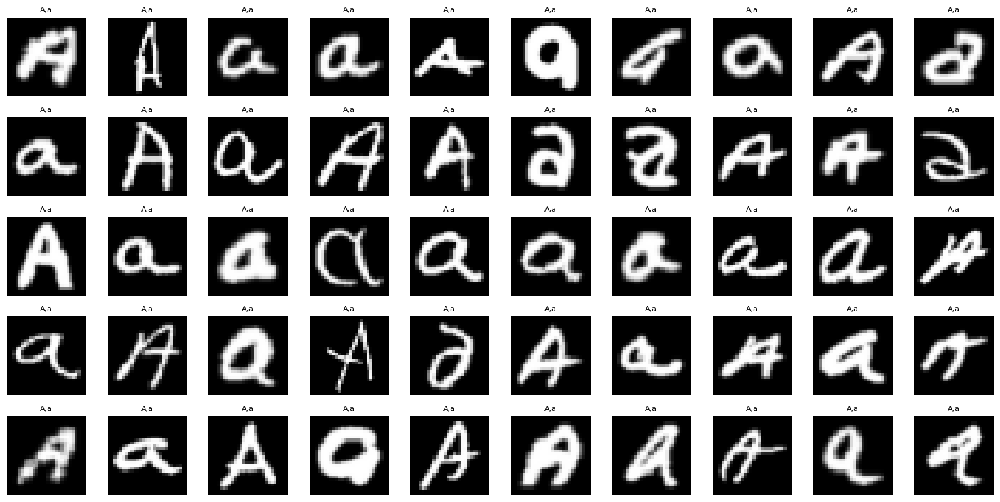

Plotting 50 images for class 2 (B,b)


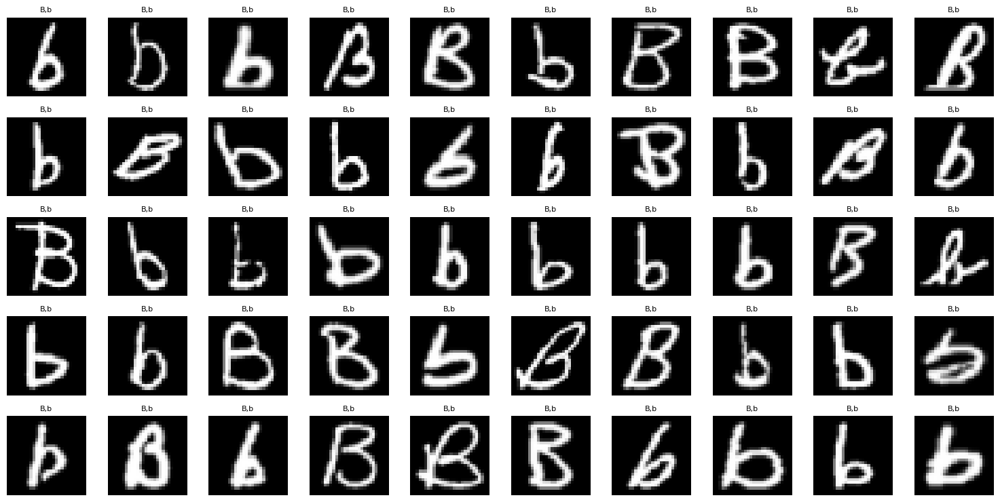

Plotting 50 images for class 4 (D,d)


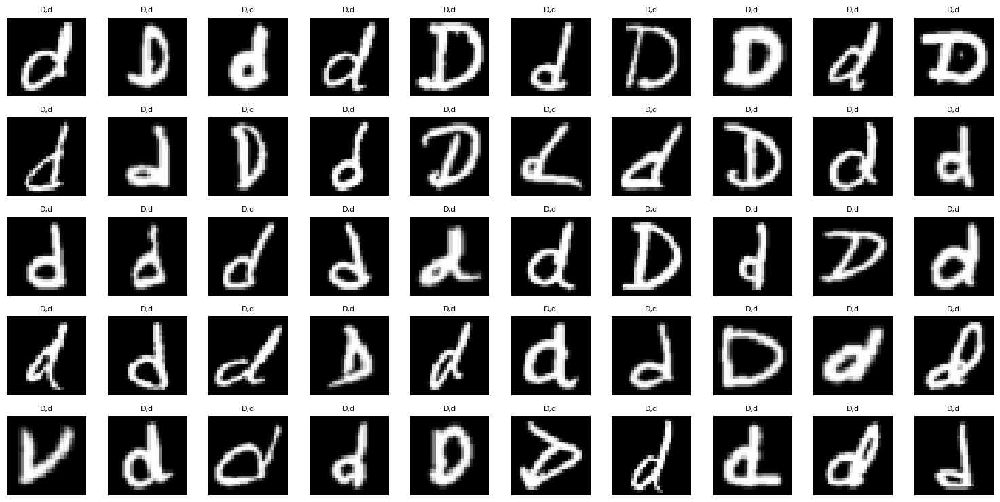

Plotting 50 images for class 5 (E,e)


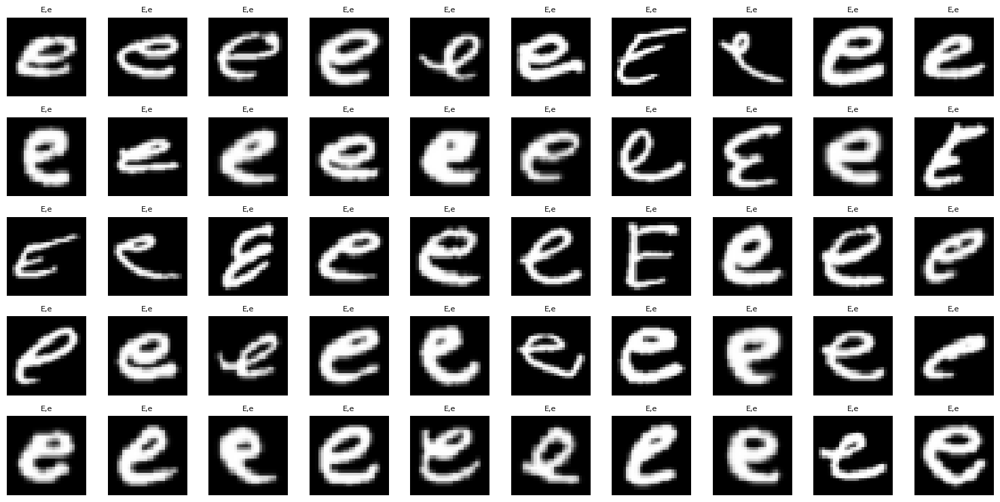

Plotting 50 images for class 6 (F,f)


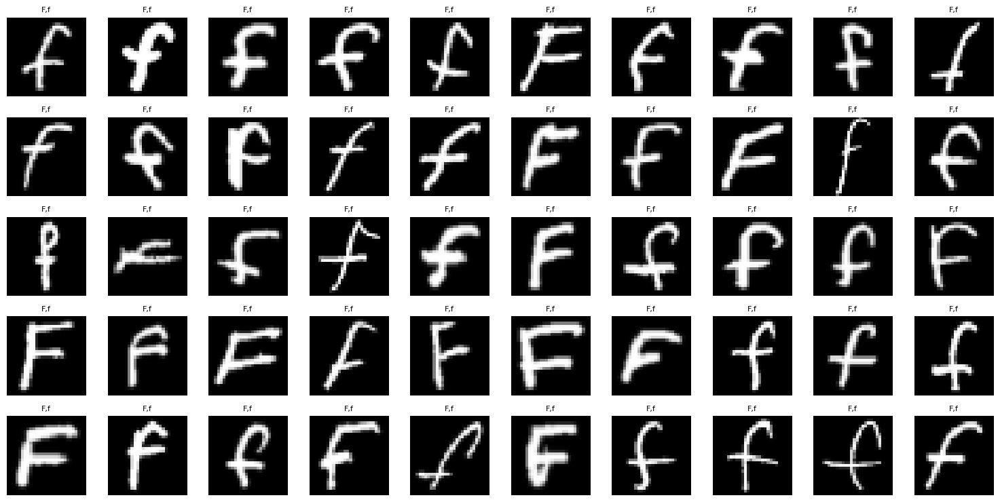

Plotting 50 images for class 7 (G,g)


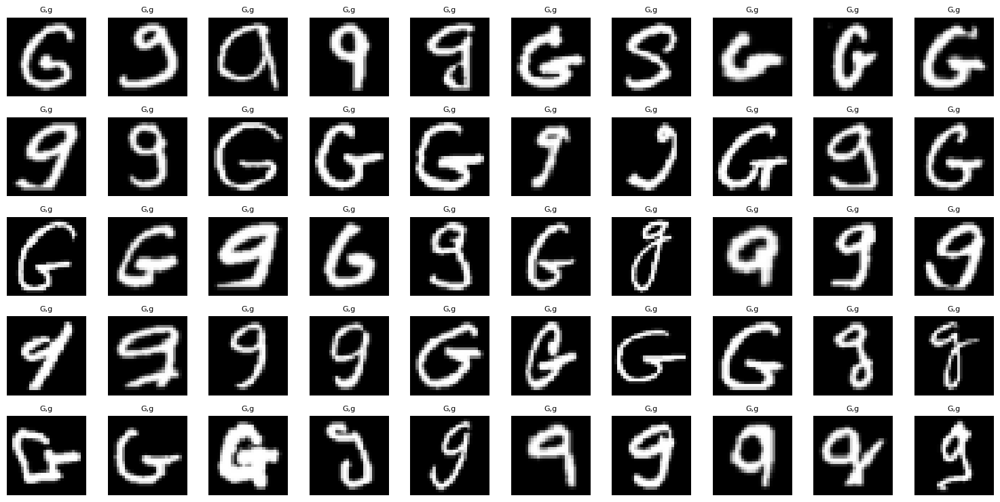

Plotting 50 images for class 9 (I,i)


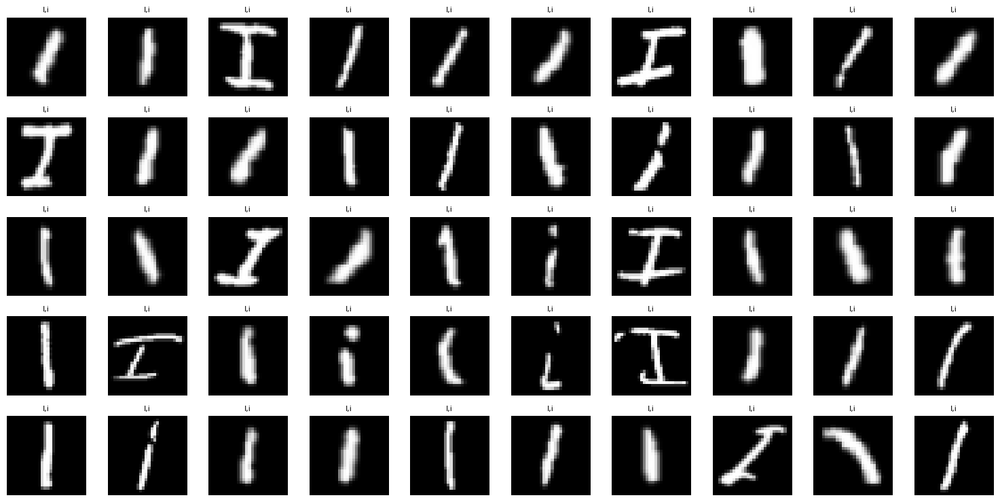

Plotting 50 images for class 10 (J,j)


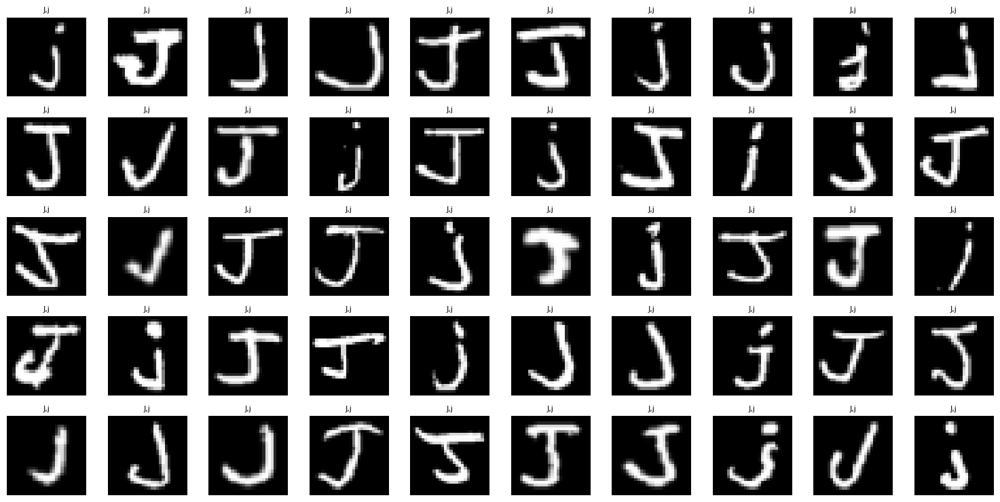

Plotting 50 images for class 12 (L,l)


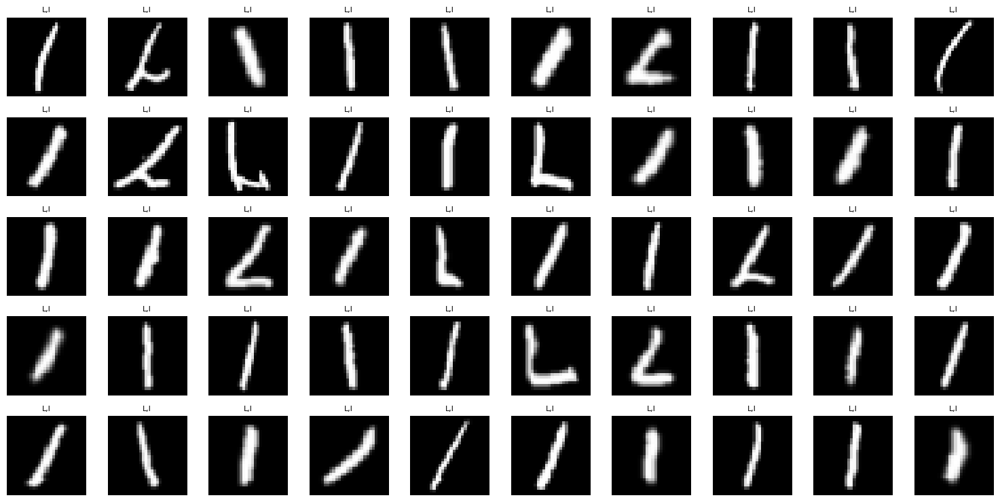

Plotting 50 images for class 14 (N,n)


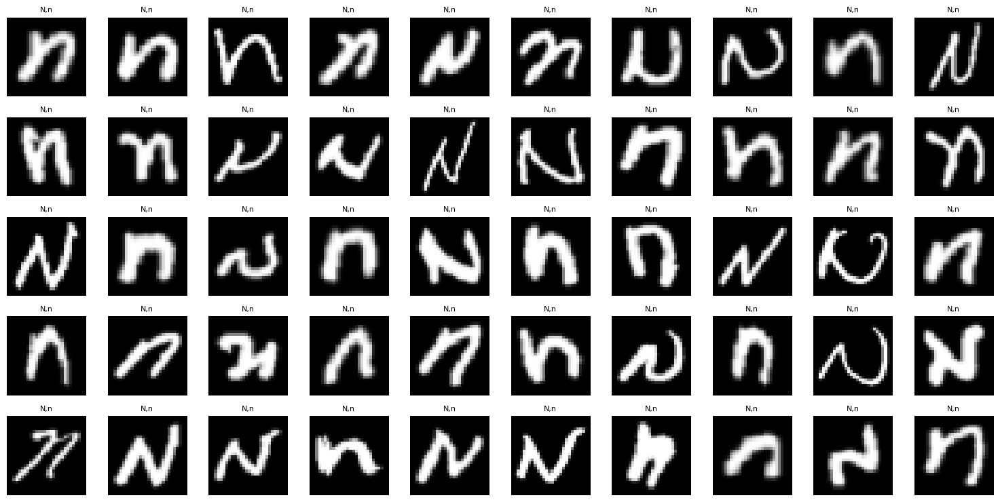

Plotting 50 images for class 15 (O,o)


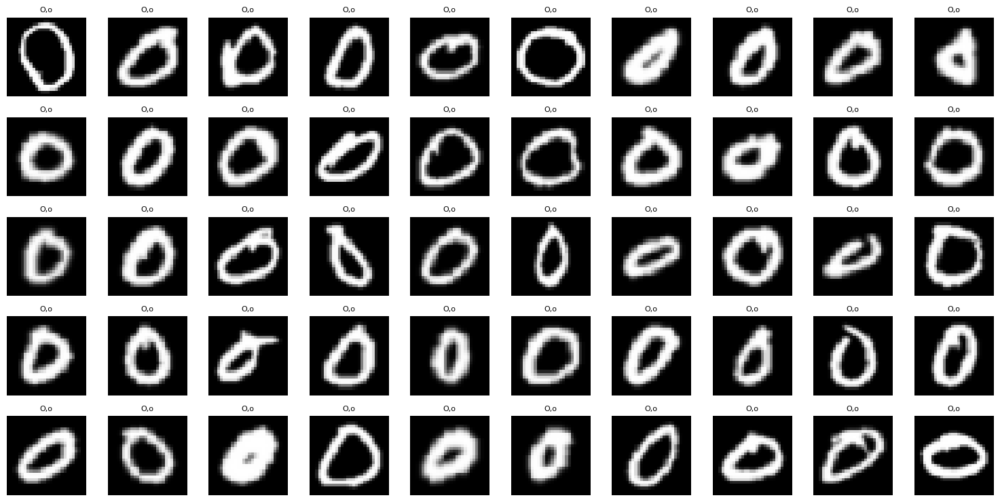

Plotting 50 images for class 16 (P,p)


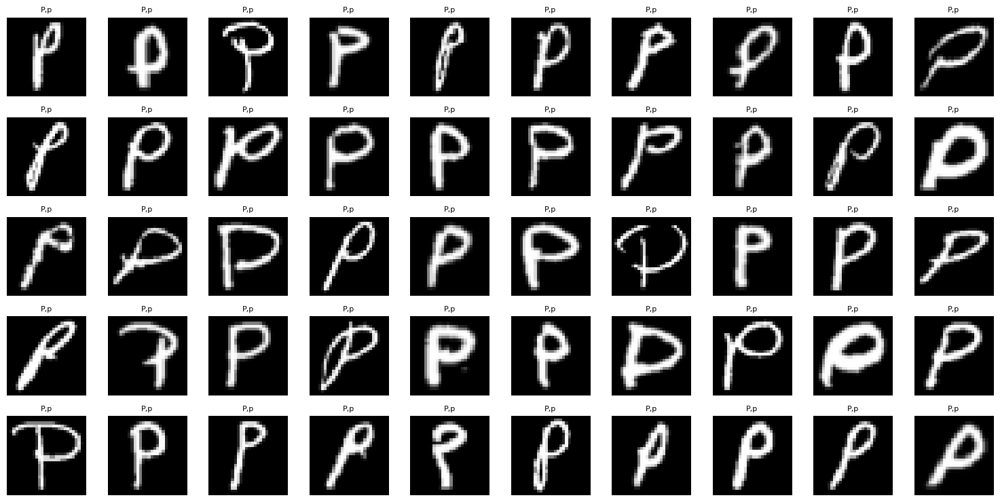

Plotting 50 images for class 17 (Q,q)


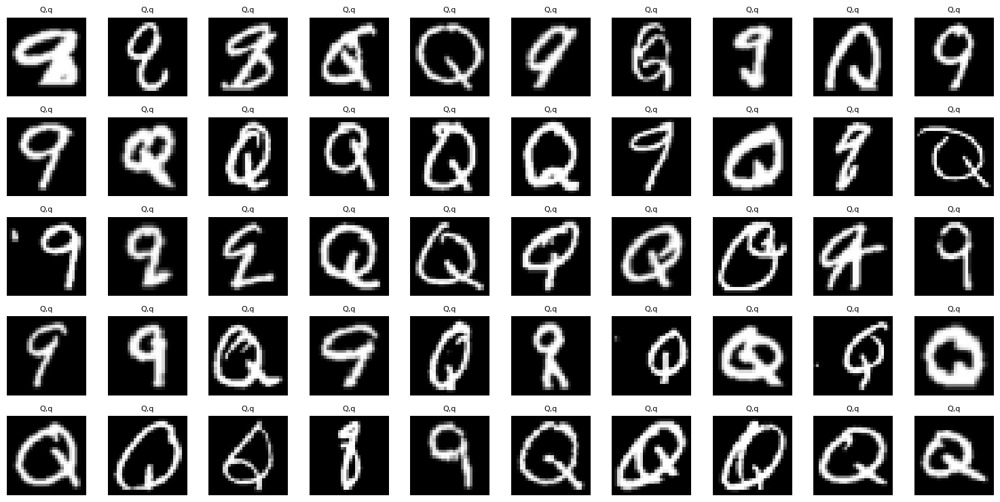

Plotting 50 images for class 20 (T,t)


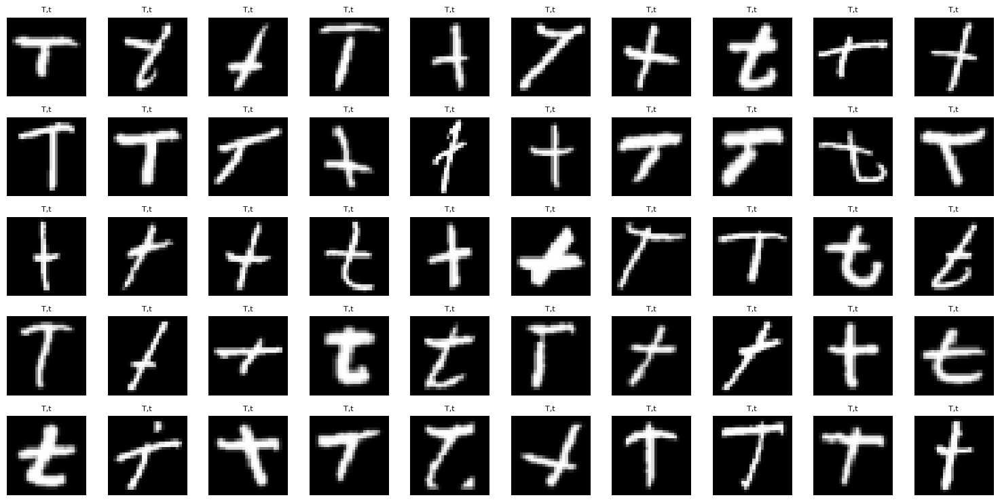

Plotting 50 images for class 24 (X,x)


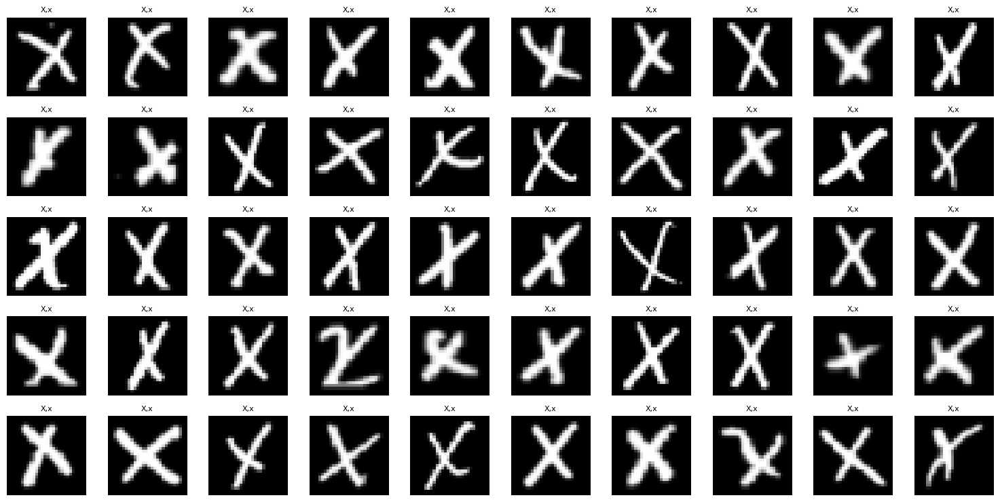

Plotting 50 images for class 26 (Z,z)


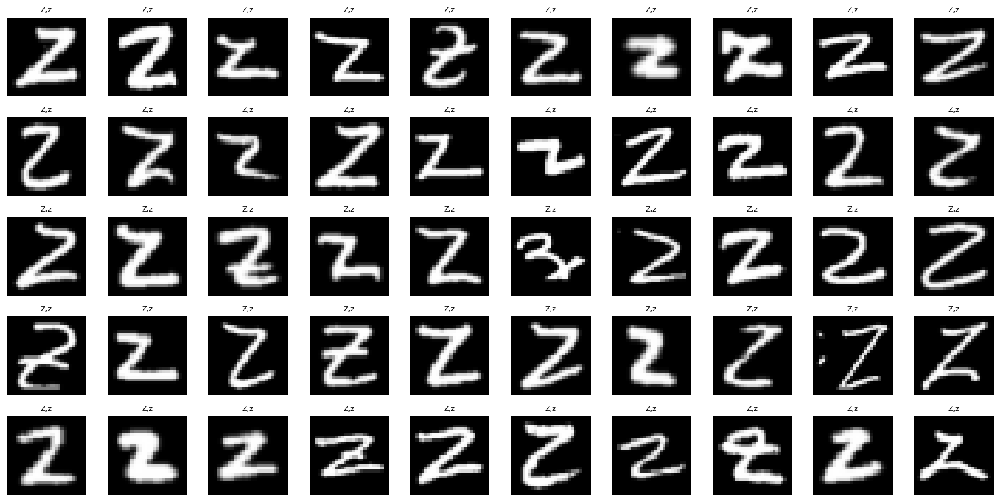

In [32]:
# Separate the labels and pixel data
labels = df_cleaned_no_dupes.iloc[:, 0].values      # column '24'
pixel_data = df_cleaned_no_dupes.iloc[:, 1:].values # all pixel columns

# Convert each row of pixels into 28x28 images
images = pixel_data.reshape(-1, 28, 28)

# Rotate 90 degrees clockwise, then flip horizontally
def fix_image(img):
    rotated = np.rot90(img, k=-1)  # 90° clockwise
    flipped = np.fliplr(rotated)   # horizontal flip
    return flipped

# Apply transformation to all images
fixed_images = np.array([fix_image(img) for img in images])

# Step 4: Map numeric labels to letters (e.g. 1->'A,a', 2->'B,b', etc.)
label_map = {i + 1: f"{string.ascii_uppercase[i]},{string.ascii_lowercase[i]}" for i in range(26)}

# Function to plot a grid of images
def plot_image_grid(images, labels=None, rows=5, cols=10):
    total_images = len(images)
    plt.figure(figsize=(cols * 1.5, rows * 1.5))
    for i in range(total_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
        if labels is not None:
            class_num = labels[i]
            letter = label_map.get(class_num, str(class_num))  # fallback if label not in map
            plt.title(letter, fontsize=8)
    plt.tight_layout()
    plt.show()

# 16 classes in the specific order:
classes_to_plot = [1, 2, 4, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 20, 24, 26]

# Plot 50 images per class
for class_label in classes_to_plot:
    class_indices = np.where(labels == class_label)[0]
    selected_indices = class_indices[:50]  # get first 50 images
    if len(selected_indices) == 0:
        print(f"No images found for class {class_label}")
        continue
    print(f"Plotting 50 images for class {class_label} ({label_map.get(class_label)})")
    plot_image_grid(fixed_images[selected_indices], labels[selected_indices], rows=5, cols=10)

### <mark> Observations and questions in mind </mark>

1) `What to do if some images in a class look like other letters?`
<br>
E.g., Label 1 (A) has an image that looks like Q; Label 2 (B) has an image like an inverted flipped e; Label 4 (D) has a v-like image.

- ANS: It is common problem in handwriting or sketch datasets — people sometimes miswrite or write in their own style. These mislabelled or ambiguous samples can:

    - Introduce noise to training (make it harder for the model to learn correct boundaries).

    - Cause lower accuracy.
 

2) Does different stroke thickness (some letters thicker or thinner) affect the training process?
<br>
- ANS: Yes, it can affect training. GANs or classifiers learn patterns in pixel intensity and shapes, so:

    - Different thickness may introduce additional variations.

    - However, it also helps the model become robust to different writing styles.

- Possible Solution:

    - We can normalize stroke thickness using morphological operations (like thinning) if we want uniform strokes, but it’s optional.

    - Often, including these variations is <mark> good for generalization.<mark>

3) Do we need to manually clean these images that look incorrect or mislabelled?
<br>
- ANS: Yes, if accuracy and quality are important.

    - Incorrect samples can confuse the model.

    - GAN may generate incorrect shapes or mix styles.

- Options:

    - Manually review each sample and remove or relabel.

    - Use outlier detection methods to help identify odd samples.


4) Similar-looking letters between classes — will it cause confusion?
<br>
- Example pairs:

    - Label 9 (I) vs Label 12 (L) — both are vertical strokes.
 
        - Both are single strokes (vertical line).
        - Model may confuse them, especially if images vary in height or thickness.
        - Since both are different letters we will not do anything

    - Label 16 (P) vs Label 17 (Q) — only a small shape difference.
 
        - Only a small difference at the bottom (stroke tail).
        - No changes to be made
 
      
    - Label 20 (T) vs Label 24 (X) — X can look like a rotated T.
 
         - Some "T" shapes may look like "X" if rotated.
         - Carefully examine samples.


### Examining Letter G,g:

During our earlier EDA, we observed that some samples in the 'G/g' class closely resembled other characters, such as the letter 'q'.

In this section, we examine more samples from the 'G/g' class to evaluate whether the ambiguity is due to a small number of mislabeled entries that can be cleaned, or if it is a issue throughout the dataset.

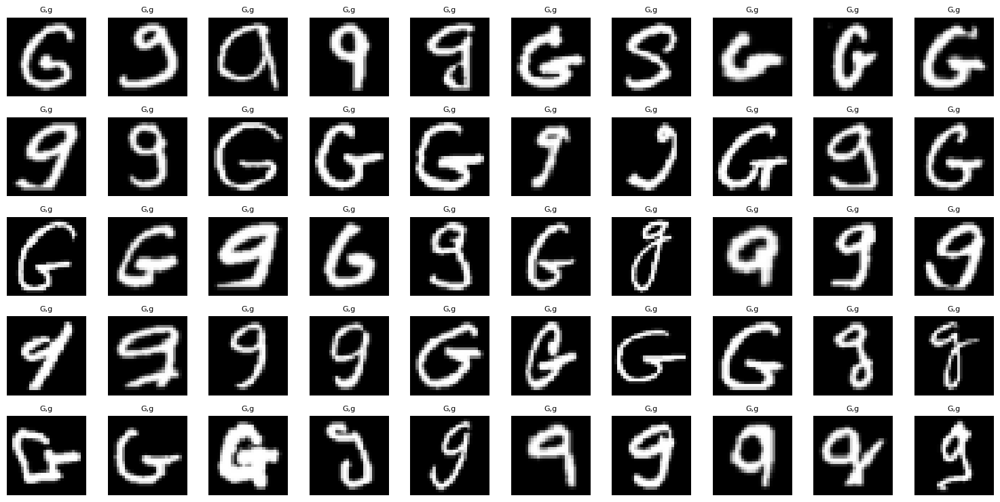

In [33]:
# Find indices of class 7 (G/g)
g_indices = np.where(labels == 7)[0]
subset_indices = g_indices[:50]  # First 50 samples of class 7

# Plot in 5×10 grid
plot_image_grid(fixed_images[subset_indices], labels[subset_indices], rows=5, cols=10)

**OBSERVATIONS:**

- We observed that the issue of ambiguous or mislabeled images (e.g., some labeled as 'g' resembling ('a','q') is widespread throughout the dataset.

- Given that there are over 3,000 images for this class, manually filtering them would be impractical. Therefore, we conclude that this ambiguity is an inherent characteristic of the dataset.

This inconsistency may affect the performance of our GAN model, particularly in generating realistic images of the letter 'g', as the model may learn conflicting visual features due to the noisy labels.

## Average Image

Why Find Average Image?

- To understand the general structure of each character class
- To visually summarize the common features shared by samples in a class
- To identify variability within each class (e.g., uppercase vs lowercase differences)

In [34]:
def plot_class_averages(images, labels, char_map, num_classes=16):
    plt.figure(figsize=(12, 6))
    plot_index = 1

    for cls in range(num_classes):
        class_images = images[labels == cls]
        if len(class_images) == 0:
            print(f"Class {cls} has no samples, skipping...")
            continue

        avg_image = np.mean(class_images, axis=0)
        if avg_image.ndim == 3:
            avg_image = avg_image.squeeze()

        plt.subplot(2, 8, plot_index)
        plt.imshow(avg_image, cmap='gray')
        letter = char_map.get(cls, f"Class {cls}")
        plt.title(f"{letter}", fontsize=10)
        plt.axis('off')
        plot_index += 1

    plt.tight_layout()
    plt.show()

In [35]:
original_labels = np.array([1, 2, 4, 5, 6, 7, 9, 10, 12, 14, 15, 16, 17, 20, 24, 26])

char_map = {
    new: f"{string.ascii_uppercase[orig - 1]},{string.ascii_lowercase[orig - 1]}"
    for new, orig in enumerate(original_labels)
}

# Create a mapping: old_label → new_label (0 to 15)
label_remap = {orig: new for new, orig in enumerate(original_labels)}

# Apply mapping to your label array
mapped_labels = np.array([label_remap[lbl] for lbl in labels])

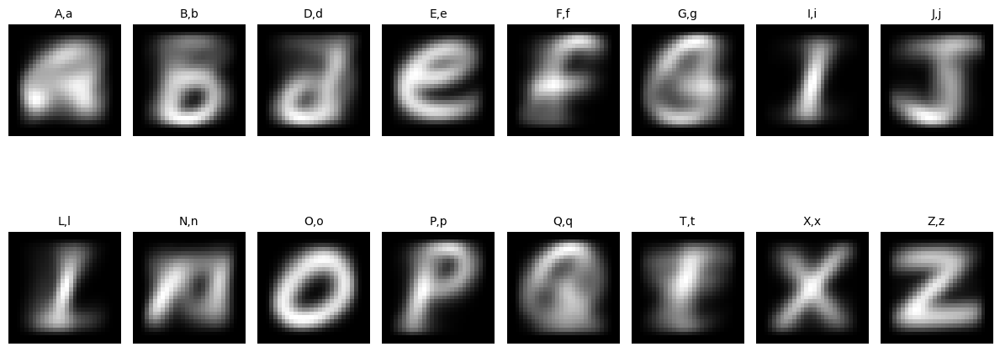

In [36]:
plot_class_averages(fixed_images, mapped_labels, char_map, num_classes=16)

**OBSERVATIONS:**

Upon visual inspection of the generated images, it was observed that certain character classes such as 'O,o' and 'X,x' exhibited relatively clear and well-defined features.

In contrast, other classes like 'A,a' and 'G,g' tended to produce blurrier or less distinct images. This disparity is likely due to the significant visual differences between the uppercase and lowercase forms of these letters.

## Normalize Pixel Values

Why Normalize Images?

1. Consistent Scale for Model Stability

Neural networks (especially GANs) are sensitive to the range of input values. If pixel values are between 0 and 255, gradients during training can become unstable or very slow to converge. Normalizing ensures a more stable and efficient training process.


2. Match Activation Function Expectations

If we use a Tanh activation function in the output layer of the generator, it outputs values in the range [-1, 1].<br>
So the real images (inputs to the discriminator) must also be in [-1, 1] to match.

If we fed in raw [0, 255] values, the discriminator would easily tell them apart from generated images, breaking GAN training.

In [37]:
# Normalize to [-1, 1]
fixed_images = (fixed_images.astype('float32') - 127.5) / 127.5

# Add channel dimension
fixed_images = np.expand_dims(fixed_images, axis=-1)

In [38]:
print("Min pixel value:", fixed_images.min())
print("Max pixel value:", fixed_images.max())

Min pixel value: -1.0
Max pixel value: 1.0


In [39]:
print("Image shape:", fixed_images.shape)

Image shape: (54586, 28, 28, 1)


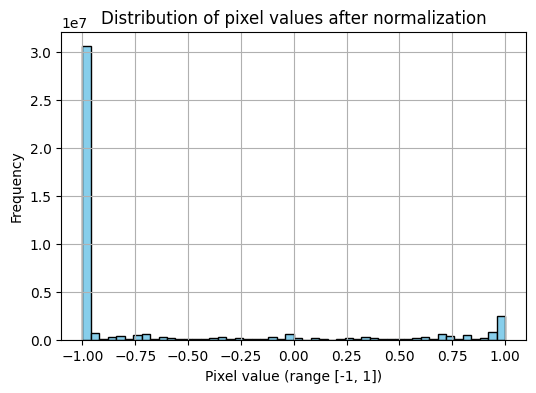

In [40]:
# Flatten all pixel values into 1D array
pixel_values = fixed_images.flatten()

plt.figure(figsize=(6, 4))
plt.hist(pixel_values, bins=50, color='skyblue', edgecolor='black')
plt.title("Distribution of pixel values after normalization")
plt.xlabel("Pixel value (range [-1, 1])")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

## Remapping Labels

Necessary step for feeding labels into models like cGAN & ACGAN.

In [41]:
mapped_labels = np.array([label_remap[lbl] for lbl in labels])

In [42]:
assert mapped_labels.shape[0] == fixed_images.shape[0], "Mismatch between labels and images counts!"

In [43]:
def plot_5x5_grid(fixed_images, mapped_labels, char_map):
    plt.figure(figsize=(10, 10))  # Adjust size as needed
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.imshow(fixed_images[i].squeeze(), cmap='gray')
        label = mapped_labels[i]
        char_label = char_map[label]
        plt.title(f"{label} ({char_label})", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

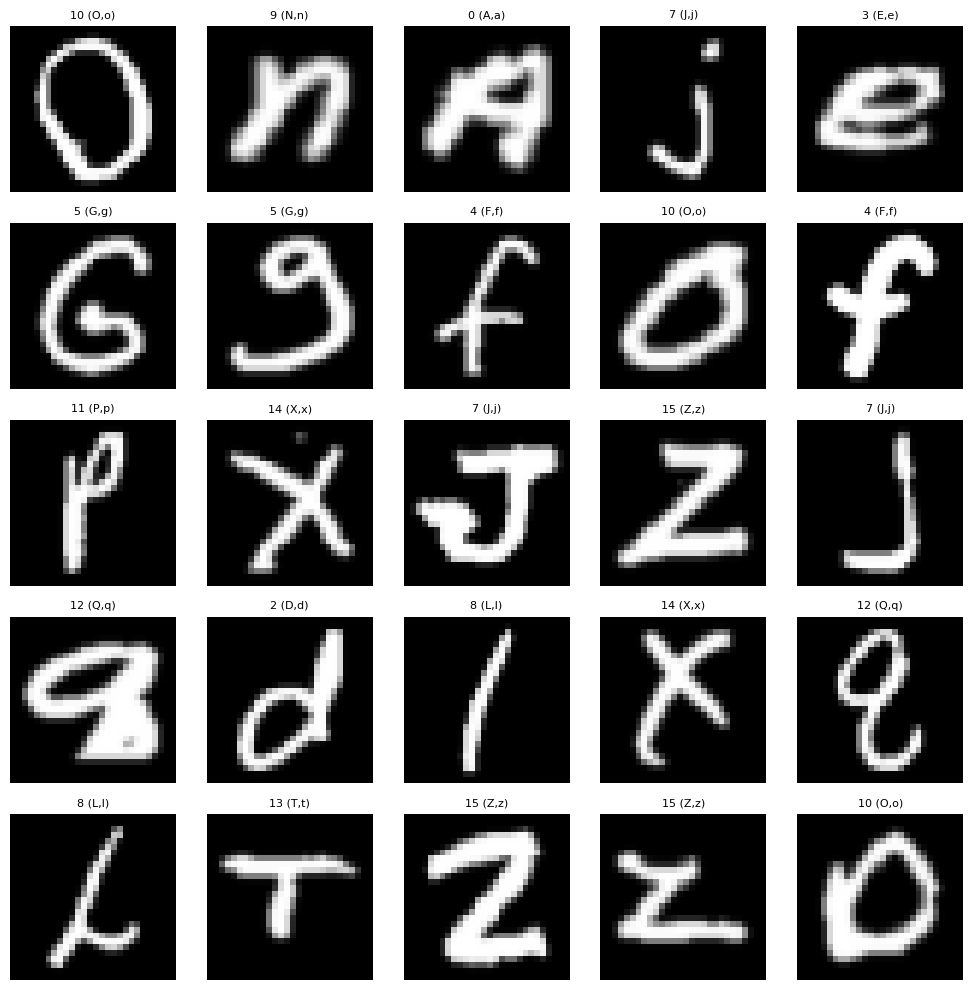

In [44]:
plot_5x5_grid(fixed_images, mapped_labels, char_map)

In [45]:
print("Unique labels:", np.unique(mapped_labels))

Unique labels: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]


In [46]:
fixed_images.shape

(54586, 28, 28, 1)

In [47]:
mapped_labels.shape

(54586,)

---

# Building GAN Models

---

There are many types of GAN (Generative Adversarial Network) models that we will be trying:

1. Deep Convolutional GAN (DCGAN)
2. Conditional GAN (cGAN)
3. Wasserstein GAN (WGAN)

---

## 1) DCGAN

The first model we will try is the DCGAN.

**What is DCGAN?**

A DCGAN is a type of Generative Adversarial Network (GAN) that uses deep convolutional layers to generate realistic images. It consists of two neural networks:

- Generator: Takes random noise as input and learns to generate fake images that resemble real data (e.g., handwritten letters).
- Discriminator: A convolutional neural network that tries to distinguish between real images and those generated by the generator.

Both networks are trained in a game-like setup:

- The generator tries to fool the discriminator.
- The discriminator tries to correctly identify real vs. fake.

Over time, the generator improves its ability to produce realistic images.

<mark>We used the lab's UpSampling2D code</mark>

**Why did we not use Conv2DTranpose?**

After testing the Conv2DTranspose code, the d_loss and g_loss kept going into the negatives by a lot.

We tried making changes to the code to fix this issue, like trying different activations (generator: sigmoid to tanh) to try and fix the issues.

But the problem still persists, thus now we are trying UpSampling2D code instead.

In [48]:
X_train = fixed_images  # Already shape (N, 28, 28, 1) and normalized to [-1, 1]

In [49]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)
discriminator.summary()

/home/test/tf_gpu/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
I0000 00:00:1754283778.316310     527 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 21770 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:21:00.0, compute capability: 8.6


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 14, 14, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 7, 7, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8, 8, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 4, 4, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         4,097 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 393,729 (1.50 MB)

 Trainable params: 392,833 (1.50 MB)

 Non-trainable params: 896 (3.50 KB)

In [50]:
latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 128, activation='relu'),
        layers.Reshape((7, 7, 128)),
        layers.UpSampling2D(),
        layers.Conv2D(128, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),
        layers.UpSampling2D(),
        layers.Conv2D(64, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),
        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 6272)           │       633,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 14, 14, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 14, 14, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 1)      │           577 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 856,193 (3.27 MB)

 Trainable params: 855,809 (3.26 MB)

 Non-trainable params: 384 (1.50 KB)

In [51]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = ops.concatenate([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Assemble labels that say "all real images"
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [52]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(42)

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = keras.random.normal(
            shape=(self.num_img, self.latent_dim), seed=self.seed_generator
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5  # Rescale [-1,1] → [0,255]
        generated_images = tf.clip_by_value(generated_images, 0, 255)
        generated_images = tf.cast(generated_images, tf.uint8).numpy()

        os.makedirs('UpSampling2D_generated_mnist', exist_ok=True)
        for i in range(self.num_img):
            img = keras.utils.array_to_img(generated_images[i])
            img.save(f"UpSampling2D_generated_mnist/generated_img_{epoch:03d}_{i}.png")

        # Save model weights with proper `.weights.h5` extension
        self.model.generator.save_weights(f"UpSampling2D_generated_mnist/generator_epoch_{epoch}.weights.h5")
        self.model.discriminator.save_weights(f"UpSampling2D_generated_mnist/discriminator_epoch_{epoch}.weights.h5")

In [53]:
epochs = 10

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train, epochs=epochs, callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim)]
)

Epoch 1/10


I0000 00:00:1754283785.843726    1675 service.cc:152] XLA service 0x7f1a900143c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754283785.843760    1675 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2025-08-04 13:03:05.935073: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-04 13:03:06.059386: W tensorflow/compiler/tf2xla/kernels/random_ops.cc:62] Warning: Using tf.random.uniform with XLA compilation will ignore seeds; consider using tf.random.stateless_uniform instead if reproducible behavior is desired. random_uniform/RandomUniform
I0000 00:00:1754283786.474050    1675 cuda_dnn.cc:529] Loaded cuDNN version 90300


  11/1706 ━━━━━━━━━━━━━━━━━━━━ 27s 16ms/step - d_loss: 0.6481 - g_loss: 0.6736

I0000 00:00:1754283790.685846    1675 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1706/1706 ━━━━━━━━━━━━━━━━━━━━ 24s 8ms/step - d_loss: 0.6222 - g_loss: 0.9268
Epoch 2/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6420 - g_loss: 0.8968
Epoch 3/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - d_loss: 0.6172 - g_loss: 0.9691
Epoch 4/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - d_loss: 0.6006 - g_loss: 1.0202
Epoch 5/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - d_loss: 0.5900 - g_loss: 1.0573
Epoch 6/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - d_loss: 0.5822 - g_loss: 1.0920
Epoch 7/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - d_loss: 0.5757 - g_loss: 1.1195
Epoch 8/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - d_loss: 0.5676 - g_loss: 1.1468
Epoch 9/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - d_loss: 0.5672 - g_loss: 1.1526
Epoch 10/10
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5599 - g_loss: 1.1789


In [54]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('UpSampling2D_generated_mnist', exist_ok=True)
    fig.savefig(f"UpSampling2D_generated_mnist/dcgan_mnist_{epoch}.png")
    plt.show()
    plt.close()

Plot 160 images:

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


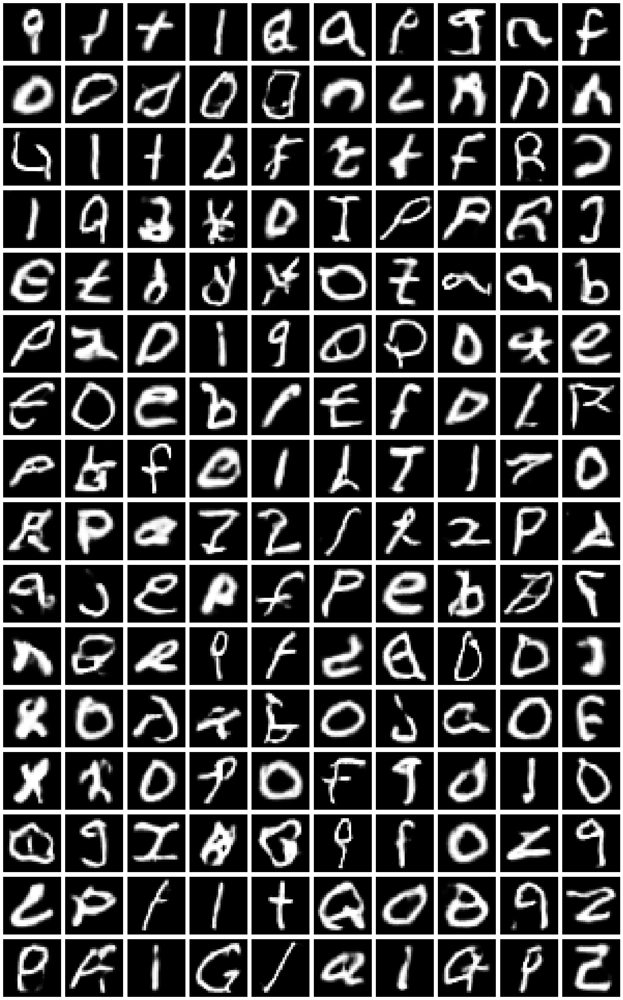

In [107]:
save_imgs(1)

### How do we evaluate the images generate?

Methods:

1. Human Evaluation ("Eye Power")
2. Fréchet Inception Distance (FID)
3. Inception Score (IS)

We will go with 1. Human Evaluation.

**How does this method work?**

- Use the image we already generated.
- Pick a sample of 50 images
- Count how many fall into each category.
- Record in report

E.g.
Human visual scoring (epoch 10):<br>
- Passable: 35/50
- Nonsense: 15/50

**Why did we not go for 2. Fréchet Inception Distance (FID) or 3. Inception Score (IS)?**

`Fréchet Inception Distance (FID):`

FID compares real vs. generated image distributions using an embedding model like InceptionV3. However, FID assumes 3-channel RGB images and real labels.

We are using black & white images that only has 1-channel, thus this method is unsuitable for us.

`Inception Score (IS):`

- Evaluates whether generated images look like something "classifiable"
- Whether the generated images are diverse

But again, this assumes an ImageNet-trained classifier, which isn’t ideal for handwritten letters unless adapted.

Use Human Evaluation, plot sample of 50 images:

In [68]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('UpSampling2D_generated_mnist', exist_ok=True)
    fig.savefig("UpSampling2D_generated_mnist/dcgan_mnist_sample50_{:d}.png".format(epoch))
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


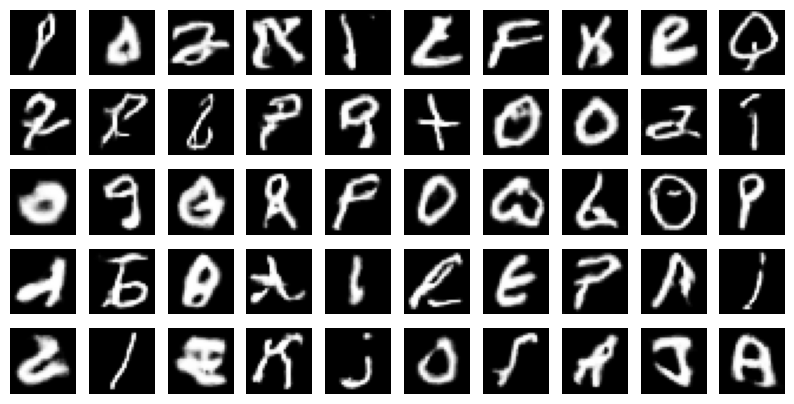

In [60]:
save_imgs_sample_50(epoch=10)

**OBSERVATIONS:**

Human Evaluation Score (epoch 10):<br>
- Passable: 30/50
- Nonsense: 20/50

This will act as a simple model, thus why we only trained for 10 epochs, we can revisit DCGAN later if it performs better than the other models. We will now try other GAN models.

## 2) cGAN

A Conditional GAN (cGAN) is a type of GAN that generates images conditioned on a specific label or input. Like a standard GAN, it has two networks:

- Generator: Learns to generate fake images, but with a specific condition (e.g., generate the letter "A").
- Discriminator: Tries to distinguish between real and fake images while also considering the condition.

The key difference from a regular GAN or DCGAN is that both the generator and discriminator receive extra information (e.g., class labels). This allows the model to generate images that belong to a specific class instead of random outputs.

**In the CA2 brief:**

"If you are asked to generate images of a specific class, propose a way of doing it. (For example, you may consider a conditional GAN architecture.)"

cGAN is our answer to this as we can specify which classes we want to generate.

**Another Option: Train Separate DCGANs for Each Class**

Instead of using a cGAN, one alternative approach is to train a separate DCGAN model for each class label. For example, if we have 16 classes, we could train 16 individual DCGANs, each on images of a single class. During generation, we simply select the model corresponding to the desired class and generate images from it.

This approach is a form of brute-force conditioning—each model only ever sees one class, so it learns to generate that class by default.

**Why we did not pick this option:**

While this approach is simple to implement, it has major limitations compared to a cGAN:

| Aspect                 | Separate DCGANs                                                                                     | Conditional GAN (cGAN)                                                         |
| ---------------------- | --------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------ |
| **Scalability**        | Poor, training time and storage grow linearly with the number of classes (e.g., 16× training time) | Excellent, one model handles all classes                                      |
| **Code Reuse**         | Difficult, you need separate training loops, models, and checkpoints per class                     | Simple, one training loop, one model                                          |
| **Control**            | You can generate only one class per model                                                           | You can generate **any** class from the same model by changing the input label |
| **Training Stability** | Each model sees less data overall, which can reduce generalization                                  | cGAN sees all class distributions and may learn shared features                |
| **Model Size**         | Total memory/storage for all models is large                                                        | One compact model handles all classes                                          |

In summary, we didn’t pick the brute-force DCGAN method because it's inefficient, repetitive, and hard to scale, especially when dealing with many classes. Conditional GANs solve this by incorporating class labels directly into the model, offering flexibility, control, and better performance with less overhead.

Encode the mapped labels:

In [45]:
y_train = to_categorical(mapped_labels, num_classes=16)

In [62]:
batch_size = 64
num_channels = 1
num_classes = 16
image_size = 28
latent_dim = 100

In [63]:
# Convert to tf.data.Dataset
dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
dataset = dataset.shuffle(buffer_size=1024).batch(batch_size)

print(f"Shape of training images: {X_train.shape}")
print(f"Shape of training labels: {y_train.shape}")

Shape of training images: (54586, 28, 28, 1)
Shape of training labels: (54586, 16)


In [64]:
generator_in_channels = latent_dim + num_classes
discriminator_in_channels = num_channels + num_classes
print(generator_in_channels, discriminator_in_channels)

116 17


In [65]:
# Create the discriminator.
discriminator = keras.Sequential(
    [
        keras.layers.InputLayer((28, 28, discriminator_in_channels)),
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(negative_slope=0.2),
        layers.GlobalMaxPooling2D(),
        layers.Dense(1),
    ],
    name="discriminator",
)

# Create the generator.
generator = keras.Sequential(
    [
        keras.layers.InputLayer((generator_in_channels,)),
        layers.Dense(7 * 7 * generator_in_channels),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Reshape((7, 7, generator_in_channels)),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Conv2D(1, (7, 7), padding="same", activation="tanh"),
    ],
    name="generator",
)

In [67]:
class ConditionalGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)
        self.gen_loss_tracker = keras.metrics.Mean(name="generator_loss")
        self.disc_loss_tracker = keras.metrics.Mean(name="discriminator_loss")

    @property
    def metrics(self):
        return [self.gen_loss_tracker, self.disc_loss_tracker]

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    def train_step(self, data):
        # Unpack the data.
        real_images, one_hot_labels = data

        # Add dummy dimensions to the labels so that they can be concatenated with
        # the images. This is for the discriminator.
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = ops.repeat(
            image_one_hot_labels, repeats=[image_size * image_size]
        )
        image_one_hot_labels = ops.reshape(
            image_one_hot_labels, (-1, image_size, image_size, num_classes)
        )

        # Sample random points in the latent space and concatenate the labels.
        # This is for the generator.
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )
        random_vector_labels = ops.concatenate(
            [random_latent_vectors, one_hot_labels], axis=1
        )

        # Decode the noise (guided by labels) to fake images.
        generated_images = self.generator(random_vector_labels)

        # Combine them with real images. Note that we are concatenating the labels
        # with these images here.
        fake_image_and_labels = ops.concatenate(
            [generated_images, image_one_hot_labels], -1
        )
        real_image_and_labels = ops.concatenate([real_images, image_one_hot_labels], -1)
        combined_images = ops.concatenate(
            [fake_image_and_labels, real_image_and_labels], axis=0
        )

        # Assemble labels discriminating real from fake images.
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )

        # Train the discriminator.
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space.
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )
        random_vector_labels = ops.concatenate(
            [random_latent_vectors, one_hot_labels], axis=1
        )

        # Assemble labels that say "all real images".
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_vector_labels)
            fake_image_and_labels = ops.concatenate(
                [fake_images, image_one_hot_labels], -1
            )
            predictions = self.discriminator(fake_image_and_labels)
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Monitor loss.
        self.gen_loss_tracker.update_state(g_loss)
        self.disc_loss_tracker.update_state(d_loss)
        return {
            "g_loss": self.gen_loss_tracker.result(),
            "d_loss": self.disc_loss_tracker.result(),
        }

In [68]:
cond_gan = ConditionalGAN(
    discriminator=discriminator, generator=generator, latent_dim=latent_dim
)
cond_gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0003),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0003),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

cond_gan.fit(dataset, epochs=10)

Epoch 1/10


2025-07-22 23:04:27.612679: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 364 bytes spill stores, 364 bytes spill loads

2025-07-22 23:04:27.644963: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 308 bytes spill stores, 308 bytes spill loads



853/853 ━━━━━━━━━━━━━━━━━━━━ 22s 15ms/step - d_loss: 0.4083 - g_loss: 2.1689
Epoch 2/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - d_loss: 0.2547 - g_loss: 2.1593
Epoch 3/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step - d_loss: 0.0804 - g_loss: 3.6973
Epoch 4/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - d_loss: 0.1823 - g_loss: 3.2742
Epoch 5/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - d_loss: 0.5585 - g_loss: 1.0851
Epoch 6/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step - d_loss: 0.5837 - g_loss: 1.0092
Epoch 7/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - d_loss: 0.5824 - g_loss: 0.9959
Epoch 8/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - d_loss: 0.6033 - g_loss: 0.9266
Epoch 9/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step - d_loss: 0.5948 - g_loss: 0.9338
Epoch 10/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - d_loss: 0.6051 - g_loss: 0.9168


In [69]:
trained_gen = cond_gan.generator

# Number of samples per class
samples_per_class = 10
latent_dim = 100

# Generate 160 random noise vectors
noise = tf.random.normal((samples_per_class * num_classes, latent_dim))

# Generate class labels (0 to 15 repeated 10 times)
labels = np.array([[i] * samples_per_class for i in range(num_classes)]).flatten()

# One-hot encode labels
one_hot_labels = keras.utils.to_categorical(labels, num_classes=num_classes)

# Concatenate noise and labels
generator_input = tf.concat([noise, one_hot_labels], axis=1)

# Generate images
generated_images = trained_gen.predict(generator_input)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step  


10 classes, plot 16 images per class, 160 images:

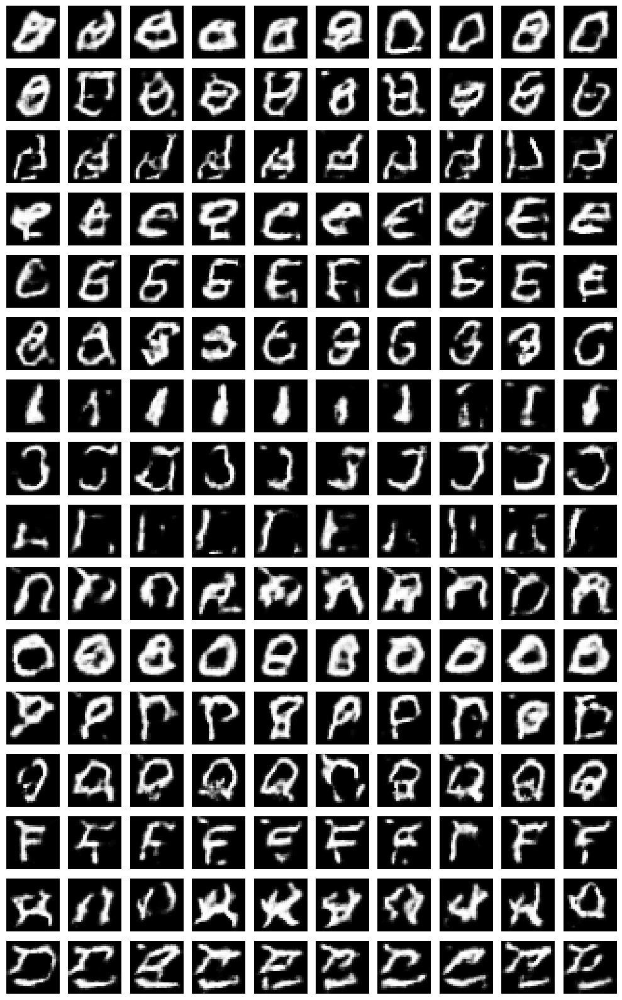

In [70]:
fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class, num_classes))

for i in range(num_classes):
    for j in range(samples_per_class):
        idx = i * samples_per_class + j
        axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

Use Human Evaluation, plot sample of 50 images:

In [71]:
def save_cgan_sample_50(generator, epoch, latent_dim=100, num_classes=16, save_dir='cGAN_generated_images'):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images

    # Mapping of class indices to letters
    label_map = {
        0: "A,a", 1: "B,b", 2: "D,d", 3: "E,e",
        4: "F,f", 5: "G,g", 6: "I,i", 7: "J,j",
        8: "L,l", 9: "N,n", 10: "O,o", 11: "P,p",
        12: "Q,q", 13: "T,t", 14: "X,x", 15: "Z,z"
    }

    # Random noise
    noise = np.random.normal(0, 1, (r * c, latent_dim))

    # Random labels (0 to 15)
    random_labels = np.random.randint(0, num_classes, r * c)
    one_hot_labels = keras.utils.to_categorical(random_labels, num_classes=num_classes)

    # Concatenate noise and labels
    generator_input = np.concatenate([noise, one_hot_labels], axis=1)

    # Generate images
    gen_imgs = generator.predict(generator_input)

    # Rescale from [-1, 1] to [0, 1] if using tanh
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Plot and save
    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            label_text = label_map[random_labels[cnt]]
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].set_title(label_text, fontsize=6)
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs(save_dir, exist_ok=True)
    fig.savefig(f"{save_dir}/cgan_sample50_epoch_{epoch}.png")
    plt.show()
    plt.close()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


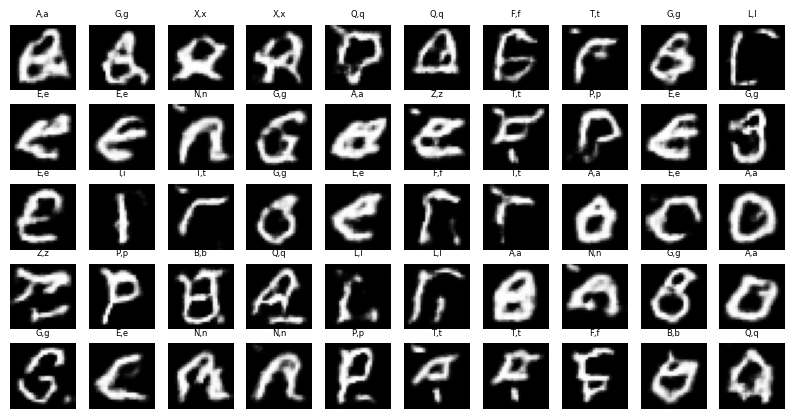

In [72]:
save_cgan_sample_50(cond_gan.generator, epoch=10)

**OBSERVATIONS:**

Human Evaluation Score (cGANepoch 10):<br>
- Passable: 22/50
- Nonsense: 28/50

Human visual scoring (DCGAN epoch 10):<br>
- Passable: 30/50
- Nonsense: 15/50

cGAN performed worse than DCGAN, the model struggled more with the letters that have very distinct appearances from lowercase to uppercase letters. (E.g. A,a & N,n)

X,x also looks messy, which is weird as both lowercase and uppercase look quite similar.

This could be due to 1 main reason: different handwriting styles

Our dataset contains handwritten letters, which could lead to lowercase x ending up with loops or curves that the uppercase doesn’t have, depending on the writer.

**Why did cGAN perform worse than DCGAN?**

Although cGANs are designed to generate images conditioned on labels, our results showed lower image quality compared to DCGAN:

- cGAN: 22/50 passable
- DCGAN: 30/50 passable

Main Reason: Inconsistent Handwriting Styles

Since the dataset contains handwritten letters, the same class label (e.g., "A/a" or "N/n") can look very different depending on the writer. This label-to-image inconsistency makes it harder for the cGAN to learn a reliable mapping from label to image.

**Why DCGAN did better:**

DCGAN doesn’t rely on labels. It learns directly from the overall image distribution, which allows it to generalize better despite style variations

**CONCLUSION:**

The cGAN struggled due to the high variability within each class, while DCGAN avoided this issue by learning without conditioning.

## 3) WGAN

A Wasserstein GAN (WGAN) is an improved variant of the standard GAN designed to stabilize training and improve the quality of generated images. Instead of using the traditional binary cross-entropy loss, WGAN uses the Wasserstein distance (also known as Earth Mover’s distance) as a measure of difference between real and generated data distributions.

Key features:

- Generator: Learns to produce realistic images by minimizing the Wasserstein distance between generated and real data distributions.
- Discriminator (called the “critic” in WGAN): Outputs a real-valued score instead of a probability, estimating how real or fake an input image is.
- No sigmoid in discriminator output: Unlike traditional GANs, WGAN’s critic does not squash outputs through a sigmoid function, allowing better gradient flow.
- Weight clipping or gradient penalty: To enforce Lipschitz continuity, which is required for the Wasserstein distance, the critic’s weights are either clipped to a small range or regularized via gradient penalty.

This approach addresses common GAN issues such as mode collapse and training instability, often resulting in more stable training and higher-quality generated images.

In [46]:
os.environ["KERAS_BACKEND"] = "tensorflow"

In [47]:
IMG_SHAPE = (28, 28, 1)
BATCH_SIZE = 64

# Size of the noise vector
noise_dim = 128

In [48]:
def conv_block(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    use_bias=True,
    use_bn=False,
    use_dropout=False,
    drop_value=0.5,
):
    x = layers.Conv2D(
        filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias
    )(x)
    if use_bn:
        x = layers.BatchNormalization()(x)
    x = activation(x)
    if use_dropout:
        x = layers.Dropout(drop_value)(x)
    return x


def get_discriminator_model():
    img_input = layers.Input(shape=IMG_SHAPE)
    # Zero pad the input to make the input images size to (32, 32, 1).
    x = layers.ZeroPadding2D((2, 2))(img_input)
    x = conv_block(
        x,
        64,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        use_bias=True,
        activation=layers.LeakyReLU(0.2),
        use_dropout=False,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        128,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=True,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        256,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=True,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        512,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=False,
        drop_value=0.3,
    )

    x = layers.Flatten()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(1)(x)

    d_model = keras.models.Model(img_input, x, name="discriminator")
    return d_model


d_model = get_discriminator_model()
d_model.summary()

I0000 00:00:1753277250.359885     454 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5592 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Ti, pci bus id: 0000:01:00.0, compute capability: 8.6


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 16, 16, 64)     │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 8, 8, 128)      │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 256)      │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 2, 2, 512)      │     3,277,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         2,049 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,305,409 (16.42 MB)

 Trainable params: 4,305,409 (16.42 MB)

 Non-trainable params: 0 (0.00 B)

In [49]:
def upsample_block(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1, 1),
    up_size=(2, 2),
    padding="same",
    use_bn=False,
    use_bias=True,
    use_dropout=False,
    drop_value=0.3,
):
    x = layers.UpSampling2D(up_size)(x)
    x = layers.Conv2D(
        filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias
    )(x)

    if use_bn:
        x = layers.BatchNormalization()(x)

    if activation:
        x = activation(x)
    if use_dropout:
        x = layers.Dropout(drop_value)(x)
    return x


def get_generator_model():
    noise = layers.Input(shape=(noise_dim,))
    x = layers.Dense(4 * 4 * 256, use_bias=False)(noise)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Reshape((4, 4, 256))(x)
    x = upsample_block(
        x,
        128,
        layers.LeakyReLU(0.2),
        strides=(1, 1),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x,
        64,
        layers.LeakyReLU(0.2),
        strides=(1, 1),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x, 1, layers.Activation("tanh"), strides=(1, 1), use_bias=False, use_bn=True
    )
    # At this point, we have an output which has the same shape as the input, (32, 32, 1).
    # We will use a Cropping2D layer to make it (28, 28, 1).
    x = layers.Cropping2D((2, 2))(x)

    g_model = keras.models.Model(noise, x, name="generator")
    return g_model


g_model = get_generator_model()
g_model.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │       524,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 4096)           │        16,384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 64)     │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 1)      │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 1)      │             4 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cropping2d (Cropping2D)         │ (None, 28, 28, 1)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 910,660 (3.47 MB)

 Trainable params: 902,082 (3.44 MB)

 Non-trainable params: 8,578 (33.51 KB)

In [50]:
class WGAN(keras.Model):
    def __init__(
        self,
        discriminator,
        generator,
        latent_dim,
        discriminator_extra_steps=3,
        gp_weight=10.0,
    ):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images):
        """Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image
        alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]

        # Get the batch size
        batch_size = tf.shape(real_images)[0]

        # For each batch, we are going to perform the
        # following steps as laid out in the original paper:
        # 1. Train the generator and get the generator loss
        # 2. Train the discriminator and get the discriminator loss
        # 3. Calculate the gradient penalty
        # 4. Multiply this gradient penalty with a constant weight factor
        # 5. Add the gradient penalty to the discriminator loss
        # 6. Return the generator and discriminator losses as a loss dictionary

        # Train the discriminator first. The original paper recommends training
        # the discriminator for `x` more steps (typically 5) as compared to
        # one step of the generator. Here we will train it for 3 extra steps
        # as compared to 5 to reduce the training time.
        for i in range(self.d_steps):
            # Get the latent vector
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )
            with tf.GradientTape() as tape:
                # Generate fake images from the latent vector
                fake_images = self.generator(random_latent_vectors, training=True)
                # Get the logits for the fake images
                fake_logits = self.discriminator(fake_images, training=True)
                # Get the logits for the real images
                real_logits = self.discriminator(real_images, training=True)

                # Calculate the discriminator loss using the fake and real image logits
                d_cost = self.d_loss_fn(real_img=real_logits, fake_img=fake_logits)
                # Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # Add the gradient penalty to the original discriminator loss
                d_loss = d_cost + gp * self.gp_weight

            # Get the gradients w.r.t the discriminator loss
            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            # Update the weights of the discriminator using the discriminator optimizer
            self.d_optimizer.apply_gradients(
                zip(d_gradient, self.discriminator.trainable_variables)
            )

        # Train the generator
        # Get the latent vector
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            # Generate fake images using the generator
            generated_images = self.generator(random_latent_vectors, training=True)
            # Get the discriminator logits for fake images
            gen_img_logits = self.discriminator(generated_images, training=True)
            # Calculate the generator loss
            g_loss = self.g_loss_fn(gen_img_logits)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )
        return {"d_loss": d_loss, "g_loss": g_loss}

In [51]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=6, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = (generated_images * 127.5) + 127.5

        for i in range(self.num_img):
            img = generated_images[i].numpy()
            img = keras.utils.array_to_img(img)
            img.save("generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch))

In [55]:
# Instantiate the optimizer for both networks
# (learning_rate=0.0002, beta_1=0.5 are recommended)
generator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)
discriminator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)


# Define the loss functions for the discriminator,
# which should be (fake_loss - real_loss).
# We will add the gradient penalty later to this loss function.
def discriminator_loss(real_img, fake_img):
    real_loss = tf.reduce_mean(real_img)
    fake_loss = tf.reduce_mean(fake_img)
    return fake_loss - real_loss


# Define the loss functions for the generator.
def generator_loss(fake_img):
    return -tf.reduce_mean(fake_img)


# Set the number of epochs for training.
epochs = 10

# Instantiate the customer `GANMonitor` Keras callback.
cbk = GANMonitor(num_img=3, latent_dim=noise_dim)

# Get the wgan model
wgan = WGAN(
    discriminator=d_model,
    generator=g_model,
    latent_dim=noise_dim,
    discriminator_extra_steps=3,
)

# Compile the wgan model
wgan.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
    g_loss_fn=generator_loss,
    d_loss_fn=discriminator_loss,
)

# Start training
wgan.fit(X_train, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[cbk])

Epoch 1/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 91s 72ms/step - d_loss: -5.3346 - g_loss: -17.5988
Epoch 2/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 46s 54ms/step - d_loss: -3.4160 - g_loss: -12.2822
Epoch 3/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - d_loss: -2.4999 - g_loss: -9.2962
Epoch 4/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - d_loss: -2.0978 - g_loss: -5.5486
Epoch 5/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 85s 60ms/step - d_loss: -1.9361 - g_loss: -5.1314
Epoch 6/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - d_loss: -1.8128 - g_loss: -4.1117
Epoch 7/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - d_loss: -1.7499 - g_loss: -2.5770
Epoch 8/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - d_loss: -1.7050 - g_loss: -3.2675
Epoch 9/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 49s 57ms/step - d_loss: -1.6101 - g_loss: -3.1215
Epoch 10/10
853/853 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step - d_loss: -1.5847 - g_loss: -2.2344


Plot 160 images:

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step 


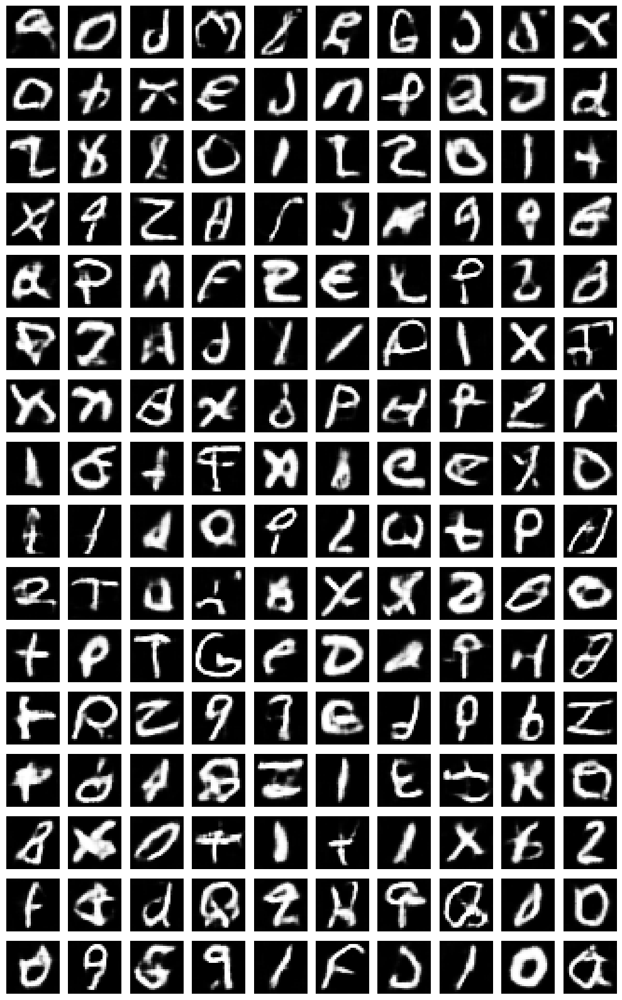

In [56]:
# Set dimensions
r, c = 16, 10  # 16 rows × 10 columns = 160 images
latent_dim = 128

# Generate 160 latent vectors
noise = np.random.normal(0, 1, (r * c, latent_dim))
gen_imgs = g_model.predict(noise)

# Rescale from [-1, 1] to [0, 1]
gen_imgs = 0.5 * gen_imgs + 0.5

# Create grid plot
fig, axs = plt.subplots(r, c, figsize=(c, r))
cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
        axs[i, j].axis('off')
        cnt += 1

plt.tight_layout()
plt.show()
plt.close()

Use Human Evaluation, plot sample of 50 images:

In [59]:
def save_imgs_sample_50_wgan(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    latent_dim = 128

    # Generate noise and images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = g_model.predict(noise)

    # Rescale from [-1, 1] to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Plot
    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    # Save
    os.makedirs('WGAN_generated_mnist', exist_ok=True)
    fig.savefig("WGAN_generated_mnist/wgan_mnist_sample50_{:d}.png".format(epoch))
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


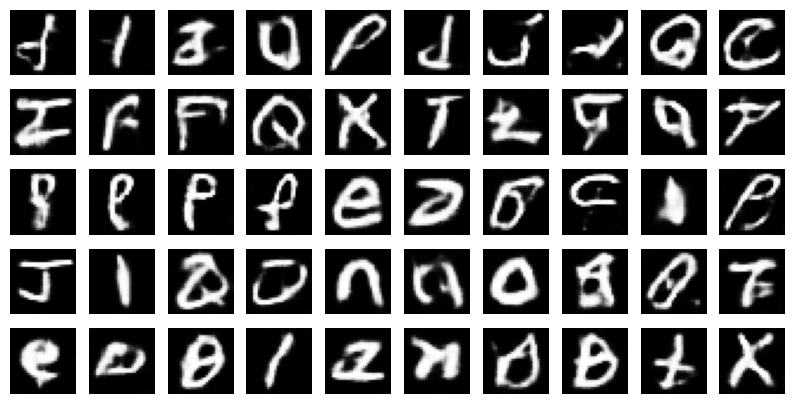

In [60]:
save_imgs_sample_50_wgan(epoch=10) 

**OBSERVATIONS:**

Human Evaluation Score (WGAN epoch 10):

- Passable: 21/50
- Nonsense: 29/50

Human visual scoring (DCGAN epoch 10):<br>
- Passable: 30/50
- Nonsense: 15/50

WGAN performed slightly worse than cGAN (21 vs 22). DCGAN is still the clear winner. We should focus on further improving our DCGAN model.

**Why did WGAN perform worse than DCGAN?**

Although WGANs are designed to improve training stability and reduce issues like mode collapse, our results showed that WGAN produced more low-quality ("nonsense") images than DCGAN:

- WGAN (Epoch 10): 21 passable
- DCGAN (Epoch 10): 30 passable

**CONCLUSION:**

WGAN underperformed because it likely needed more training time and a more robust implementation (e.g., with gradient penalty) to match DCGAN's visual results. For now, DCGAN remains the best-performing model and is the most practical choice to improve further.

---

# Further Improvements (DCGAN)

---

We concluded that when trying out simple models of the different GANs, DCGAN performed the best.

We can now try to further improve upon the DCGAN model.

When training DCGAN:

| Epoch | Discriminator Loss (d\_loss) | Generator Loss (g\_loss) | Interpretation                                         |
| ----- | ---------------------------- | ------------------------ | ------------------------------------------------------ |
| 1     | 0.6082                       | 0.9612                   | Initial balance — decent start.                        |
| 5     | 0.5752                       | 1.1163                   | Discriminator learning steadily.                       |
| 10    | 0.5417                       | 1.2390                   | Generator improving and making more believable images. |

**What this means:**

- The discriminator loss is decreasing slowly → it's learning to distinguish real/fake.
- The generator loss is increasing → this is normal when the generator starts producing more realistic images that fool the discriminator.
- No major signs of mode collapse or overfitting (yet).

This shows our DCGAN is learning properly, and we are definitely under-training at only 10 epochs.

Improvements to try:

1. Train Longer (50-100 epochs)
2. Add Dropout to Generator
3. Add Label Smoothing in the Discriminator (Prevent overconfidence in D and give G a better learning signal.)
4. Add Gaussian Noise to Discriminator Input (This helps the discriminator not memorize too easily, especially with grayscale or simple datasets like EMNIST.)
5. Try deeper generator: add more upsampling or a dense layer
6. Two-Time-Scale Update Rule (TTUR) (Tweak & use different learning rates.)

**Other things we tried:**

Use Spectral Normalization in Discriminator (Helps control discriminator strength and prevents it from overpowering the generator.)

However, when trying to install the add-on, it was not compatible with our current version of TensorFlow or Python (2.19 & 3.12)

### 1) Train Longer

In [65]:
epochs = 100

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train, epochs=epochs, callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim)]
)

Epoch 1/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 32s 13ms/step - d_loss: 0.6245 - g_loss: 0.9005
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_loss: 0.6347 - g_loss: 0.9185
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.6054 - g_loss: 1.0071
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5927 - g_loss: 1.0591
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5826 - g_loss: 1.0916
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5786 - g_loss: 1.1107
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - d_loss: 0.5727 - g_loss: 1.1293
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5659 - g_loss: 1.1430
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_loss: 0.5587 - g_loss: 1.1764
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5492 - g_loss: 1.2026
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5496 - g_loss: 1.2215
Epoch 1

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step


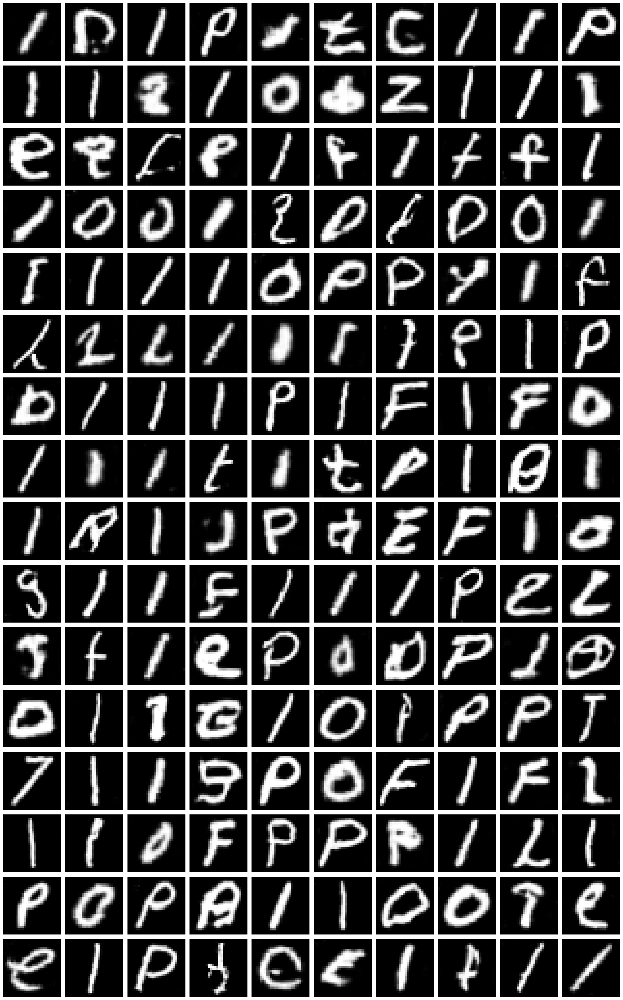

In [67]:
save_imgs(100)

Use Human Evaluation, plot sample of 50 image:

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


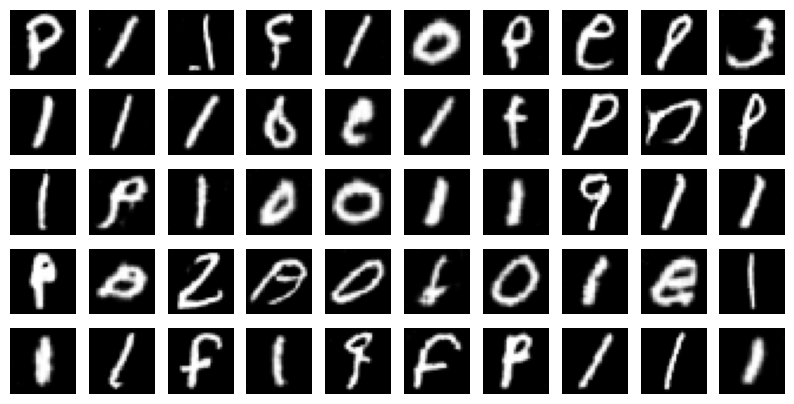

In [71]:
save_imgs_sample_50(epoch=100)

**OBSERVATIONS:**

Human Evaluation Score (epoch 100):<br>
- Passable: 44/50
- Nonsense: 6/50

Training for longer epochs was a huge improvement, the number of passable images increased from 30 to 44.

However, there is not much variety in the images, many images of "l" (20).

**What this means:**

That means our generator is getting stuck producing very similar outputs, likely because it's found a "safe" pattern that often fools the discriminator.

This is common in longer training runs when:

- The discriminator becomes too strong, or
- The generator gets lazy, exploiting an easy-to-fake shape (like "l").

**Why is it happening?**

- The generator finds that generating "l"-shaped characters consistently fools the discriminator (especially early on).
- Without enough diversity pressure, it keeps doing that, losing variety.
- In the letters context, this means it ignores other characters and gets stuck.

### 2) Adding Dropout in Generator

**What this does:**

this will help introduce randomness and reduce mode collapse by discouraging the generator from always producing the same shapes (like "l" & "P").

In [53]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)
discriminator.summary()

/home/kent/tf_gpu/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
I0000 00:00:1753440484.534444     515 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5592 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Ti, pci bus id: 0000:01:00.0, compute capability: 8.6


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 14, 14, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 7, 7, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8, 8, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 4, 4, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         4,097 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 393,729 (1.50 MB)

 Trainable params: 392,833 (1.50 MB)

 Non-trainable params: 896 (3.50 KB)

In [54]:
latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 128, activation='relu'),
        layers.Reshape((7, 7, 128)),

        layers.UpSampling2D(),
        layers.Conv2D(128, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),
        layers.Dropout(0.3),  # Add Dropout after activation

        layers.UpSampling2D(),
        layers.Conv2D(64, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),
        layers.Dropout(0.3),  # Another Dropout here

        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 6272)           │       633,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 14, 14, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 14, 14, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 1)      │           577 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 856,193 (3.27 MB)

 Trainable params: 855,809 (3.26 MB)

 Non-trainable params: 384 (1.50 KB)

In [55]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = ops.concatenate([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Assemble labels that say "all real images"
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

Change to save images every 10 epochs and save weights at final epoch:

In [56]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)

    def on_epoch_end(self, epoch, logs=None):
        # Save images only every 10 epochs
        if (epoch + 1) % 10 == 0:
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5  # [-1, 1] → [0, 255]
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()

            os.makedirs('DCGAN_generated', exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"DCGAN_generated/generated_img_{epoch+1:03d}_{i}.png")

            # Save weights every 10 epochs
            self.model.generator.save_weights(f"DCGAN_generated/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"DCGAN_generated/discriminator_epoch_{epoch+1:03d}.weights.h5")

In [59]:
epochs = 100

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train, 
    epochs=epochs, 
    callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)]
)

Epoch 1/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 19s 8ms/step - d_loss: 0.3426 - g_loss: 2.3565
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_loss: 0.3361 - g_loss: 2.3685
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - d_loss: 0.3357 - g_loss: 2.4093
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - d_loss: 0.3273 - g_loss: 2.4718
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_loss: 0.3276 - g_loss: 2.5027
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.3210 - g_loss: 2.5296
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - d_loss: 0.3206 - g_loss: 2.5573
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_loss: 0.3142 - g_loss: 2.5945
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - d_loss: 0.3127 - g_loss: 2.6179
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - d_loss: 0.3088 - g_loss: 2.6660
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - d_loss: 0.2999 - g_loss: 2.7002
Epoch 12

In [60]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('DCGAN_generated', exist_ok=True)  # Changed folder here
    fig.savefig(f"DCGAN_generated/DCGAN_{epoch}.png")  # Changed folder here
    plt.show()
    plt.close()

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step 


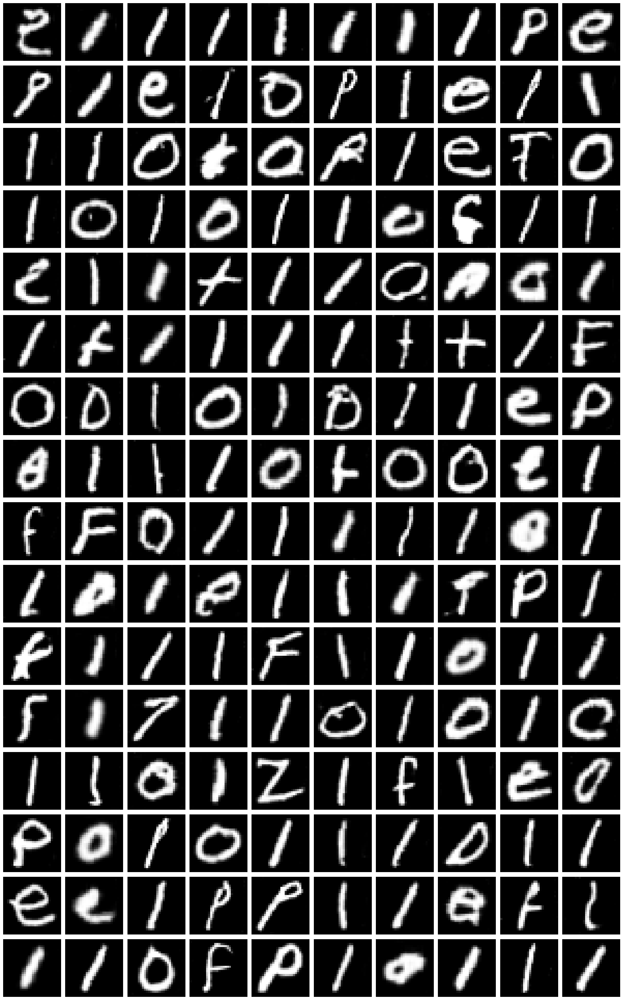

In [61]:
save_imgs(100)

In [63]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated', exist_ok=True)  # Changed folder here
    fig.savefig("DCGAN_generated/DCGAN__sample50_{:d}.png".format(epoch))  # Changed folder here
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step


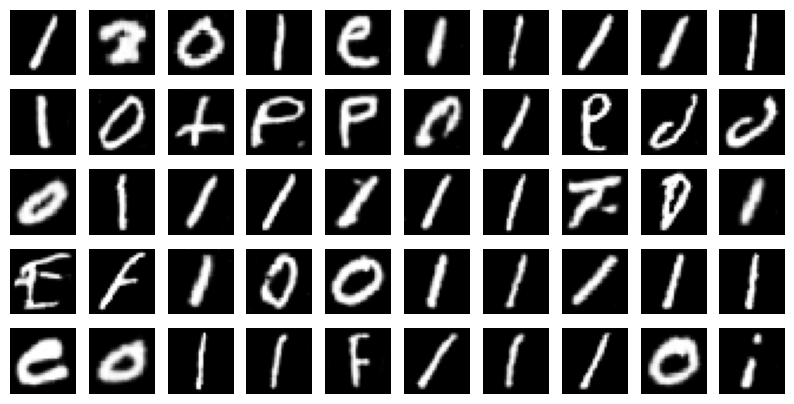

In [64]:
save_imgs_sample_50(epoch=100)

**OBSERVATIONS:**

Number of "l" generated (in 50 samples):

- No Dropout in Generator: 20<br>
- Dropout in Generator: 26

The number of "l" somehow increased, the g_loss also performed worse than without the dropouts.

Human Evaluation Score:

- Passable: 41/50
- Nonsense: 9/50

Adding dropout also produced slightly worse images.

**What this means:**

1. g_loss got worse after adding dropout in generator

- Dropout adds regularization but can slow down generator learning if applied too aggressively or in the wrong spots.
- Our g_loss increasing (getting larger) means the generator is struggling a bit more to fool the discriminator.
- Dropout can help generalization but might need tuning, try reducing the dropout rate or only adding dropout in certain layers.

2. More images of 'l' generated now (26 vs 20 before)

- This could mean our generator is mode-collapsing on certain classes, favoring generating certain letters (like "l").
- We can try techniques to reduce mode collapse like:
    - Adding noise to labels (label smoothing)



We can try tweaking the dropout value to see if it helps.

| Network       | Layer type         | Suggested Dropout         |
| ------------- | ------------------ | ------------------------- |
| Generator     | After dense/conv2D | **0.0 – 0.2** |
| Discriminator | After conv2D/dense | **0.25**             |



Try dropout at 0.2.

**COMMENTS:**

When trying 0.2 dropout, while training, the g_loss and d_loss were generating concerning values

Epoch 1/100<br>
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 22s 9ms/step - d_loss: -0.8033 - g_loss: 159.6640<br>
Epoch 50/100<br>
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - d_loss: 0.0276 - g_loss: 14.9222

I decided to stop it early in order to save time.

**What is going wrong?**

Discriminator is getting too weak.

- As d_loss drops close to or below zero, it implies the discriminator is no longer effectively training, possibly underfitting.
- The generator is getting large g_loss values (15–18) because it’s not being challenged enough.
- We’re seeing mode collapse risk or lack of useful feedback to generator.

**Summary of findings:**

| Component         | Dropout | Effect                                                                  |
| ----------------- | ------- | ----------------------------------------------------------------------- |
| **Generator**     | 0.3     | Too much, results in repetitive "l"-shaped outputs |
| **Generator**     | 0.2     | Weakens model, training collapses (0 d\_loss, 18 g\_loss)              |

**What to try next:**

1. Keep Discriminator Dropout at 0.3

- We need the discriminator to be strong enough to guide the generator. Based on the collapse at 0.2, 0.3 seems like a better base (or 0.25 at the very least). Do not go lower.

2. Remove Dropout from Generator

- In our case, the generator is very sensitive to dropout. Try training it without any dropout for now.
- The "l" over-generation suggests dropout was removing too many features, preventing the generator from learning fine structure. We want to maintain output stability first.

3. Add Label Smoothing in the Discriminator

- To prevent overconfidence in D and give G a better learning signal.

4. Add Gaussian Noise to Discriminator Inputs

- This helps the discriminator not memorize too easily, especially with grayscale or simple datasets like EMNIST.

### 3) Add Label Smoothing in the Discriminator

Instead of labeling real images as 1.0, we label them as something like 0.9 or even sample from a range like 0.8 to 1.0. This discourages the discriminator from becoming overconfident, giving the generator a chance to catch up.

**Does it fix the issue of too many "l" being generated?**

Only indirectly, if at all.

The problem of generating too many "l" images is likely due to:

- Mode collapse: The generator has found a "safe bet" (like generating "l") that the discriminator often accepts.
- Imbalanced feedback: If "l" is easy to fool the discriminator with, the generator gets rewarded for producing more of it.

Label smoothing:

- Can slightly reduce this risk because it makes the discriminator less harsh and rigid.
- But it’s not a full solution to mode collapse or overgeneration of one class or shape.

In [78]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)              │ (None, 14, 14, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 7, 7, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_2                │ (None, 8, 8, 64)       │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 8, 8, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 4, 4, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 4, 4, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_11 (LeakyReLU)      │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │         4,097 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 393,729 (1.50 MB)

 Trainable params: 392,833 (1.50 MB)

 Non-trainable params: 896 (3.50 KB)

In [69]:
generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 128, activation='relu'),
        layers.Reshape((7, 7, 128)),

        layers.UpSampling2D(),
        layers.Conv2D(128, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),

        layers.UpSampling2D(),
        layers.Conv2D(64, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),

        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)

Summary of Changes:

- Real image labels: random between 0.8 and 1.0.
- Fake image labels: random between 0.0 and 0.2.
- Generator still uses 1.0 labels for its "fooling" objective.
- Removed the older labels += 0.05 * tf.random.uniform(...) noise trick.

In [70]:
def train_step(self, real_images):
    # Sample random points in the latent space
    batch_size = ops.shape(real_images)[0]
    random_latent_vectors = keras.random.normal(
        shape=(batch_size, self.latent_dim), seed=self.seed_generator
    )

    # Generate fake images
    generated_images = self.generator(random_latent_vectors)

    # Combine real and fake images
    combined_images = ops.concatenate([real_images, generated_images], axis=0)

    # -------------------------------
    # Label smoothing:
    # Real labels: between 0.8 and 1.0
    # Fake labels: between 0.0 and 0.2 (optional, helps with robustness)
    real_labels = tf.random.uniform((batch_size, 1), minval=0.8, maxval=1.0)
    fake_labels = tf.random.uniform((batch_size, 1), minval=0.0, maxval=0.2)
    labels = ops.concatenate([real_labels, fake_labels], axis=0)
    # -------------------------------

    # Train the discriminator
    with tf.GradientTape() as tape:
        predictions = self.discriminator(combined_images)
        d_loss = self.loss_fn(labels, predictions)
    grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))

    # Train the generator
    random_latent_vectors = keras.random.normal(
        shape=(batch_size, self.latent_dim), seed=self.seed_generator
    )

    # Generator wants discriminator to think generated images are real → label = 1
    misleading_labels = tf.ones((batch_size, 1))  # No smoothing here!

    with tf.GradientTape() as tape:
        predictions = self.discriminator(self.generator(random_latent_vectors))
        g_loss = self.loss_fn(misleading_labels, predictions)
    grads = tape.gradient(g_loss, self.generator.trainable_weights)
    self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

    # Update metrics
    self.d_loss_metric.update_state(d_loss)
    self.g_loss_metric.update_state(g_loss)
    return {
        "d_loss": self.d_loss_metric.result(),
        "g_loss": self.g_loss_metric.result(),
    }

In [71]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)
        self.output_dir = "DCGAN_generated_label_smoothing"

    def on_epoch_end(self, epoch, logs=None):
        # Save images only every 10 epochs
        if (epoch + 1) % 10 == 0:
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5  # [-1, 1] → [0, 255]
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()

            os.makedirs(self.output_dir, exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"{self.output_dir}/generated_img_{epoch+1:03d}_{i}.png")

            # Save weights every 10 epochs
            self.model.generator.save_weights(f"{self.output_dir}/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"{self.output_dir}/discriminator_epoch_{epoch+1:03d}.weights.h5")

In [72]:
epochs = 100

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train, 
    epochs=epochs, 
    callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)]
)

Epoch 1/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - d_loss: 0.6277 - g_loss: 0.8878
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.6358 - g_loss: 0.9182
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6163 - g_loss: 0.9734
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5991 - g_loss: 1.0281
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5893 - g_loss: 1.0669
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - d_loss: 0.5847 - g_loss: 1.0924
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - d_loss: 0.5777 - g_loss: 1.1215
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 16s 9ms/step - d_loss: 0.5710 - g_loss: 1.1380
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - d_loss: 0.5649 - g_loss: 1.1589
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.5610 - g_loss: 1.1758
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5555 - g_loss: 1.1966
Epoch 12

In [73]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('DCGAN_generated_label_smoothing', exist_ok=True)  # Changed folder here
    fig.savefig(f"DCGAN_generated_label_smoothing/DCGAN_{epoch}.png")  # Changed folder here
    plt.show()
    plt.close()

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


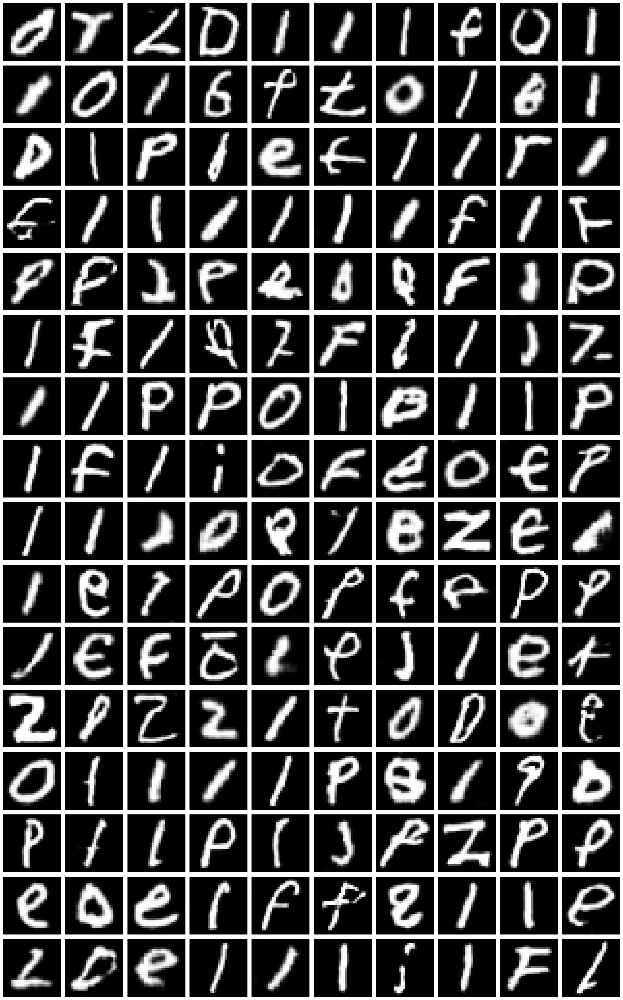

In [75]:
save_imgs(100)

In [76]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_label_smoothing', exist_ok=True)  # Changed folder here
    fig.savefig("DCGAN_generated_label_smoothing/DCGAN__sample50_{:d}.png".format(epoch))  # Changed folder here
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


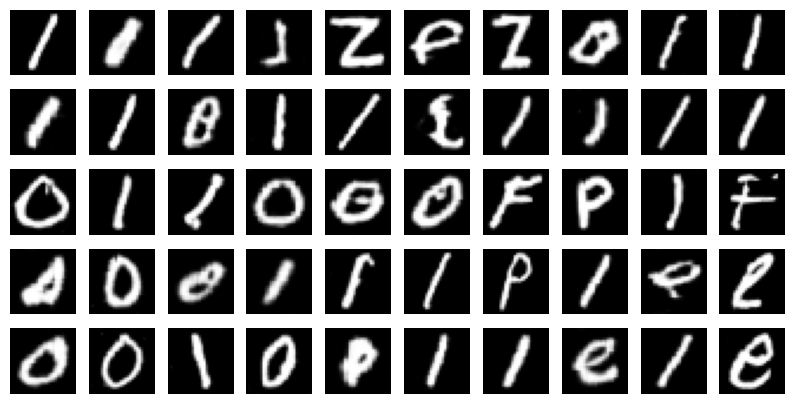

In [77]:
save_imgs_sample_50(100)

**OBSERVATIONS:**

The generated images were still dominated by characters resembling "l", "O", consistent with previous runs.

Number of "l" generated (in 50 samples):

- Without Label Smoothing: 20
- With Label Smoothing: 22

Label Smoothing barely helped with the "l" issue (expected).

Human Evaluation Score (With Label Smoothing):<br>
- Passable: 42/50
- Nonsense: 8/50

Human Evaluation Score (Without Label Smoothing):<br>
- Passable: 44/50
- Nonsense: 6/50

Adding Label Smoothing performed worse than without it. Stick to DCGAN without Label Smoothing

**Why label smoothing didn't help?**

Label smoothing is mainly designed to:

- Prevent the discriminator from becoming too confident in its classifications.
- Encourage the generator to receive useful gradients longer into training.

However, label smoothing does not force the generator to explore more modes or generate more diverse outputs. It only softens the discriminator's confidence. When the generator finds a shape (like "l") that successfully fools the discriminator, it has no reason to stop generating it, regardless of label smoothing.

In fact, label smoothing can unintentionally:

- Make the discriminator less able to penalize repetitive samples like "l"
- Result in weaker feedback to push the generator toward other modes (e.g., different letters)

**CONCLUSION:**

Label smoothing slightly hindered performance in this context and did not solve the core issue of mode collapse or class imbalance in the generated output.

Stick to DCGAN without label smoothing for better clarity and slightly more variety.

Next, try:

### 4) Add Gaussian Noise to Discriminator Input

Injecting Gaussian noise into the discriminator’s input can make it less confident and force it to focus on more meaningful features rather than memorizing fine details.

**Expected Benefits:**

- Encourages the discriminator to generalize more.
- Helps disrupt early overfitting to easy examples like "l".
- Forces the generator to learn broader patterns to "fool" the discriminator.

Add Guassian noise to discriminator code:

In [49]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.GaussianNoise(0.1),  # Add Gaussian noise to inputs
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)

I0000 00:00:1753770202.194001    2864 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 21586 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:21:00.0, compute capability: 8.6
/home/test/tf_gpu/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [55]:
latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 128, activation='relu'),
        layers.Reshape((7, 7, 128)),
        layers.UpSampling2D(),
        layers.Conv2D(128, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),
        layers.UpSampling2D(),
        layers.Conv2D(64, kernel_size=3, padding='same'),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),
        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 6272)           │       633,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 14, 14, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 14, 14, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 28, 28, 1)      │           577 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 856,193 (3.27 MB)

 Trainable params: 855,809 (3.26 MB)

 Non-trainable params: 384 (1.50 KB)

In [56]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = ops.concatenate([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Assemble labels that say "all real images"
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [52]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)
        self.output_dir = "DCGAN_generated_gaussian_noise"  # Updated folder name

    def on_epoch_end(self, epoch, logs=None):
        # Save images only every 10 epochs
        if (epoch + 1) % 10 == 0:
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5  # [-1, 1] → [0, 255]
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()

            os.makedirs(self.output_dir, exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"{self.output_dir}/generated_img_{epoch+1:03d}_{i}.png")

            # Save weights every 10 epochs
            self.model.generator.save_weights(f"{self.output_dir}/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"{self.output_dir}/discriminator_epoch_{epoch+1:03d}.weights.h5")

In [53]:
epochs = 100

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train, 
    epochs=epochs, 
    callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)]
)

Epoch 1/100


I0000 00:00:1753770212.505031    3113 service.cc:152] XLA service 0x7f90e00085a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1753770212.505064    3113 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2025-07-29 14:23:32.578267: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-07-29 14:23:32.693742: W tensorflow/compiler/tf2xla/kernels/random_ops.cc:62] Warning: Using tf.random.uniform with XLA compilation will ignore seeds; consider using tf.random.stateless_uniform instead if reproducible behavior is desired. random_uniform/RandomUniform
I0000 00:00:1753770213.074544    3113 cuda_dnn.cc:529] Loaded cuDNN version 90300


  15/1706 ━━━━━━━━━━━━━━━━━━━━ 21s 13ms/step - d_loss: 0.6512 - g_loss: 0.6844

I0000 00:00:1753770216.792852    3113 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1706/1706 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - d_loss: 0.6206 - g_loss: 0.9174
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6402 - g_loss: 0.9038
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6149 - g_loss: 0.9727
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5965 - g_loss: 1.0305
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5846 - g_loss: 1.0787
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5749 - g_loss: 1.1201
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - d_loss: 0.5699 - g_loss: 1.1421
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5637 - g_loss: 1.1669
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5590 - g_loss: 1.1786
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - d_loss: 0.5539 - g_loss: 1.1945
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.5516 - g_loss: 1.2115
Epoch 12/100
1706/1706 ━━━━

In [54]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('DCGAN_generated_guassian_noise', exist_ok=True)  # Changed folder here
    fig.savefig(f"DCGAN_generated_guassian_noise/DCGAN_{epoch}.png")  # Changed folder here
    plt.show()
    plt.close()

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step


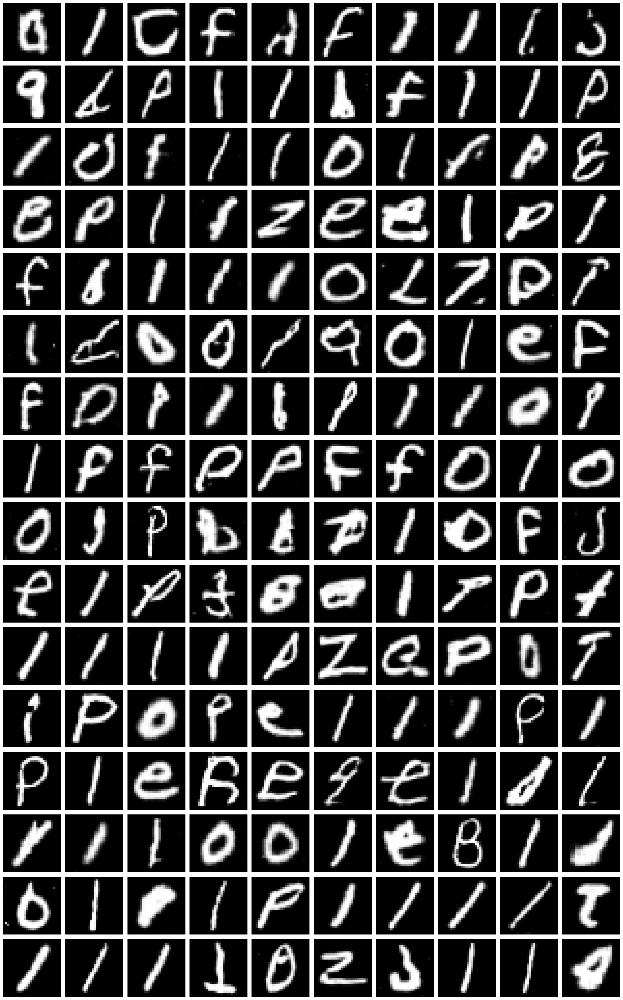

In [55]:
save_imgs(100)

In [56]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_guassian_noise', exist_ok=True)  # Changed folder here
    fig.savefig("DCGAN_generated_guassian_noise/DCGAN__sample50_{:d}.png".format(epoch))  # Changed folder here
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


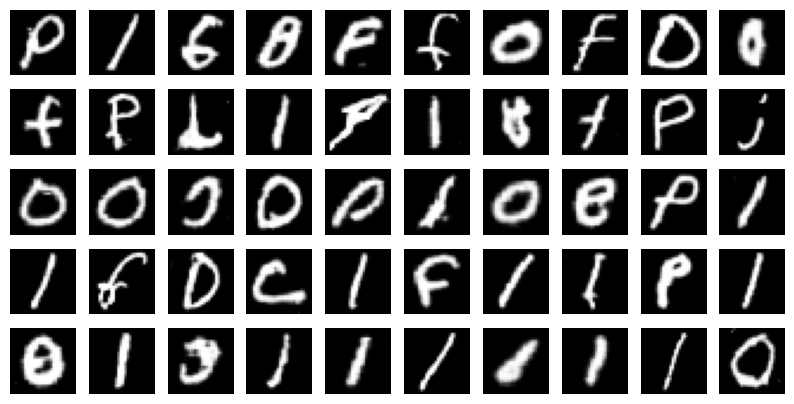

In [57]:
save_imgs_sample_50(100)

**OBSERVATIONS:**

Number of "l" generated (in 50 samples):

- Without Guassian Noise: 20
- With Guassian Noise: 14

Overall less number of "l" generated, Guassian noise in the discriminator helped.

Human Evaluation Score (With Guassian Noise):<br>
- Passable: 38/50
- Nonsense: 12/50

Human Evaluation Score (Without Guassian Noise):<br>
- Passable: 44/50
- Nonsense: 6/50

While adding Guassian noise to the discriminator input reduced class bias, it also lowered overall image quality.

**Why did Guassian noise make DCGAN generate lower quality images?**

1. Discriminator Becomes Less Accurate

Gaussian noise is meant to regularize the discriminator by preventing it from overfitting. But early in training, it can make the discriminator too weak, giving the generator poor feedback, which leads to lower-quality images.

2. Slower or Unstable Learning

The noise adds randomness to real and fake inputs, which can cause the model to take longer to converge or generate inconsistent outputs, especially if the noise level is too high or training time is short.

3. Trade-Off: Diversity vs. Sharpness

While noise helps reduce overfitting and class dominance (like too many "l"s), it can also make the generator produce blurrier or less distinct images, resulting in a lower passable score.

**CONCLUSION:**

Gaussian noise improved diversity (fewer repeated letters) but weakened image clarity and sharpness, causing more outputs to be judged as nonsense. To improve results, we could fine-tune the noise level or apply it selectively during early epochs only.

**Improvements to try:**

Option 1: Fine-tune the Noise Level<br>
What it means: Lower the standard deviation of the Gaussian noise (e.g., from 0.1 to 0.05).

Pros:

- Easy to Implement.
- Keeps noise throughout the training, but in midler form.
- Reduces the risk of overwhelming the discriminator.

Cons:

- Might not fully prevent class bias if noise is too low.
- Still affects image sharpness slightly.

Recommended if: We want a quick fix with minimal code changes and still value some regularization.

Option 2: Apply Noise Only During Early Epochs<br>
What it means: Add Gaussian noise in the discriminator only for the first N epochs (e.g., first 20 out of 100).

Pros:

- Regularizes training early, when overfitting and bias start forming.
- Later epochs focus on sharpness and quality without noise.
- Balances diversity and image clarity.

Cons:

- Slightly more complex (requires custom logic or a flag in training loop).
- Needs tuning of the cutoff epoch.

Recommended if: small code change and want the best balance of diversity + quality.

**CONCLUSION:**

We will go with Option 2: apply noise during early epochs only, it gives you the benefits of regularization without hurting late-stage image quality.

In [63]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)

Custom discriminator with conditional Gaussian noise:

In [64]:
class NoisyDiscriminator(keras.Model):
    def __init__(self, max_noisy_epochs=10, noise_stddev=0.1):
        super().__init__()
        self.max_noisy_epochs = max_noisy_epochs
        self.noise_stddev = noise_stddev
        self.current_epoch = 0

        self.noise = layers.GaussianNoise(self.noise_stddev)
        self.model = keras.Sequential([
            layers.Conv2D(32, kernel_size=3, strides=2, padding="same", input_shape=(28, 28, 1)),
            layers.LeakyReLU(0.2),
            layers.Dropout(0.25),
            layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
            layers.ZeroPadding2D(((0, 1), (0, 1))),
            layers.BatchNormalization(momentum=0.8),
            layers.LeakyReLU(0.2),
            layers.Dropout(0.25),
            layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
            layers.BatchNormalization(momentum=0.8),
            layers.LeakyReLU(0.2),
            layers.Dropout(0.25),
            layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
            layers.BatchNormalization(momentum=0.8),
            layers.LeakyReLU(0.2),
            layers.Dropout(0.25),
            layers.Flatten(),
            layers.Dense(1, activation="sigmoid"),
        ])

    def call(self, inputs, training=False):
        if training and self.current_epoch < self.max_noisy_epochs:
            inputs = self.noise(inputs, training=training)
        return self.model(inputs, training=training)

    def set_epoch(self, epoch):
        self.current_epoch = epoch

In [65]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)
        self.output_dir = "DCGAN_generated_gaussian_noise_v2"

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 10 == 0:
            # Generate and save images
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()
    
            os.makedirs(self.output_dir, exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"{self.output_dir}/generated_img_{epoch+1:03d}_{i}.png")
    
            # Save weights every 10 epochs
            self.model.generator.save_weights(f"{self.output_dir}/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"{self.output_dir}/discriminator_epoch_{epoch+1:03d}.weights.h5")

Gaussian noise will be applied during epochs 0 to 9, and disabled from epoch 10 onwards.

In [66]:
class EpochTrackerCallback(keras.callbacks.Callback):
    def __init__(self, discriminator_model):
        self.discriminator_model = discriminator_model

    def on_epoch_begin(self, epoch, logs=None):
        self.discriminator_model.set_epoch(epoch)


# Setup
latent_dim = 100
epochs = 100
discriminator = NoisyDiscriminator(max_noisy_epochs=10)

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train,
    epochs=epochs,
    callbacks=[
        EpochTrackerCallback(discriminator),
        GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)
    ]
)

/home/test/tf_gpu/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - d_loss: 0.6775 - g_loss: 0.7965
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6764 - g_loss: 0.7864
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6726 - g_loss: 0.7963
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6673 - g_loss: 0.8115
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6602 - g_loss: 0.8266
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6546 - g_loss: 0.8474
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6486 - g_loss: 0.8614
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6458 - g_loss: 0.8743
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6393 - g_loss: 0.8898
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - d_loss: 0.6345 - g_loss: 0.9009
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6309 - g_loss: 0.9152
Epoch 12/100
17

In [67]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('DCGAN_generated_guassian_noise_v2', exist_ok=True)  # Changed folder here
    fig.savefig(f"DCGAN_generated_guassian_noise_v2/DCGAN_{epoch}.png")  # Changed folder here
    plt.show()
    plt.close()

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


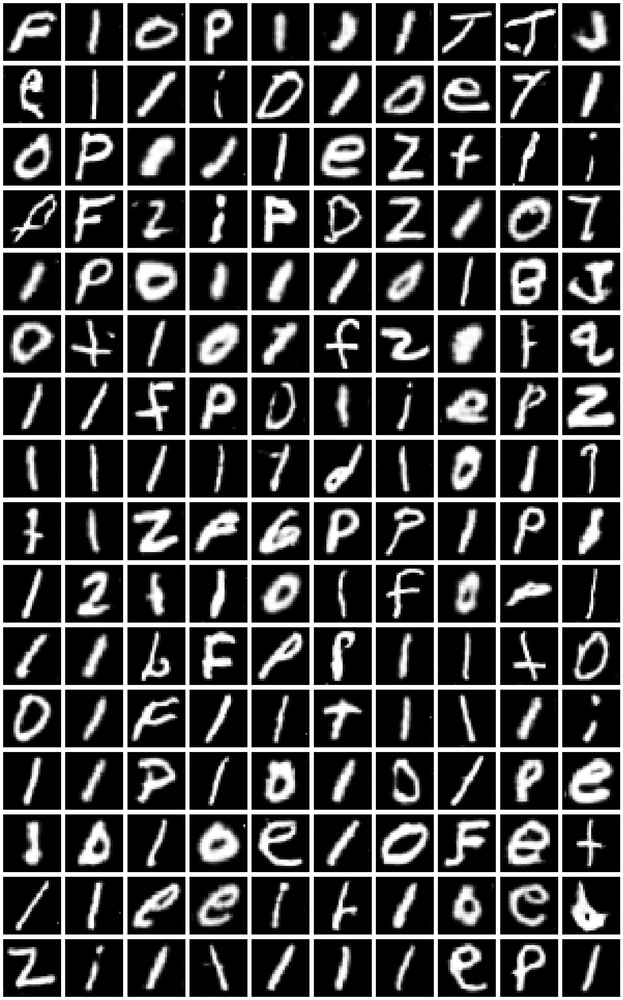

In [68]:
save_imgs(100)

In [69]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_guassian_noise_v2', exist_ok=True)  # Changed folder here
    fig.savefig("DCGAN_generated_guassian_noise_v2/DCGAN__sample50_{:d}.png".format(epoch))  # Changed folder here
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step 


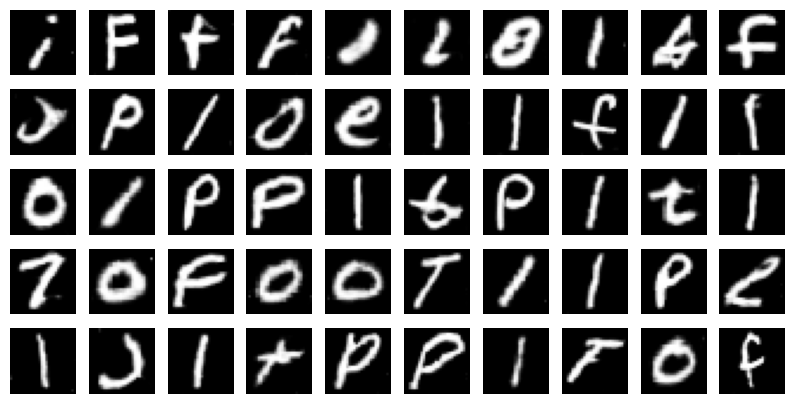

In [71]:
save_imgs_sample_50(100)

**OBSERVATIONS:**

Number of "l" generated (in 50 samples):

Without Guassian Noise: 20<br>
With Guassian Noise: 14<br>
With Guassian Noise for first 10 Epochs only: 14

Human Evaluation Score (With Guassian Noise):<br>
- Passable: 38/50
- Nonsense: 12/50

Human Evaluation Score (Without Guassian Noise):<br>
- Passable: 44/50
- Nonsense: 6/50

Human Evaluation Score (With Guassian Noise for first 10 Epochs):<br>
- Passable: 36/50
- Nonsense: 14/50

This suggests that early-only noise injection disrupted the learning dynamics without offering sustained benefits.

**Why did performance deprove:**

Discriminator Was Weak Early, Then Too Strong

Applying noise early made the discriminator initially weak, which is expected to help the generator explore more. However, once the noise was removed after epoch 10, the discriminator likely became too confident too quickly, overpowering the generator and destabilizing learning. This sudden shift can harm the balance crucial in GAN training.

**CONCLUSION:**

Stick with the model with Guassian noise throughout all epochs.

### 5) Try Deeper Generator: add more upsampling or a dense layer

From our logs of training with the previous Guassian noise model, we can see that:

- Discriminator loss (d_loss) is decreasing smoothly, starting around 0.65 and ending at 0.17.
- Generator loss (g_loss) is steadily increasing, starting around 0.68 and ending at 4.31.

**What this pattern means:**

- The generator is getting better at fooling the discriminator.
- The discriminator is losing its ability to tell real from fake (which might be expected in later epochs).
- But: A very high generator loss might also mean it's struggling, especially if generated images are blurry or repetitive.

**We should try a deeper model if:**

- Our generated images look blurry, repetitive, or lack detail
- We are seeing mode collapse (e.g., too many “l” letters, not enough variation)
- We want to increase image sharpness or structural accuracy
- Our generator loss is high and keeps increasing, even though discriminator is doing well

From our previous model, we had issues of too many "l" letters and our generator loss is steadily increasing.

That suggests the generator might be underpowered, and increasing its capacity could help.

**Updated Generator:**

- Feature channels: 128 → 256 at the beginning
- Number of conv layers from 3 → 5
- Good for increasing expressiveness while still suitable for 28x28 images

In [66]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.GaussianNoise(0.1),  # Add Gaussian noise to inputs
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)

In [58]:
latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 256),  # More features
        layers.Reshape((7, 7, 256)),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),

        layers.UpSampling2D(),  # 14x14
        layers.Conv2D(128, kernel_size=3, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(128, kernel_size=3, padding="same"),  # Extra conv
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.UpSampling2D(),  # 28x28
        layers.Conv2D(64, kernel_size=3, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(32, kernel_size=3, padding="same"),  # Final feature layer
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)

In [59]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = ops.concatenate([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Assemble labels that say "all real images"
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [60]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)
        self.output_dir = "DCGAN_generated_deeper_model"  # Updated folder name

    def on_epoch_end(self, epoch, logs=None):
        # Save images and weights every 10 epochs
        if (epoch + 1) % 10 == 0:
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5  # [-1, 1] → [0, 255]
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()

            os.makedirs(self.output_dir, exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"{self.output_dir}/generated_img_{epoch+1:03d}_{i}.png")

            # Save weights every 10 epochs
            self.model.generator.save_weights(f"{self.output_dir}/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"{self.output_dir}/discriminator_epoch_{epoch+1:03d}.weights.h5")

In [61]:
epochs = 100

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train, 
    epochs=epochs, 
    callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)]
)

Epoch 1/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 23s 9ms/step - d_loss: 0.5111 - g_loss: 4.3732
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.6708 - g_loss: 0.8205
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6666 - g_loss: 0.8331
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6638 - g_loss: 0.8384
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.6610 - g_loss: 0.8459
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6569 - g_loss: 0.8566
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.6590 - g_loss: 0.8546
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6583 - g_loss: 0.8537
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6593 - g_loss: 0.8562
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.6558 - g_loss: 0.8622
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - d_loss: 0.6556 - g_loss: 0.8664
Epoch 12

In [62]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('DCGAN_generated_deeper_model', exist_ok=True)  # Changed folder here
    fig.savefig(f"DCGAN_generated_deeper_model/DCGAN_{epoch}.png")  # Changed folder here
    plt.show()
    plt.close()

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step


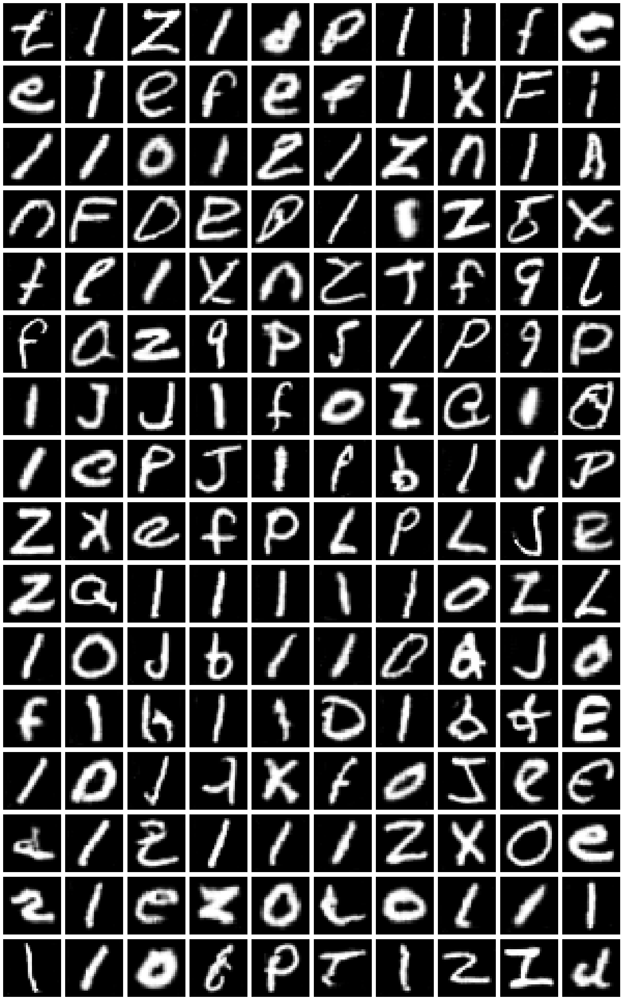

In [63]:
save_imgs(100)

In [64]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_deeper_model', exist_ok=True)  # Changed folder here
    fig.savefig("DCGAN_generated_deeper_model/DCGAN__sample50_{:d}.png".format(epoch))  # Changed folder here
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step


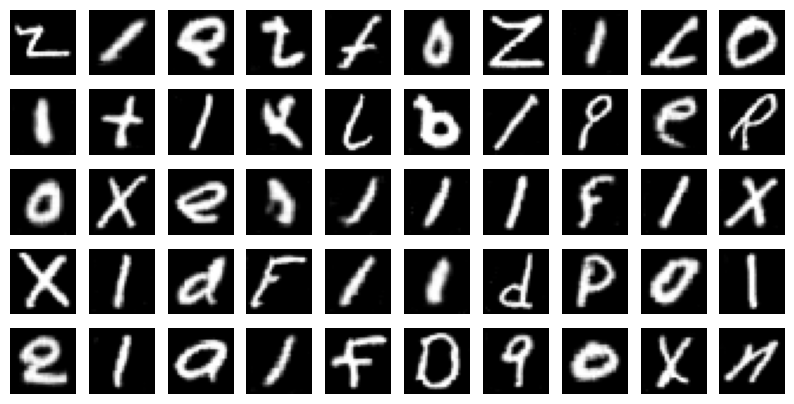

In [65]:
save_imgs_sample_50(100)

**OBSERVATIONS:**

Human Evaluation Score (Original Model):<br>
- Passable: 38/50
- Nonsense: 12/50

Human Evaluation Score (Deeper Model):<br>
- Passable: 45/50
- Nonsense: 5/50

**Why the deeper model performed better:**

The deeper generator had more layers and parameters, giving it greater capacity to learn complex patterns in the data. This helped it:

- Generate more realistic and varied images, leading to a higher number of passable samples.
- Avoid repetitive or low-quality outputs (e.g., fewer distorted or nonsense letters).
- Better respond to discriminator feedback, especially since Gaussian noise in the discriminator can weaken early training signals, a more powerful generator helps compensate.

### 6)  Two-Time-Scale Update Rule (TTUR)

Tweak & use different learning rates.

This will be done with hyperparameter tuning.

---

## Hyperparameter Tuning

---

We do not tune all at once, That’s inefficient, chaotic, and hard to debug.

Our approach:

Step 1: Balance G and D

- Learning rates

Step 2: Fine-Tuning

- Training time (more epochs, batch size, etc.)

### 1) Balance G and D

In [55]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.GaussianNoise(0.1),  # Add Gaussian noise to inputs
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)

In [56]:
latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 256),  # More features
        layers.Reshape((7, 7, 256)),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),

        layers.UpSampling2D(),  # 14x14
        layers.Conv2D(128, kernel_size=3, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(128, kernel_size=3, padding="same"),  # Extra conv
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.UpSampling2D(),  # 28x28
        layers.Conv2D(64, kernel_size=3, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(32, kernel_size=3, padding="same"),  # Final feature layer
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)

In [57]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = ops.concatenate([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Assemble labels that say "all real images"
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [58]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=100):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)
        self.output_dir = "DCGAN_generated_hyperparameter_tuning"  # Updated folder name

    def on_epoch_end(self, epoch, logs=None):
        # Save images and weights every 10 epochs
        if (epoch + 1) % 10 == 0:
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5  # [-1, 1] → [0, 255]
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()

            os.makedirs(self.output_dir, exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"{self.output_dir}/generated_img_{epoch+1:03d}_{i}.png")

            # Save weights every 10 epochs
            self.model.generator.save_weights(f"{self.output_dir}/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"{self.output_dir}/discriminator_epoch_{epoch+1:03d}.weights.h5")

Use a smaller number of epochs to test combinations quickly:

**Original d_lr, g_lr: 0.0002, 0.0002**

In [53]:
epochs = 20
latent_dim = 100

ttur_configs = [
    (0.0002, 0.0002),
    (0.0004, 0.0001),
    (0.0001, 0.0004),
    (0.0002, 0.0001),
    (0.0001, 0.0002),
    (0.0003, 0.00005),
    (0.00005, 0.0003)
]

# Function to save 50 sample images after training
def save_imgs_sample_50(generator, latent_dim, config_name):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale from [-1, 1] to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_ttur', exist_ok=True)
    fig.savefig(f"DCGAN_generated_ttur/sample50_{config_name}.png")
    plt.close()


# Main TTUR training loop
for d_lr, g_lr in ttur_configs:
    print(f"\nTraining with D LR: {d_lr}, G LR: {g_lr}")

    # Rebuild model
    gan = GAN(
        discriminator=keras.models.clone_model(discriminator),
        generator=keras.models.clone_model(generator),
        latent_dim=latent_dim
    )

    gan.compile(
        d_optimizer=keras.optimizers.Adam(learning_rate=d_lr, beta_1=0.5),
        g_optimizer=keras.optimizers.Adam(learning_rate=g_lr, beta_1=0.5),
        loss_fn=keras.losses.BinaryCrossentropy()
    )

    # Naming this run
    run_name = f"TTUR_D{d_lr}_G{g_lr}".replace(".", "")

    # Train
    gan.fit(
        X_train,
        epochs=epochs,
        callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)],
    )

    # Save 50 images after training for this config
    save_imgs_sample_50(gan.generator, latent_dim, config_name=run_name)


Training with D LR: 0.0002, G LR: 0.0002
Epoch 1/20


I0000 00:00:1754372900.882255     893 service.cc:152] XLA service 0x7fbe50003120 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754372900.882291     893 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2025-08-05 13:48:20.992918: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-05 13:48:21.159862: W tensorflow/compiler/tf2xla/kernels/random_ops.cc:62] Warning: Using tf.random.uniform with XLA compilation will ignore seeds; consider using tf.random.stateless_uniform instead if reproducible behavior is desired. random_uniform/RandomUniform
I0000 00:00:1754372901.682856     893 cuda_dnn.cc:529] Loaded cuDNN version 90300


   5/1706 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - d_loss: 0.6772 - g_loss: 0.6901

I0000 00:00:1754372906.777516     893 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1706/1706 ━━━━━━━━━━━━━━━━━━━━ 28s 10ms/step - d_loss: 0.5329 - g_loss: 3.0063
Epoch 2/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6761 - g_loss: 0.8049
Epoch 3/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6641 - g_loss: 0.8320
Epoch 4/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - d_loss: 0.6626 - g_loss: 0.8420
Epoch 5/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6595 - g_loss: 0.8479
Epoch 6/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6595 - g_loss: 0.8506
Epoch 7/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - d_loss: 0.6578 - g_loss: 0.8553
Epoch 8/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6559 - g_loss: 0.8633
Epoch 9/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6550 - g_loss: 0.8664
Epoch 10/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_loss: 0.6528 - g_loss: 0.8726
Epoch 11/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - d_loss: 0.6515 - g_loss: 0.8763
Epoch 12/20
1706/1706 ━━━━━━━

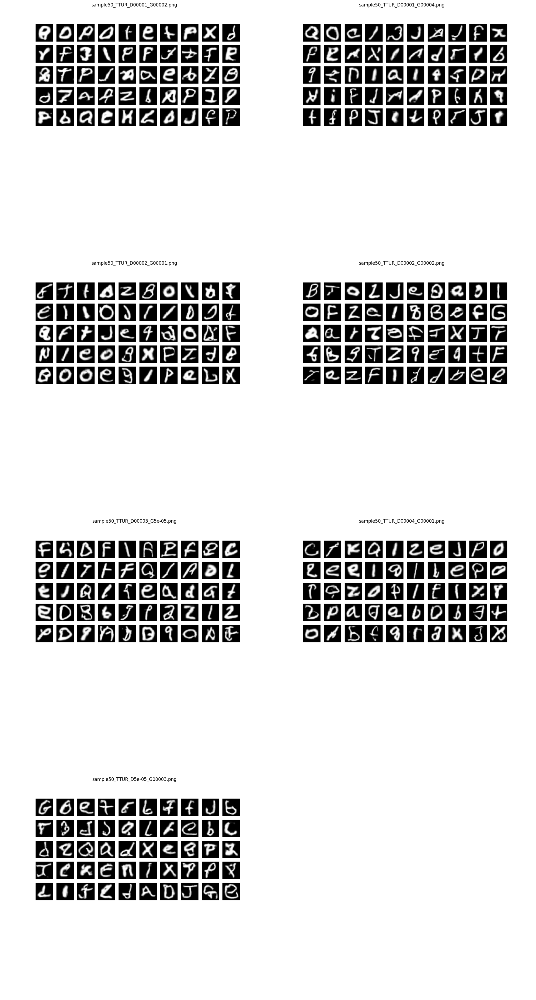

In [61]:
# Directory containing the generated images
folder = "DCGAN_generated_ttur"

# Get all PNG files that match the naming pattern
image_files = sorted([f for f in os.listdir(folder) if f.startswith("sample50_") and f.endswith(".png")])

# Grid dimensions
cols = 2  # fewer columns = larger images
rows = (len(image_files) + cols - 1) // cols  # round up

# Increase figure size for larger images
fig, axs = plt.subplots(rows, cols, figsize=(cols * 10, rows * 10))  # each image gets 10x10 space

# Flatten axes for easy indexing
axs = axs.flatten()

# Plot each image
for i, filename in enumerate(image_files):
    img_path = os.path.join(folder, filename)
    img = mpimg.imread(img_path)
    axs[i].imshow(img)
    axs[i].set_title(filename, fontsize=12)
    axs[i].axis('off')

# Hide unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

**OBSERVATIONS:**

Learning rate (D: 0.0002, G: 0.0002) (Original):

- Passable: 32/50
- Nonsense: 18/50

Learning rate (D: 0.0001, G: 0.0002):

- Passable: 29/50
- Nonsense: 21/50

Learning rate (D: 0.0002, G: 0.0001):

- Passable: 33/50
- Nonsense: 17/50

Learning rate (D: 0.0004, G: 0.0001):

- Passable: 31/50
- Nonsense: 19/50

Learning rate (D: 0.0004, G: 0.0001):

- Passable: 37/50
- Nonsense: 13/50

Learning rate (D: 0.0003, G: 0.00005):

- Passable: 30/50
- Nonsense: 20/50

Learning rate (D: 0.00005, G: 0.0003):

- Passable: 31/50
- Nonsense: 19/50

**SUMMARY:**

| Discriminator LR | Generator LR | Passable | Nonsense | Final D Loss | Final G Loss | Notes                                                    |
| ---------------- | ------------ | -------- | -------- | ------------ | ------------ | -------------------------------------------------------- |
| **0.0002**       | **0.0002**   | 32       | 18       | 0.6320       | 0.9379       | Balanced, steady convergence                             |
| **0.0001**       | **0.0002**   | 29       | 21       | 0.6869       | 0.7609       | Slight generator underfitting                            |
| **0.0002**       | **0.0001**   | 33       | 17       | 0.5916       | 1.0750       | Good discriminator convergence, slower G                 |
| **0.0004**       | **0.0001**   | **37**   | **13**   | 0.5021       | 1.4997       | Strongest generator learning; G loss high due to scaling |
| **0.0003**       | **0.00005**  | 30       | 20       | 0.4586       | 1.6469       | Stable training, but lower passable count                |
| **0.00005**      | **0.0003**   | 31       | 19       | 0.6903       | 0.7497       | Plateauing behavior; G quickly dominates                 |
| **0.0001**       | **0.0004**   | 31       | 19       | 0.6881       | 0.7563       | Discriminator too slow; generator flat                   |

Well-Converged Runs:

- D LR 0.0002, G LR 0.0002: Smooth g_loss rise, d_loss decline. Most stable and balanced convergence.
- D LR 0.0002, G LR 0.0001: Discriminator learned well (d_loss down to 0.59), generator slower but consistent.
- D LR 0.0004, G LR 0.0001: Fastest convergence. g_loss increases steadily (means generator improving). High passable output.

Imbalanced or Unstable Runs:

- D LR 0.0001, G LR 0.0002 and D LR 0.0001, G LR 0.0004: Discriminator too slow to learn => d_loss stuck high, training plateaus.
- D LR 0.0003, G LR 0.00005: Good D, but generator lags behind too much (slow recovery of g_loss).
- D LR 0.00005, G LR 0.0003: Early spike in g_loss, then flat behavior, signs of G overpowering or D collapsing.

**Best Learning Rate:**

Discriminator LR = 0.0004, Generator LR = 0.0001

- Highest passable output (37/50)
- Stable and improving loss curves:

    - d_loss decreased from 0.46 → 0.50 range
    - g_loss increased smoothly to 1.5, which is not a bad sign – it often reflects that the generator is producing stronger signals that the discriminator finds harder to reject

**CONCLUSION:**

We did not choose a slower discriminator learning rate, even though it resulted in more "converged" generator and discriminator losses, because it led to weaker training dynamics. A slow discriminator fails to provide strong feedback, causing the generator to dominate early and plateau in performance. While the losses appeared stable, image quality stagnated. In contrast, a higher discriminator learning rate provided stronger gradients, leading to better image generation despite higher generator loss. This aligns with the TTUR principle where the discriminator should learn faster to effectively guide the generator.



### 2) Fine-Tuning

Tune Batch Size:

In [53]:
epochs = 20
latent_dim = 100

batch_sizes = [16, 32, 64, 128]

# Function to save 50 sample images after training
def save_imgs_sample_50(generator, latent_dim, config_name):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale from [-1, 1] to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_batchsize', exist_ok=True)
    fig.savefig(f"DCGAN_generated_batchsize/sample50_bs{config_name}.png")
    plt.close()

# Main batch size training loop
for bs in batch_sizes:
    print(f"\nTraining with batch size: {bs}")

    # Create new dataset per batch size
    dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(buffer_size=1024).batch(bs)

    # Rebuild model
    gan = GAN(
        discriminator=keras.models.clone_model(discriminator),
        generator=keras.models.clone_model(generator),
        latent_dim=latent_dim
    )

    gan.compile(
        d_optimizer=keras.optimizers.Adam(learning_rate=0.0004, beta_1=0.5),
        g_optimizer=keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5),
        loss_fn=keras.losses.BinaryCrossentropy()
    )

    # Name of this run
    run_name = f"{bs}"

    # Train
    gan.fit(
        dataset,
        epochs=epochs,
        callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)],
    )

    # Save 50 images after training for this batch size
    save_imgs_sample_50(gan.generator, latent_dim, config_name=run_name)


Training with batch size: 16
Epoch 1/20


I0000 00:00:1754629616.303809     732 service.cc:152] XLA service 0x791448014b60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754629616.303854     732 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Ti, Compute Capability 8.6
2025-08-08 13:06:56.396126: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-08 13:06:56.554805: W tensorflow/compiler/tf2xla/kernels/random_ops.cc:62] Warning: Using tf.random.uniform with XLA compilation will ignore seeds; consider using tf.random.stateless_uniform instead if reproducible behavior is desired. random_uniform/RandomUniform
I0000 00:00:1754629617.019273     732 cuda_dnn.cc:529] Loaded cuDNN version 90300


   7/3412 ━━━━━━━━━━━━━━━━━━━━ 1:04 19ms/step - d_loss: 0.6496 - g_loss: 0.6563

I0000 00:00:1754629621.665677     732 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3412/3412 ━━━━━━━━━━━━━━━━━━━━ 38s 9ms/step - d_loss: 3.3262 - g_loss: 116.9678
Epoch 2/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 24s 7ms/step - d_loss: 0.6164 - g_loss: 1.1432
Epoch 3/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - d_loss: 0.6064 - g_loss: 1.0904
Epoch 4/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 24s 7ms/step - d_loss: 0.5925 - g_loss: 1.1179
Epoch 5/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - d_loss: 0.5860 - g_loss: 1.1257
Epoch 6/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 23s 7ms/step - d_loss: 0.5789 - g_loss: 1.1561
Epoch 7/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 27s 8ms/step - d_loss: 0.5735 - g_loss: 1.1778
Epoch 8/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 25s 7ms/step - d_loss: 0.5647 - g_loss: 1.2079
Epoch 9/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - d_loss: 0.5583 - g_loss: 1.2376
Epoch 10/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 24s 7ms/step - d_loss: 0.5499 - g_loss: 1.2692
Epoch 11/20
3412/3412 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - d_loss: 0.5435 - g_loss: 1.2995
Epoch 12/20
3412/3412 ━━━━━━

2025-08-08 13:14:55.549578: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng0{} for conv %cudnn-conv-bw-input.27 = (f32[32,128,14,14]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,128,14,14]{3,2,1,0} %bitcast.15745, f32[128,128,3,3]{3,2,1,0} %bitcast.15682), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", metadata={op_type="Conv2DBackpropInput" op_name="gradient_tape/generator_3/conv2d_5_1/convolution/Conv2DBackpropInput" source_file="/home/kent/tf_gpu/lib/python3.12/site-packages/tensorflow/python/framework/ops.py" source_line=1200}, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false} is taking a while...
2025-08-08 13:14:55.553184: E external/local_xla/xla/service/slow_operation_alarm.cc:140] The operation took 2.926530503s
Trying a

1706/1706 ━━━━━━━━━━━━━━━━━━━━ 33s 12ms/step - d_loss: 0.7920 - g_loss: 22.6773
Epoch 2/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - d_loss: 0.5579 - g_loss: 1.1992
Epoch 3/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5663 - g_loss: 1.1945
Epoch 4/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - d_loss: 0.5479 - g_loss: 1.2502
Epoch 5/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5539 - g_loss: 1.2557
Epoch 6/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 19s 11ms/step - d_loss: 0.5517 - g_loss: 1.2326
Epoch 7/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5543 - g_loss: 1.2287
Epoch 8/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - d_loss: 0.5537 - g_loss: 1.2296
Epoch 9/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5596 - g_loss: 1.2514
Epoch 10/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 20s 11ms/step - d_loss: 0.5538 - g_loss: 1.2465
Epoch 11/20
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5497 - g_loss: 1.2427
Epoch 12/20
1706/1706 ━

2025-08-08 13:20:33.571820: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 340 bytes spill stores, 340 bytes spill loads

2025-08-08 13:20:33.660487: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 380 bytes spill stores, 380 bytes spill loads



853/853 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - d_loss: 1.0995 - g_loss: 31.1715
Epoch 2/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - d_loss: 0.6085 - g_loss: 1.0531
Epoch 3/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - d_loss: 0.6157 - g_loss: 0.9996
Epoch 4/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 14s 16ms/step - d_loss: 0.6041 - g_loss: 1.0551
Epoch 5/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - d_loss: 0.5964 - g_loss: 1.0755
Epoch 6/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - d_loss: 0.5836 - g_loss: 1.1178
Epoch 7/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 13s 16ms/step - d_loss: 0.5836 - g_loss: 1.1276
Epoch 8/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - d_loss: 0.5770 - g_loss: 1.1461
Epoch 9/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - d_loss: 0.5691 - g_loss: 1.1601
Epoch 10/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 13s 16ms/step - d_loss: 0.5655 - g_loss: 1.1891
Epoch 11/20
853/853 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - d_loss: 0.5677 - g_loss: 1.1968
Epoch 12/20
853/853 ━━━━━━━━━━━━━━━━━━━━

2025-08-08 13:24:40.936132: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 380 bytes spill stores, 380 bytes spill loads

2025-08-08 13:24:41.069837: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 340 bytes spill stores, 340 bytes spill loads

2025-08-08 13:24:41.090216: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 236 bytes spill stores, 236 bytes spill loads

2025-08-08 13:24:41.125511: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5', 172 bytes spill stores, 172 bytes spill loads

2025-08-08 13:24:41.202114: I external/local

427/427 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - d_loss: 0.2957 - g_loss: 38.5472
Epoch 2/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5219 - g_loss: 1.3791
Epoch 3/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5274 - g_loss: 1.3261
Epoch 4/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - d_loss: 0.5640 - g_loss: 1.1827
Epoch 5/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5741 - g_loss: 1.1258
Epoch 6/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5705 - g_loss: 1.1338
Epoch 7/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5613 - g_loss: 1.1995
Epoch 8/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - d_loss: 0.5460 - g_loss: 1.2144
Epoch 9/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5480 - g_loss: 1.2475
Epoch 10/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - d_loss: 0.5473 - g_loss: 1.2681
Epoch 11/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - d_loss: 0.5504 - g_loss: 1.2765
Epoch 12/20
427/427 ━━━━━━━━━━━━━━━━━━━━ 9s 21m

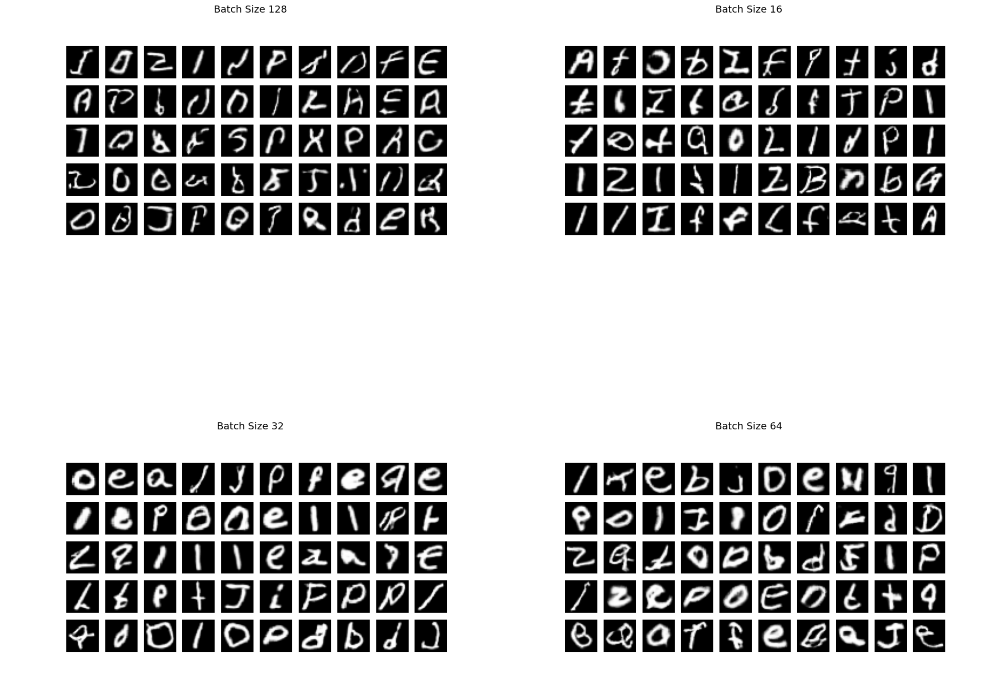

In [54]:
# Directory containing the generated images
folder = "DCGAN_generated_batchsize"

# Get all PNG files that match the naming pattern
image_files = sorted([f for f in os.listdir(folder) if f.startswith("sample50_bs") and f.endswith(".png")])

# Grid dimensions
cols = 2  # Adjust as needed for layout
rows = (len(image_files) + cols - 1) // cols  # round up

# Create large figure
fig, axs = plt.subplots(rows, cols, figsize=(cols * 10, rows * 10))  # each image gets 10x10 space

# Flatten axes for easy indexing
axs = axs.flatten()

# Plot each image
for i, filename in enumerate(image_files):
    img_path = os.path.join(folder, filename)
    img = mpimg.imread(img_path)
    axs[i].imshow(img)
    axs[i].set_title(f"Batch Size {filename.split('_bs')[1].split('.')[0]}", fontsize=14)
    axs[i].axis('off')

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

**OBSERVATIONS:**

Batch Size (16):

- Passable: 32/50
- Nonsense: 18/50

Batch Size (32):

- Passable: 33/50
- Nonsense: 17/50

Batch Size (64):

- Passable: 32/50
- Nonsense: 18/50

Batch Size (128):

- Passable: 19/50
- Nonsense: 31/50

**Why did Batch Size 128 perform the worst?**

1. Fewer Learning Steps

- Bigger batch = fewer updates per epoch.
- The generator doesn't get enough chances to improve.
- At just 20 epochs, this really slows down learning.

2. Less Variety = Worse Images

- Big batches make learning too stable.
- GANs actually need a bit of randomness to learn diverse, realistic images.
- Without it, results can become repetitive or blurry.

3. Weaker Feedback

- GANs need strong feedback between the generator and discriminator.
- With big batches, that feedback becomes too smooth or weak.
- So the generator can’t learn what’s wrong with its images.

**Best Batch Size:**

Based on Human Evaluation Score, Batch Size 32 is the best. 64 & 16 also work fine but 32 generated the cleanest images, thus we will stick with 32 for our best batch size.

### 3) More Epochs

**WHILE TRAINING 300 EPOCHS:**

Epoch 250/250
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 219s 126ms/step - d_loss: 0.1014 - g_loss: 12.0295<br>
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 946ms/step

Training with epochs: 300, batch size: 32<br>
Epoch 1/300<br>
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 226s 127ms/step - d_loss: 0.5577 - g_loss: 14.1000<br>
Epoch 2/300<br>
 531/1706 ━━━━━━━━━━━━━━━━━━━━ 2:20 120ms/step - d_loss: 0.5838 - g_loss: 1.1158

The initial training went smoothly, only take about 20 seconds per epoch when we were training for 100, 150, 200 epochs.

However, when trying to train for 250 epochs, each epoch was taking about a minute and it slowly rose to 3.5 minutes at the last epoch.

We thought that maybe this would reset when training for 300 epochs so that we would not waste a large amount of time, however, from the above results, we can see that each epoch was still taking about 3.5 minutes.

We decided to hypertune for 50 to 200 epochs for our final code.

We will still plot the images for 250 epochs since we saved them in the previous attempt.

In [60]:
epochs_list = [50, 100, 150, 200]
latent_dim = 100
batch_size = 32  # Fixed

# Function to save 50 sample images after training
def save_imgs_sample_50(generator, latent_dim, config_name):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = generator.predict(noise)

    # Rescale from [-1, 1] to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_epochs', exist_ok=True)
    fig.savefig(f"DCGAN_generated_epochs/sample50_e{config_name}.png")
    plt.close()

# Main training loop over different epoch counts
for epochs in epochs_list:
    print(f"\nTraining with epochs: {epochs}, batch size: {batch_size}")

    # Create dataset
    dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(buffer_size=1024).batch(batch_size)

    # Rebuild model
    gan = GAN(
        discriminator=keras.models.clone_model(discriminator),
        generator=keras.models.clone_model(generator),
        latent_dim=latent_dim
    )

    gan.compile(
        d_optimizer=keras.optimizers.Adam(learning_rate=0.0004, beta_1=0.5),  # Fixed
        g_optimizer=keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5),  # Fixed
        loss_fn=keras.losses.BinaryCrossentropy()
    )

    # Name of this run
    run_name = f"{epochs}"

    # Train
    gan.fit(
        dataset,
        epochs=epochs,
        callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=epochs)],
    )

    # Save 50 images after training for this epoch count
    save_imgs_sample_50(gan.generator, latent_dim, config_name=run_name)


Training with epochs: 50, batch size: 32
Epoch 1/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - d_loss: 1.5504 - g_loss: 29.2673
Epoch 2/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5755 - g_loss: 1.1995
Epoch 3/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5947 - g_loss: 1.1094
Epoch 4/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - d_loss: 0.5723 - g_loss: 1.1770
Epoch 5/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5693 - g_loss: 1.1694
Epoch 6/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 19s 11ms/step - d_loss: 0.5708 - g_loss: 1.1667
Epoch 7/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5699 - g_loss: 1.1734
Epoch 8/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - d_loss: 0.5662 - g_loss: 1.1883
Epoch 9/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - d_loss: 0.5609 - g_loss: 1.2182
Epoch 10/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - d_loss: 0.5588 - g_loss: 1.2338
Epoch 11/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - d_l

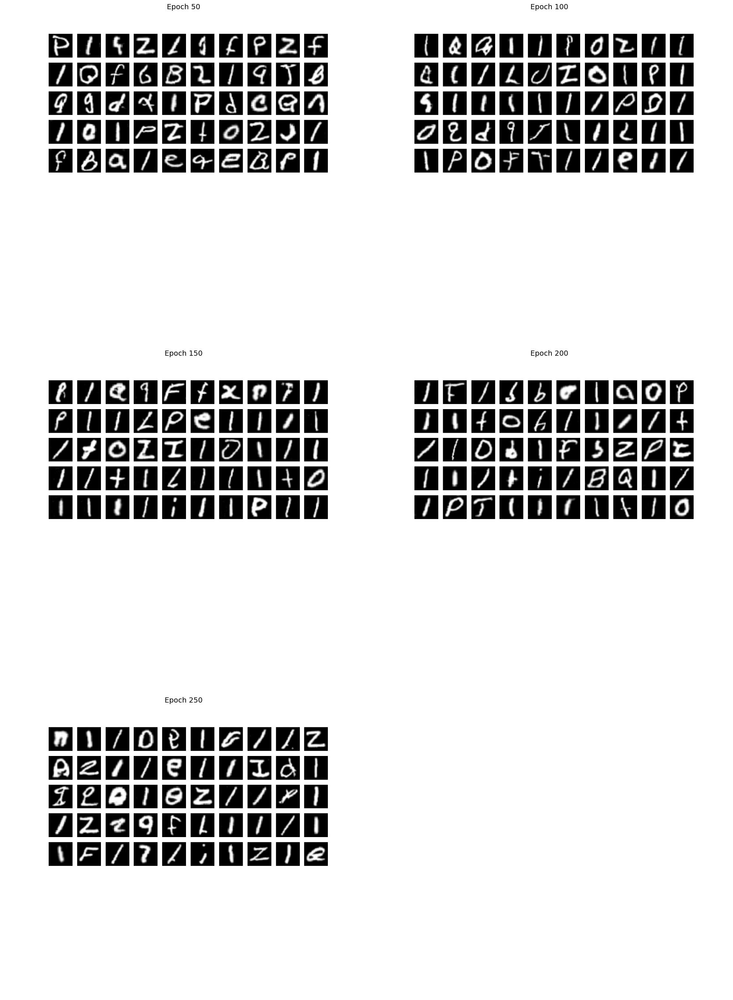

In [62]:
# Directory containing the generated images
folder = "DCGAN_generated_epochs"

# Epochs you want to display
epochs_to_plot = [50, 100, 150, 200, 250]

# Build file list in the desired order
image_files = [f"sample50_e{epoch}.png" for epoch in epochs_to_plot]

# Grid dimensions
cols = 2  # Number of images per row
rows = (len(image_files) + cols - 1) // cols

# Create figure
fig, axs = plt.subplots(rows, cols, figsize=(cols * 10, rows * 10))
axs = axs.flatten()

# Plot images
for i, filename in enumerate(image_files):
    img_path = os.path.join(folder, filename)
    img = mpimg.imread(img_path)
    axs[i].imshow(img)
    axs[i].set_title(f"Epoch {epochs_to_plot[i]}", fontsize=14)
    axs[i].axis('off')

# Hide unused subplots if any
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

**OBSERVATIONS:**

Epochs (50):

- Passable: 38/50
- Nonsense: 12/50

Epochs (100):

- Passable: 42/50
- Nonsense: 8/50

Epochs (150):

- Passable: 44/50
- Nonsense: 6/50

Epochs (200):

- Passable: 40/50
- Nonsense: 10/50

Epochs (250):

- Passable: 40/50
- Nonsense: 10/60

**DESCRIPTION:**

Epoch 50 produced 38/50 passable images, with a relatively balanced spread of letter types and the least noticeable bias toward a single character.

Epoch 100 and 150 improved passable rates to 42/50 and 44/50 respectively, but began showing a stronger tendency to generate the letter “l” more frequently.

Epoch 200 and 250 saw a slight drop in passable rate (40/50), with the same letter bias persisting and occasional regression in variety.

Across all later epochs (100+), increased training appeared to improve sharpness but reduced diversity.

**CONCLUSION:**

Best Epochs: 50

While 150 epochs gave the highest passable rate (44/50), it also exhibited the most bias toward a single letter (26 "l" generated), which reduces usefulness for a balanced multi-class generator. Epoch 50 offers the best trade-off between quality and variety, with fewer biased outputs and reasonably high passable quality.

---

## Best Model

---

After hyperparameter tuning, we found that:

- Best Batch Size: 32
- Best Learning Rates: Discriminator LR = 0.0004, Generator LR = 0.0001
- Best Epochs: 50

Our final best model:

In [63]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 1)),
        layers.GaussianNoise(0.1),  # Add Gaussian noise to inputs
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same"),
        layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Conv2D(256, kernel_size=3, strides=1, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.LeakyReLU(alpha=0.2),
        layers.Dropout(0.25),
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)

In [64]:
latent_dim = 100

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(7 * 7 * 256),  # More features
        layers.Reshape((7, 7, 256)),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation('relu'),

        layers.UpSampling2D(),  # 14x14
        layers.Conv2D(128, kernel_size=3, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(128, kernel_size=3, padding="same"),  # Extra conv
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.UpSampling2D(),  # 28x28
        layers.Conv2D(64, kernel_size=3, padding="same"),
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(32, kernel_size=3, padding="same"),  # Final feature layer
        layers.BatchNormalization(momentum=0.8),
        layers.Activation("relu"),

        layers.Conv2D(1, kernel_size=3, padding="same", activation="tanh"),
    ],
    name="generator",
)

In [65]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(1337)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = ops.concatenate([generated_images, real_images], axis=0)

        # Assemble labels discriminating real from fake images
        labels = ops.concatenate(
            [ops.ones((batch_size, 1)), ops.zeros((batch_size, 1))], axis=0
        )
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        # Assemble labels that say "all real images"
        misleading_labels = ops.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [66]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=160, latent_dim=100, total_epochs=50):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.total_epochs = total_epochs
        self.seed_generator = keras.random.SeedGenerator(42)
        self.output_dir = "DCGAN_generated_best_model"  # Updated folder name

    def on_epoch_end(self, epoch, logs=None):
        # Save images and weights every 10 epochs
        if (epoch + 1) % 10 == 0:
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors)
            generated_images = generated_images * 127.5 + 127.5  # [-1, 1] → [0, 255]
            generated_images = tf.clip_by_value(generated_images, 0, 255)
            generated_images = tf.cast(generated_images, tf.uint8).numpy()

            os.makedirs(self.output_dir, exist_ok=True)
            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images[i])
                img.save(f"{self.output_dir}/generated_img_{epoch+1:03d}_{i}.png")

            # Save weights every 10 epochs
            self.model.generator.save_weights(f"{self.output_dir}/generator_epoch_{epoch+1:03d}.weights.h5")
            self.model.discriminator.save_weights(f"{self.output_dir}/discriminator_epoch_{epoch+1:03d}.weights.h5")

In [67]:
# Best parameters from hypertuning
best_batch_size = 32
best_d_lr = 0.0004
best_g_lr = 0.0001
best_epochs = 50

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=best_d_lr, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=best_g_lr, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan.fit(
    X_train,
    batch_size=best_batch_size,
    epochs=best_epochs,
    callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim, total_epochs=best_epochs)]
)

Epoch 1/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 32s 13ms/step - d_loss: 0.3914 - g_loss: 11.3020
Epoch 2/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - d_loss: 0.5780 - g_loss: 1.1403
Epoch 3/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - d_loss: 0.5425 - g_loss: 1.2541
Epoch 4/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - d_loss: 0.5385 - g_loss: 1.2853
Epoch 5/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 19s 11ms/step - d_loss: 0.5397 - g_loss: 1.2937
Epoch 6/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 20s 12ms/step - d_loss: 0.5443 - g_loss: 1.2739
Epoch 7/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - d_loss: 0.5468 - g_loss: 1.2707
Epoch 8/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 16s 9ms/step - d_loss: 0.5454 - g_loss: 1.2743
Epoch 9/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 16s 10ms/step - d_loss: 0.5410 - g_loss: 1.2914
Epoch 10/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - d_loss: 0.5431 - g_loss: 1.2758
Epoch 11/50
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - d_loss: 0.5415 - g_loss: 1.2875
Epoch 12

In [68]:
def save_imgs(epoch):
    num_classes = 16
    samples_per_class = 10
    noise = np.random.normal(0, 1, (num_classes * samples_per_class, latent_dim))
    generated_images = gan.generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5  # rescale to [0,1]

    fig, axs = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axs[i, j].imshow(generated_images[idx].squeeze(), cmap='gray')
            axs[i, j].axis('off')

    plt.tight_layout()
    os.makedirs('DCGAN_generated_best_model', exist_ok=True)  # Changed folder here
    fig.savefig(f"DCGAN_generated_best_model/DCGAN_{epoch}.png")  # Changed folder here
    plt.show()
    plt.close()

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step


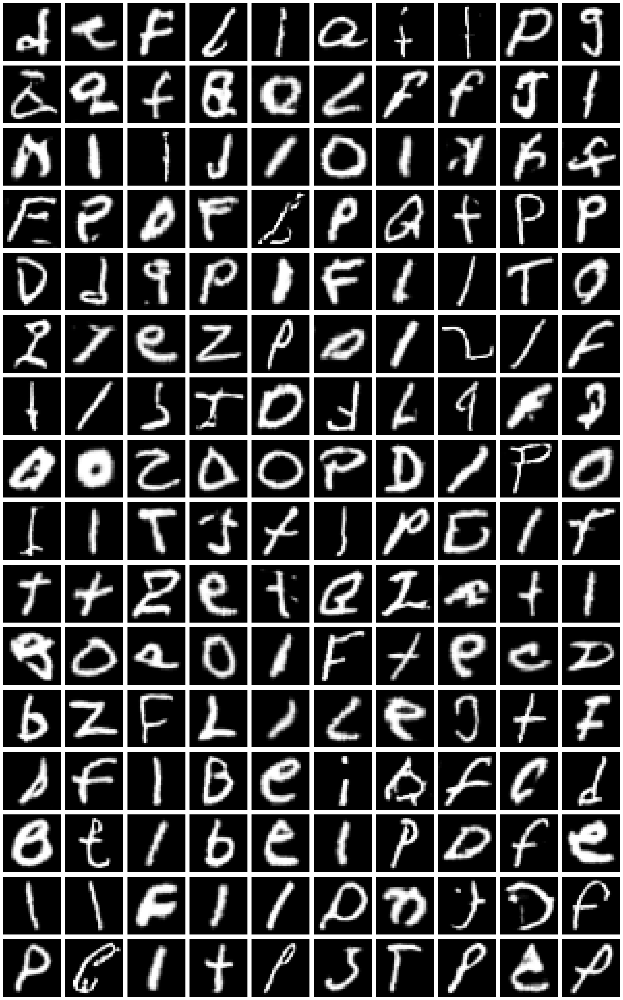

In [69]:
save_imgs(50)

In [70]:
def save_imgs_sample_50(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = gan.generator.predict(noise)

    # Rescale images from [-1, 1] to [0, 1] for visualization
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    os.makedirs('DCGAN_generated_best_model', exist_ok=True)  # Changed folder here
    fig.savefig("DCGAN_generated_best_model/DCGAN__sample50_{:d}.png".format(epoch))  # Changed folder here
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step


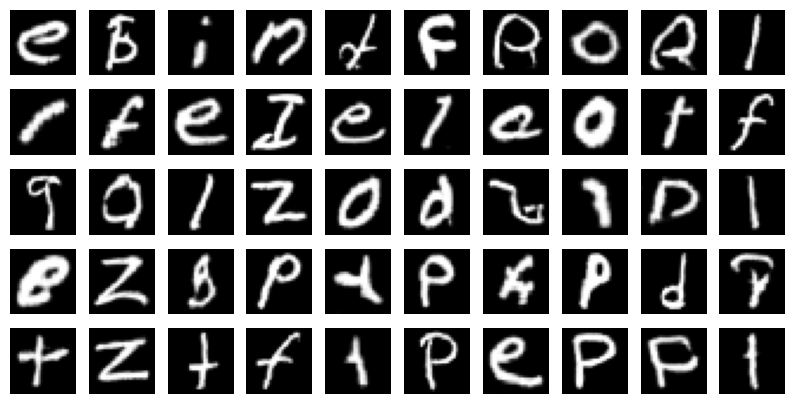

In [71]:
save_imgs_sample_50(50)

**OBSERVATIONS:**

Human Evaluation Score:

- Passable: 36/50
- Nonsense:14/50

**What class(es) is/are relatively easier/harder to generate? Why?**

Easier classes:

- Letters with distinct, simple shapes and minimal variation in handwriting, e.g. L, O
- The generator can learn them quickly because they have low intra-class variability and clear contrast from other classes.

Harder classes:

1. Visually similar letters: e.g. I vs J, E vs F.

- These are harder because small stroke variations become significant to human perception but are subtle for the GAN to capture.
- There’s also a risk of mode collapse, where the generator produces shapes blending features from multiple similar letters.

2. Capital vs. lowercase pairs with very different shapes: e.g. a vs A, g vs G.

- Even though they share the same semantic meaning, their structures are almost entirely different in handwriting.
- The model must essentially learn two distinct visual concepts for the same class label, which doubles the complexity for that class.
- This increases intra-class variability and can make it harder for the generator to converge on a clean representation.

**If you are asked to generate coloured images instead of black-and-white ones, do you think it would be easier or harder to produce better quality results?**

Producing high-quality results would likely be harder because:

- The generator must learn not only shape but also colour distributions and variations.
- Colour adds another dimension of variability, increasing the complexity of the mapping from latent space to output.

---

## Data Augmentation

---

Should we do data augmentation?

Check distribution of letters:

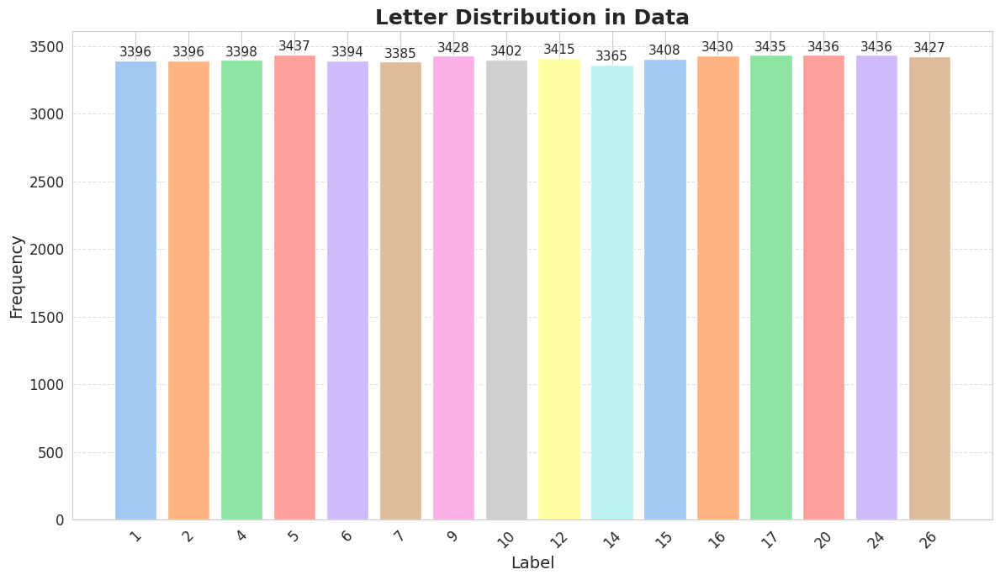

In [56]:
# Apply seaborn style
sns.set_style("whitegrid")

palette = sns.color_palette("pastel", n_colors=len(label_counts))

# Create the plot
plt.figure(figsize=(12, 7))
bars = plt.bar(label_counts.index.astype(str), label_counts.values, color=palette)

# Titles and labels
plt.title('Letter Distribution in Data', fontsize=18, fontweight='bold')
plt.xlabel('Label', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Add count labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 10, f'{int(height)}', 
             ha='center', va='bottom', fontsize=11)

plt.tight_layout()
plt.show()

**CONCLUSION:**

After analyzing the distribution of labels in the training dataset, it is cevident that the data is already evenly distributed across all classes. As shown in the bar chart, the frequency of each label is very similar, ranging from 3,365 (lowest) to 3,437 (highest) samples per class.

This indicates that there is no significant class imbalance that would negatively impact model performance or introduce bias during training.

We decided that data augmentaion was unnecessary. Applying augmentation in this scenario could risk introducing noise or artificial patterns that do not reflect the true data distribution. Therefore, we chose to proceed with the original dataset as it provides a robust and representative sample across all classes.

---

## For Part C

---

In [49]:
os.environ["KERAS_BACKEND"] = "tensorflow"

In [50]:
IMG_SHAPE = (28, 28, 1)
BATCH_SIZE = 32

# Size of the noise vector
noise_dim = 128

In [51]:
def conv_block(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    use_bias=True,
    use_bn=False,
    use_dropout=False,
    drop_value=0.5,
):
    x = layers.Conv2D(
        filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias
    )(x)
    if use_bn:
        x = layers.BatchNormalization()(x)
    x = activation(x)
    if use_dropout:
        x = layers.Dropout(drop_value)(x)
    return x


def get_discriminator_model():
    img_input = layers.Input(shape=IMG_SHAPE)
    # Zero pad the input to make the input images size to (32, 32, 1).
    x = layers.ZeroPadding2D((2, 2))(img_input)
    x = conv_block(
        x,
        64,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        use_bias=True,
        activation=layers.LeakyReLU(0.2),
        use_dropout=False,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        128,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=True,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        256,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=True,
        drop_value=0.3,
    )
    x = conv_block(
        x,
        512,
        kernel_size=(5, 5),
        strides=(2, 2),
        use_bn=False,
        activation=layers.LeakyReLU(0.2),
        use_bias=True,
        use_dropout=False,
        drop_value=0.3,
    )

    x = layers.Flatten()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(1)(x)

    d_model = keras.models.Model(img_input, x, name="discriminator")
    return d_model


d_model = get_discriminator_model()
d_model.summary()

I0000 00:00:1754805762.891437     470 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5592 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Ti, pci bus id: 0000:01:00.0, compute capability: 8.6


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 16, 16, 64)     │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 8, 8, 128)      │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 256)      │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 2, 2, 512)      │     3,277,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         2,049 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,305,409 (16.42 MB)

 Trainable params: 4,305,409 (16.42 MB)

 Non-trainable params: 0 (0.00 B)

In [52]:
def upsample_block(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1, 1),
    up_size=(2, 2),
    padding="same",
    use_bn=False,
    use_bias=True,
    use_dropout=False,
    drop_value=0.3,
):
    x = layers.UpSampling2D(up_size)(x)
    x = layers.Conv2D(
        filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias
    )(x)

    if use_bn:
        x = layers.BatchNormalization()(x)

    if activation:
        x = activation(x)
    if use_dropout:
        x = layers.Dropout(drop_value)(x)
    return x


def get_generator_model():
    noise = layers.Input(shape=(noise_dim,))
    x = layers.Dense(4 * 4 * 256, use_bias=False)(noise)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Reshape((4, 4, 256))(x)
    x = upsample_block(
        x,
        128,
        layers.LeakyReLU(0.2),
        strides=(1, 1),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x,
        64,
        layers.LeakyReLU(0.2),
        strides=(1, 1),
        use_bias=False,
        use_bn=True,
        padding="same",
        use_dropout=False,
    )
    x = upsample_block(
        x, 1, layers.Activation("tanh"), strides=(1, 1), use_bias=False, use_bn=True
    )
    # At this point, we have an output which has the same shape as the input, (32, 32, 1).
    # We will use a Cropping2D layer to make it (28, 28, 1).
    x = layers.Cropping2D((2, 2))(x)

    g_model = keras.models.Model(noise, x, name="generator")
    return g_model


g_model = get_generator_model()
g_model.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │       524,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 4096)           │        16,384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 64)     │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 1)      │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 1)      │             4 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cropping2d (Cropping2D)         │ (None, 28, 28, 1)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 910,660 (3.47 MB)

 Trainable params: 902,082 (3.44 MB)

 Non-trainable params: 8,578 (33.51 KB)

In [53]:
class WGAN(keras.Model):
    def __init__(
        self,
        discriminator,
        generator,
        latent_dim,
        discriminator_extra_steps=3,
        gp_weight=10.0,
    ):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images):
        """Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image
        alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]

        # Get the batch size
        batch_size = tf.shape(real_images)[0]

        # For each batch, we are going to perform the
        # following steps as laid out in the original paper:
        # 1. Train the generator and get the generator loss
        # 2. Train the discriminator and get the discriminator loss
        # 3. Calculate the gradient penalty
        # 4. Multiply this gradient penalty with a constant weight factor
        # 5. Add the gradient penalty to the discriminator loss
        # 6. Return the generator and discriminator losses as a loss dictionary

        # Train the discriminator first. The original paper recommends training
        # the discriminator for `x` more steps (typically 5) as compared to
        # one step of the generator. Here we will train it for 3 extra steps
        # as compared to 5 to reduce the training time.
        for i in range(self.d_steps):
            # Get the latent vector
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )
            with tf.GradientTape() as tape:
                # Generate fake images from the latent vector
                fake_images = self.generator(random_latent_vectors, training=True)
                # Get the logits for the fake images
                fake_logits = self.discriminator(fake_images, training=True)
                # Get the logits for the real images
                real_logits = self.discriminator(real_images, training=True)

                # Calculate the discriminator loss using the fake and real image logits
                d_cost = self.d_loss_fn(real_img=real_logits, fake_img=fake_logits)
                # Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # Add the gradient penalty to the original discriminator loss
                d_loss = d_cost + gp * self.gp_weight

            # Get the gradients w.r.t the discriminator loss
            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            # Update the weights of the discriminator using the discriminator optimizer
            self.d_optimizer.apply_gradients(
                zip(d_gradient, self.discriminator.trainable_variables)
            )

        # Train the generator
        # Get the latent vector
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            # Generate fake images using the generator
            generated_images = self.generator(random_latent_vectors, training=True)
            # Get the discriminator logits for fake images
            gen_img_logits = self.discriminator(generated_images, training=True)
            # Calculate the generator loss
            g_loss = self.g_loss_fn(gen_img_logits)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )
        return {"d_loss": d_loss, "g_loss": g_loss}

In [54]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=6, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = (generated_images * 127.5) + 127.5

        for i in range(self.num_img):
            img = generated_images[i].numpy()
            img = keras.utils.array_to_img(img)
            img.save("generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch))

In [55]:
# Instantiate the optimizer for both networks
# (learning_rate=0.0002, beta_1=0.5 are recommended)
generator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)
discriminator_optimizer = keras.optimizers.Adam(
    learning_rate=0.0002, beta_1=0.5, beta_2=0.9
)


# Define the loss functions for the discriminator,
# which should be (fake_loss - real_loss).
# We will add the gradient penalty later to this loss function.
def discriminator_loss(real_img, fake_img):
    real_loss = tf.reduce_mean(real_img)
    fake_loss = tf.reduce_mean(fake_img)
    return fake_loss - real_loss


# Define the loss functions for the generator.
def generator_loss(fake_img):
    return -tf.reduce_mean(fake_img)


# Set the number of epochs for training.
epochs = 100

# Instantiate the customer `GANMonitor` Keras callback.
cbk = GANMonitor(num_img=3, latent_dim=noise_dim)

# Get the wgan model
wgan = WGAN(
    discriminator=d_model,
    generator=g_model,
    latent_dim=noise_dim,
    discriminator_extra_steps=3,
)

# Compile the wgan model
wgan.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
    g_loss_fn=generator_loss,
    d_loss_fn=discriminator_loss,
)

# Start training
wgan.fit(X_train, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[cbk])

Epoch 1/100


I0000 00:00:1754805770.890840     715 service.cc:152] XLA service 0x704290027ee0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754805770.890879     715 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Ti, Compute Capability 8.6
2025-08-10 14:02:51.175361: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-08-10 14:02:51.351288: W tensorflow/compiler/tf2xla/kernels/random_ops.cc:62] Warning: Using tf.random.uniform with XLA compilation will ignore seeds; consider using tf.random.stateless_uniform instead if reproducible behavior is desired. random_uniform/RandomUniform
I0000 00:00:1754805772.480817     715 cuda_dnn.cc:529] Loaded cuDNN version 90300


   3/1706 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - d_loss: 0.6602 - g_loss: -2.2697  

I0000 00:00:1754805793.846324     715 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1706/1706 ━━━━━━━━━━━━━━━━━━━━ 112s 48ms/step - d_loss: -7.8319 - g_loss: -19.2659
Epoch 2/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -2.8995 - g_loss: -9.5547
Epoch 3/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -1.9468 - g_loss: -5.0416
Epoch 4/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -1.6978 - g_loss: -2.7973
Epoch 5/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -1.6523 - g_loss: -3.0614
Epoch 6/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 60s 35ms/step - d_loss: -1.5754 - g_loss: -3.6862
Epoch 7/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -1.4417 - g_loss: -2.5543
Epoch 8/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -1.3983 - g_loss: -3.2317
Epoch 9/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 63s 37ms/step - d_loss: -1.4272 - g_loss: -6.3628
Epoch 10/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 61s 36ms/step - d_loss: -1.2465 - g_loss: -3.1970
Epoch 11/100
1706/1706 ━━━━━━━━━━━━━━━━━━━━ 64s 37ms/step - d_loss: -1.3397 - g

In [56]:
def save_imgs_sample_50_wgan(epoch):
    r, c = 5, 10  # 5 rows × 10 columns = 50 images
    latent_dim = 128

    # Generate noise and images
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_imgs = g_model.predict(noise)

    # Rescale from [-1, 1] to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Plot
    fig, axs = plt.subplots(r, c, figsize=(c, r))
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    # Save
    os.makedirs('WGAN_generated_mnist', exist_ok=True)
    fig.savefig("WGAN_generated_mnist/wgan_mnist_sample50_{:d}.png".format(epoch))
    plt.show()
    plt.close()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step


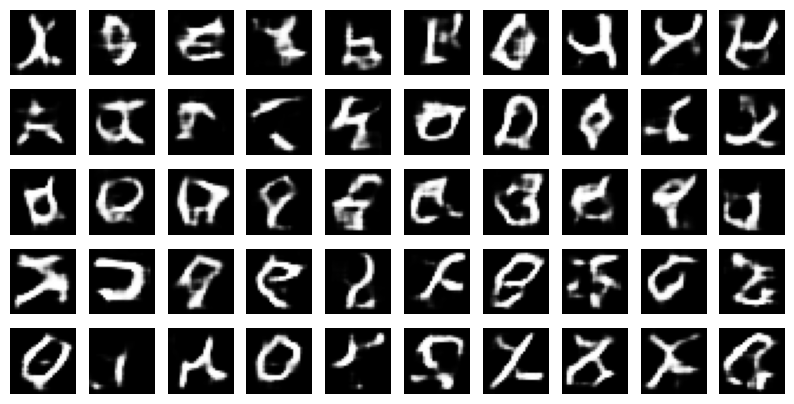

In [57]:
save_imgs_sample_50_wgan(epoch=10) 